In [1]:
# Standard libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error

# For Machine Learning (PyTorch)
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

root = "tensile_fatigue_data_v14.xlsx"
main_df = pd.read_excel(root)

## Pure DNN (With LogSigmoid)

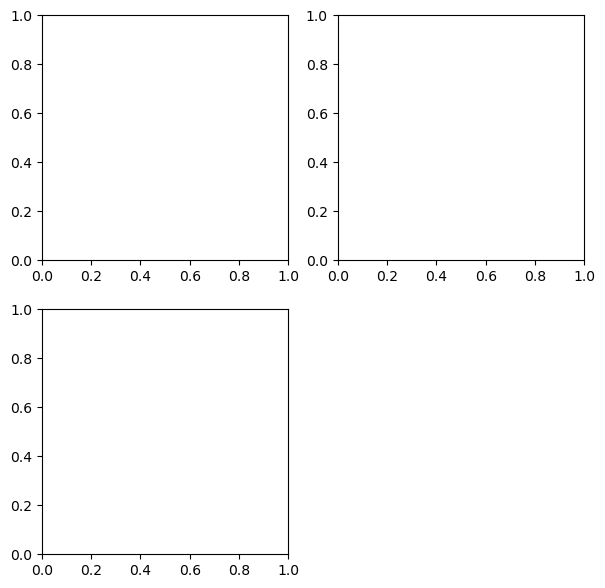

Epoch 1000/100000, Training Loss: 0.8019
Train R²:  0.00016
Test R² :  -0.10514


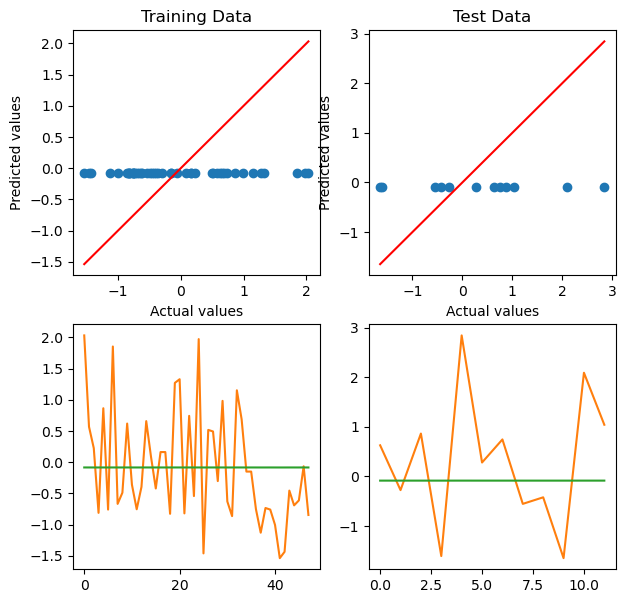

Epoch 2000/100000, Training Loss: 0.8018
Train R²:  0.00025
Test R² :  -0.10505


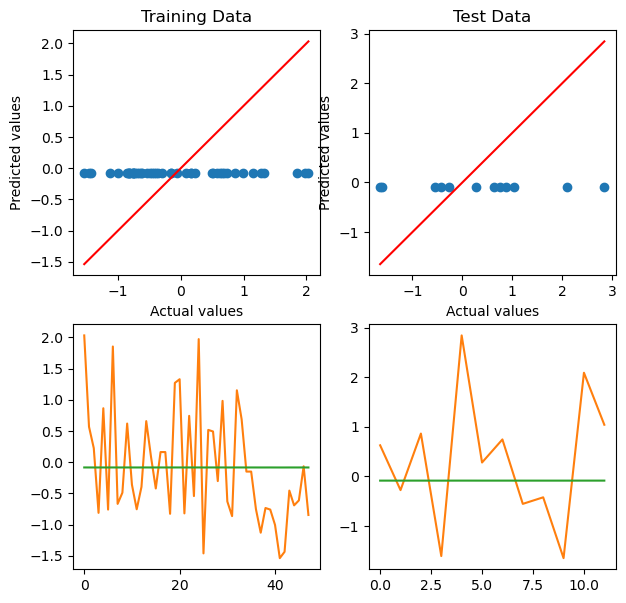

Epoch 3000/100000, Training Loss: 0.8017
Train R²:  0.00042
Test R² :  -0.10488


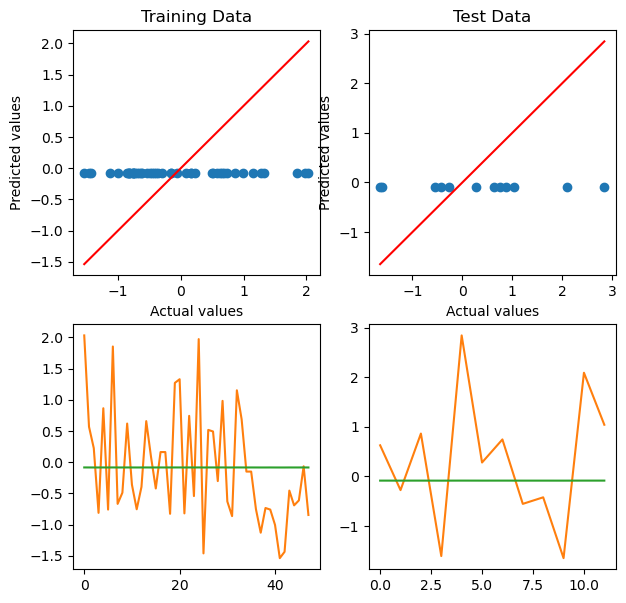

Epoch 4000/100000, Training Loss: 0.8014
Train R²:  0.00080
Test R² :  -0.10450


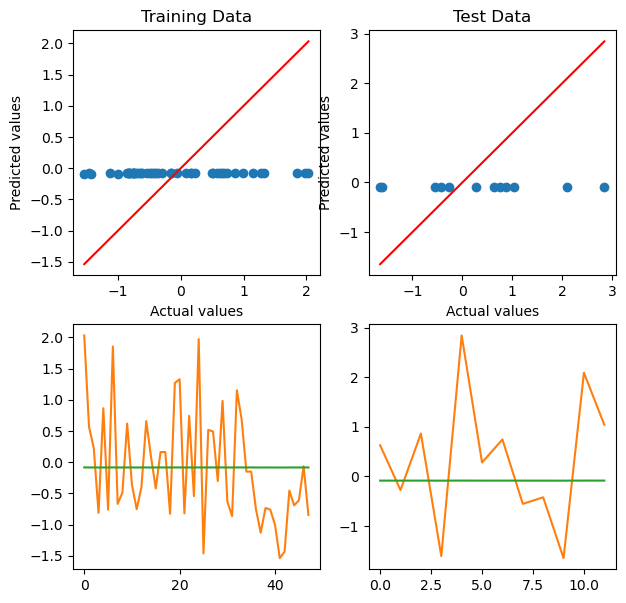

Epoch 5000/100000, Training Loss: 0.8003
Train R²:  0.00209
Test R² :  -0.10323


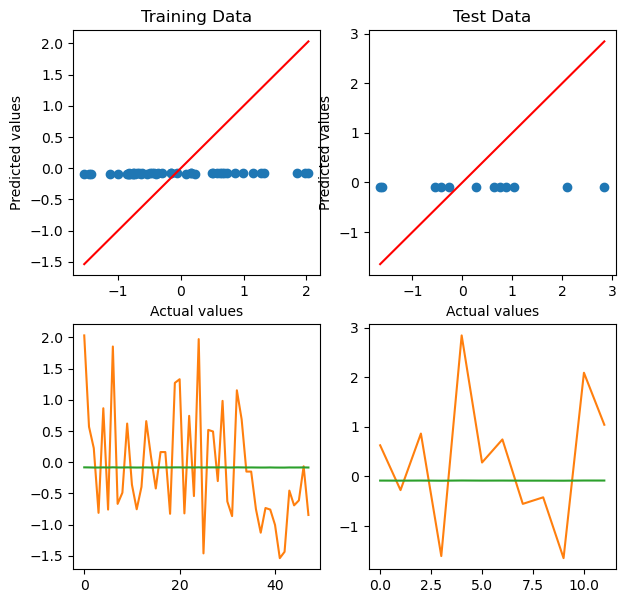

Epoch 6000/100000, Training Loss: 0.7886
Train R²:  0.01669
Test R² :  -0.08929


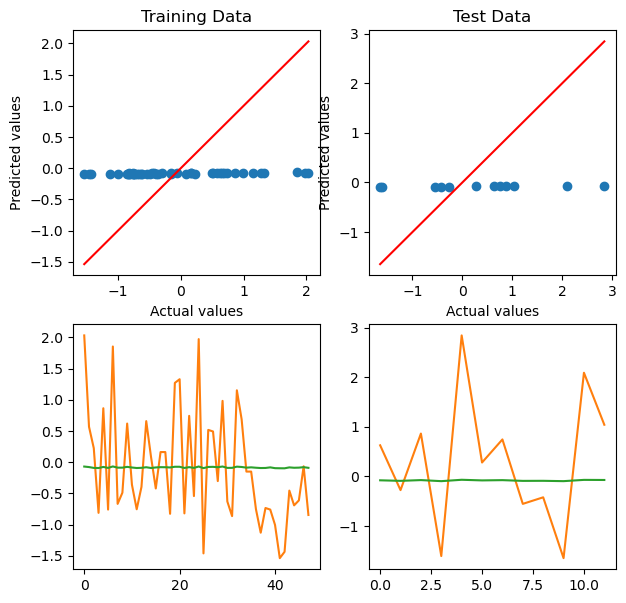

Epoch 7000/100000, Training Loss: 0.1195
Train R²:  0.85099
Test R² :  0.84752


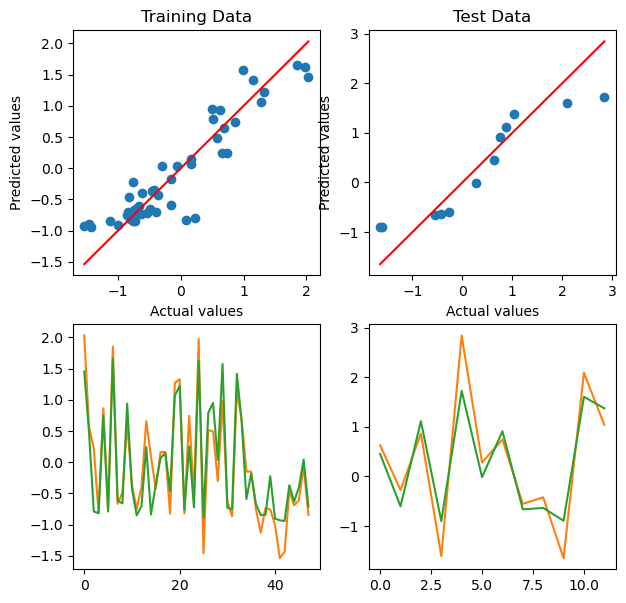

Epoch 8000/100000, Training Loss: 0.1123
Train R²:  0.85992
Test R² :  0.88455


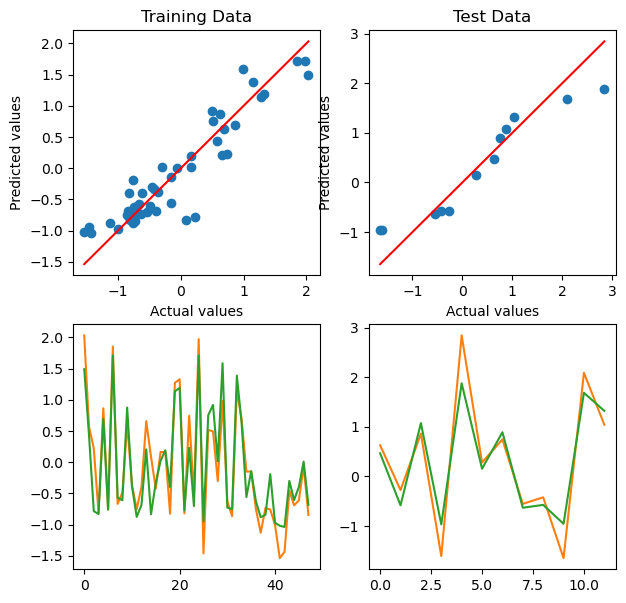

Epoch 9000/100000, Training Loss: 0.1022
Train R²:  0.87252
Test R² :  0.92923


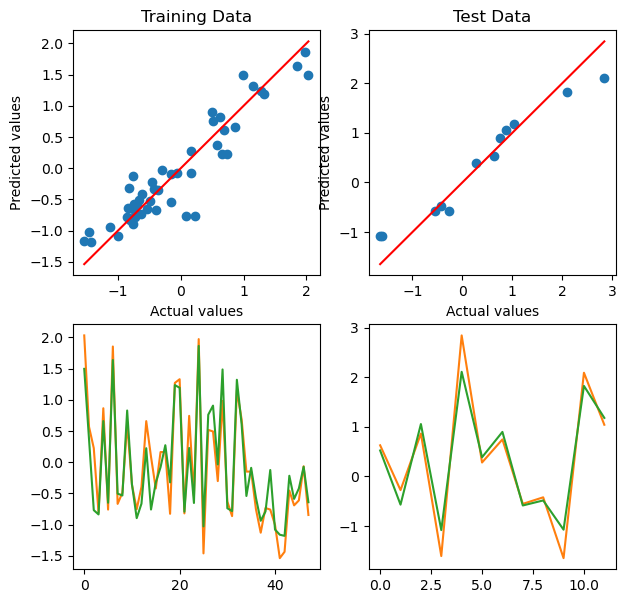

Epoch 10000/100000, Training Loss: 0.0975
Train R²:  0.87839
Test R² :  0.95213


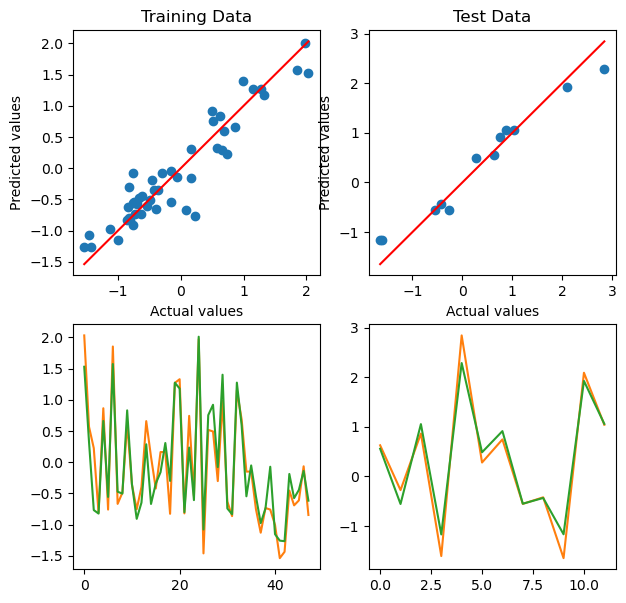

Epoch 11000/100000, Training Loss: 0.0941
Train R²:  0.88267
Test R² :  0.95351


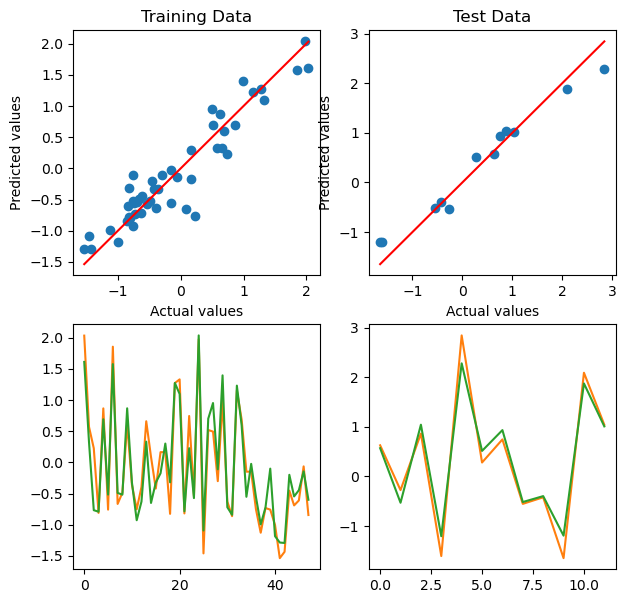

Epoch 12000/100000, Training Loss: 0.0893
Train R²:  0.88867
Test R² :  0.95025


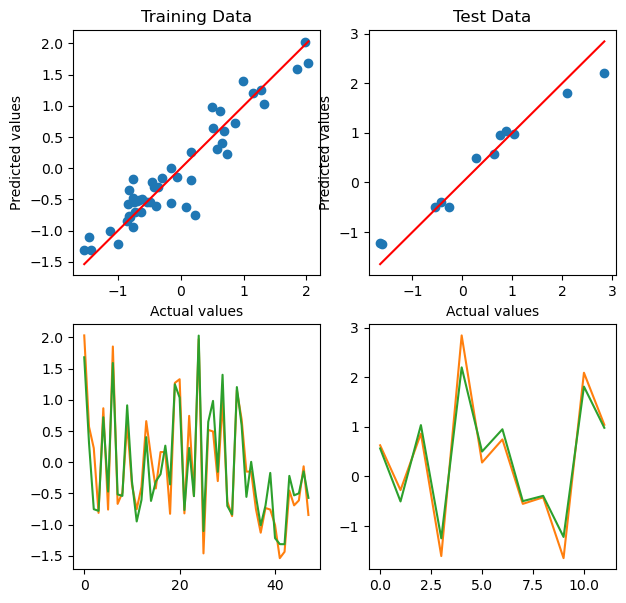

Epoch 13000/100000, Training Loss: 0.0786
Train R²:  0.90197
Test R² :  0.94152


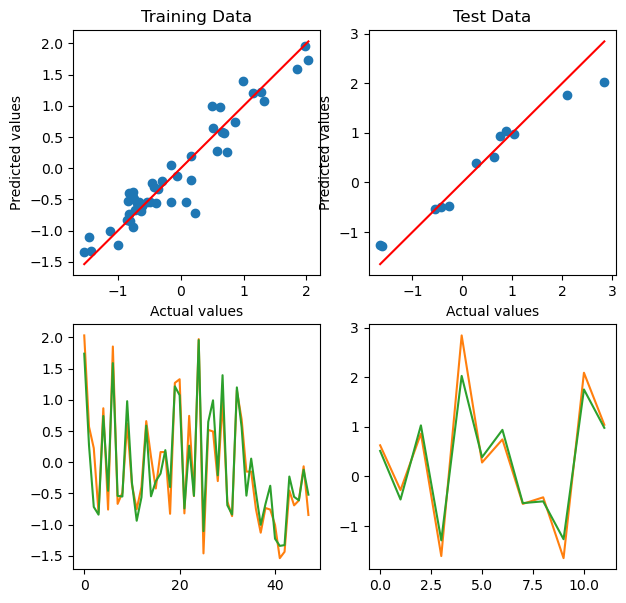

Epoch 14000/100000, Training Loss: 0.0673
Train R²:  0.91604
Test R² :  0.95241


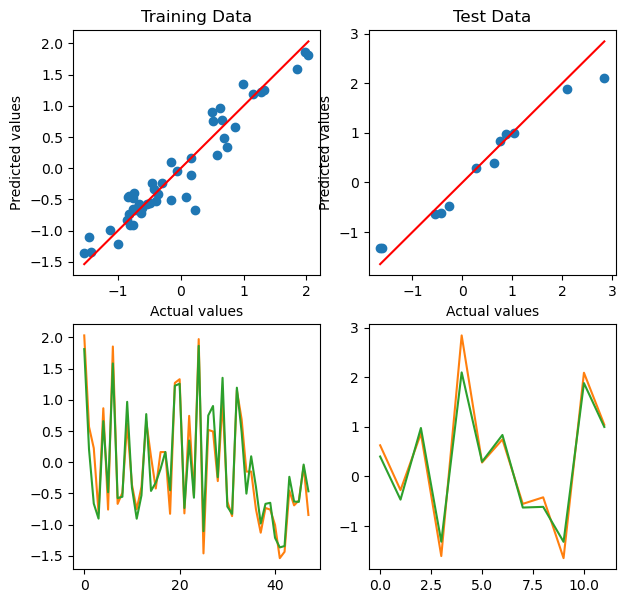

Epoch 15000/100000, Training Loss: 0.0597
Train R²:  0.92562
Test R² :  0.94233


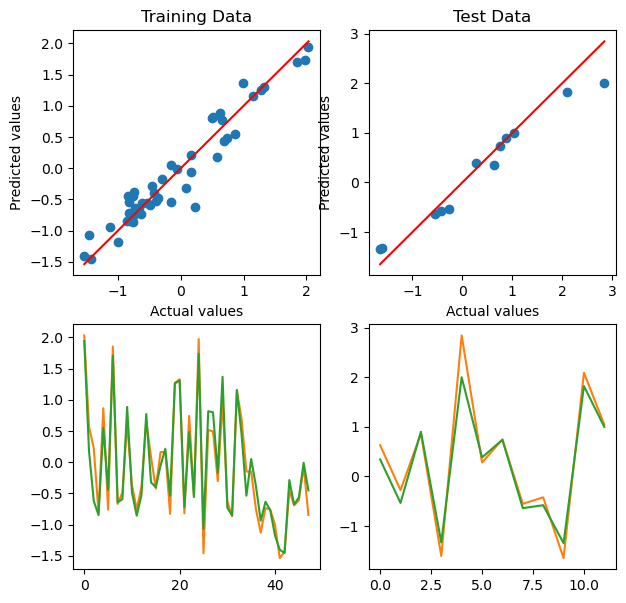

Epoch 16000/100000, Training Loss: 0.0543
Train R²:  0.93235
Test R² :  0.93404


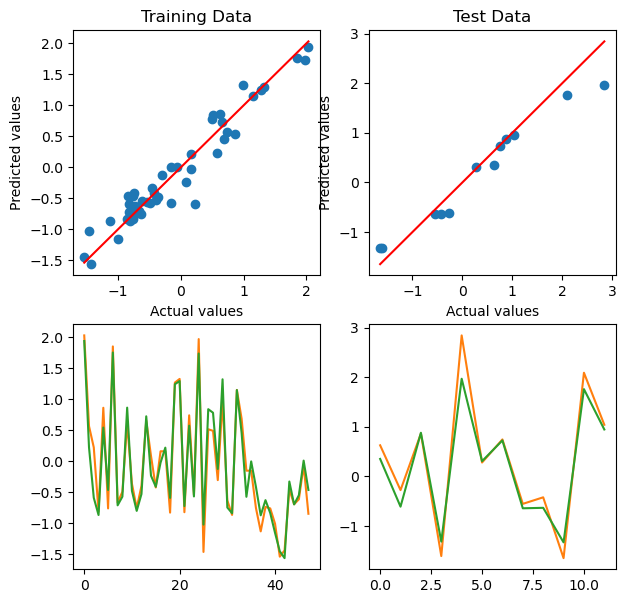

Epoch 17000/100000, Training Loss: 0.0495
Train R²:  0.93827
Test R² :  0.93317


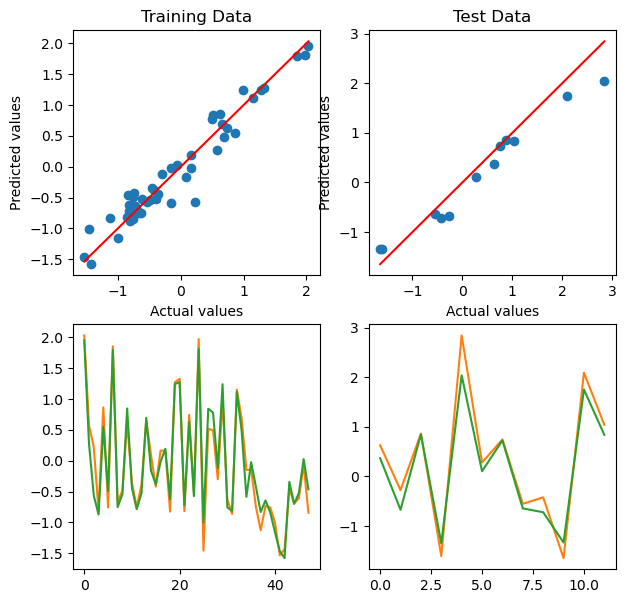

Epoch 18000/100000, Training Loss: 0.0458
Train R²:  0.94292
Test R² :  0.92398


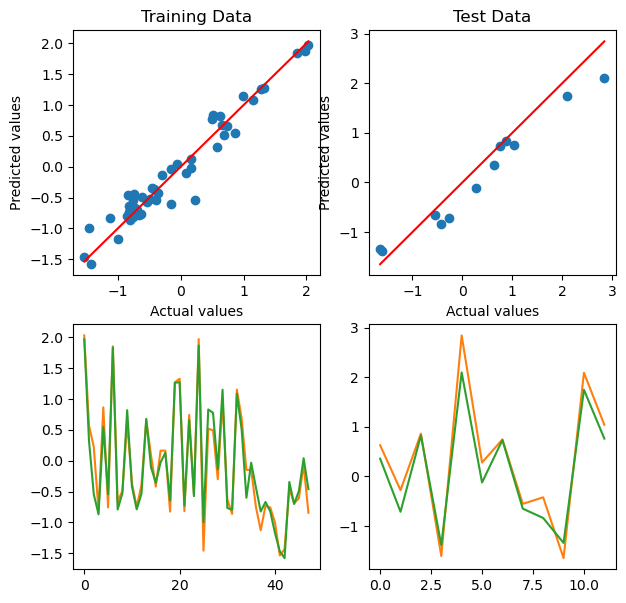

Epoch 19000/100000, Training Loss: 0.0433
Train R²:  0.94597
Test R² :  0.91430


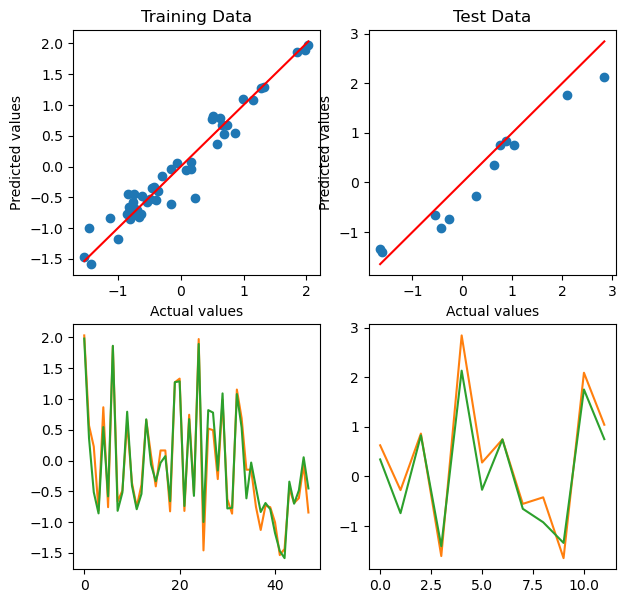

Epoch 20000/100000, Training Loss: 0.0415
Train R²:  0.94826
Test R² :  0.90833


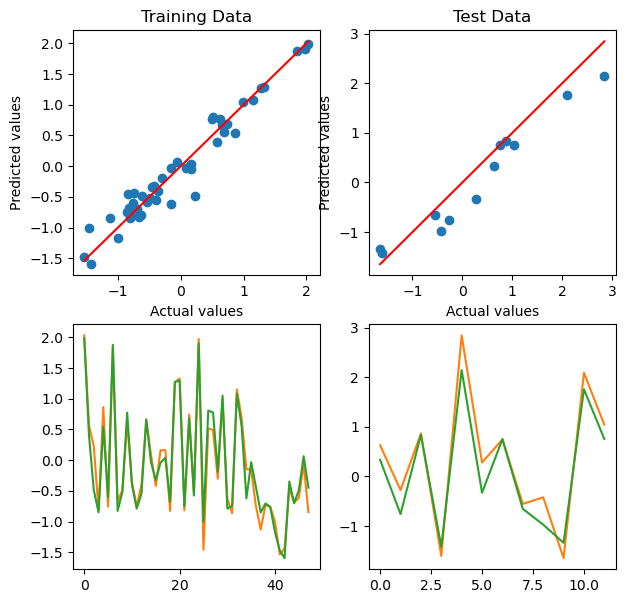

Epoch 21000/100000, Training Loss: 0.0397
Train R²:  0.95045
Test R² :  0.90446


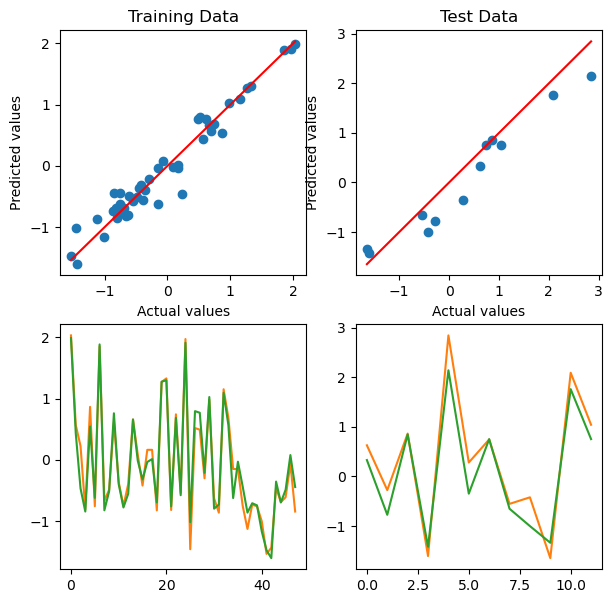

Epoch 22000/100000, Training Loss: 0.0377
Train R²:  0.95296
Test R² :  0.90496


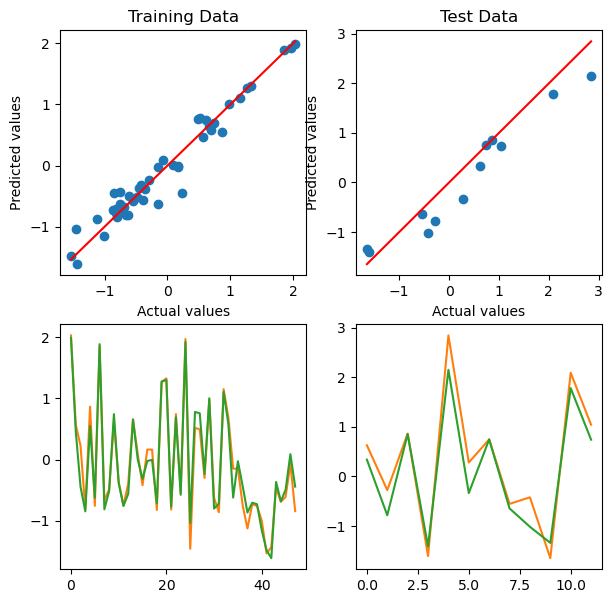

Epoch 23000/100000, Training Loss: 0.0352
Train R²:  0.95610
Test R² :  0.91397


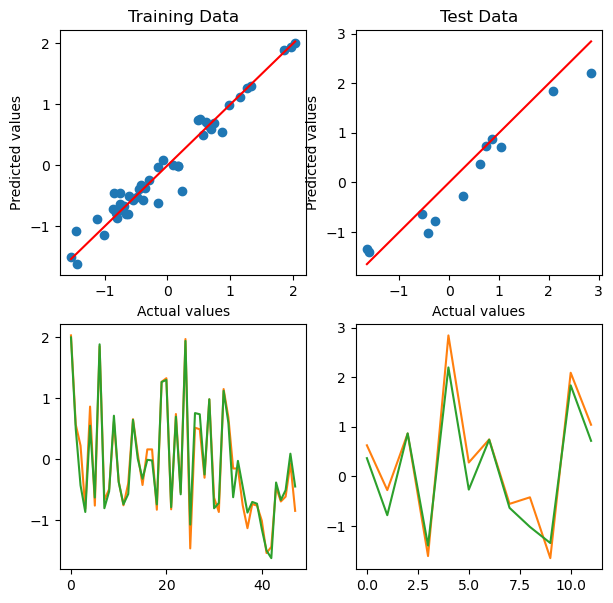

Epoch 24000/100000, Training Loss: 0.0321
Train R²:  0.95997
Test R² :  0.92968


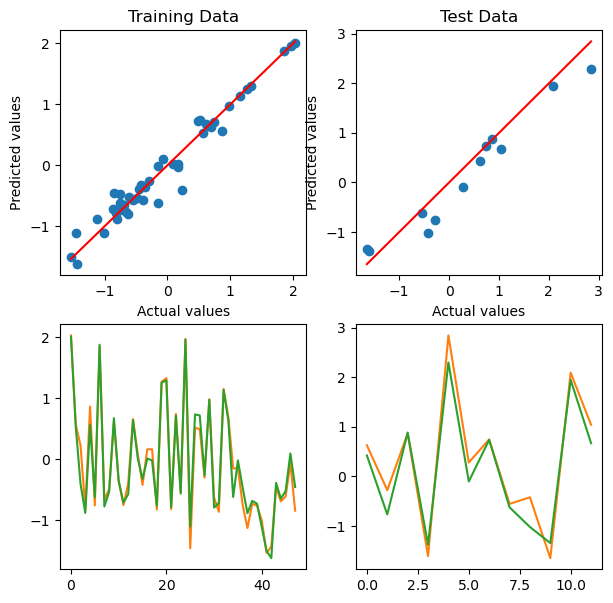

Epoch 25000/100000, Training Loss: 0.0283
Train R²:  0.96476
Test R² :  0.94077


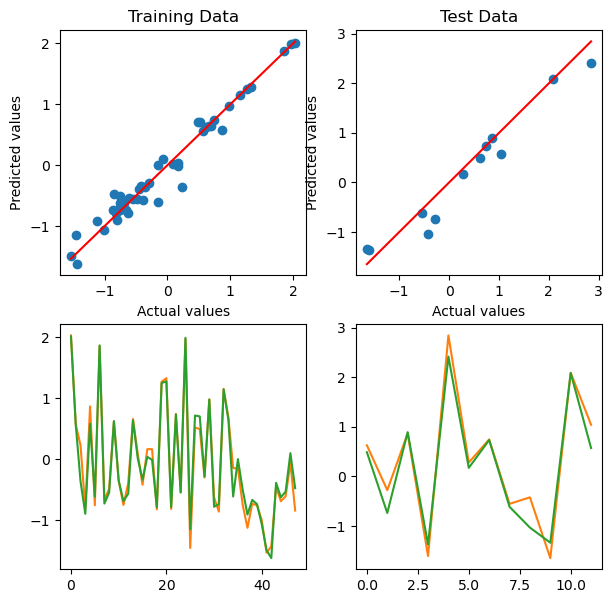

Epoch 26000/100000, Training Loss: 0.0235
Train R²:  0.97067
Test R² :  0.93355


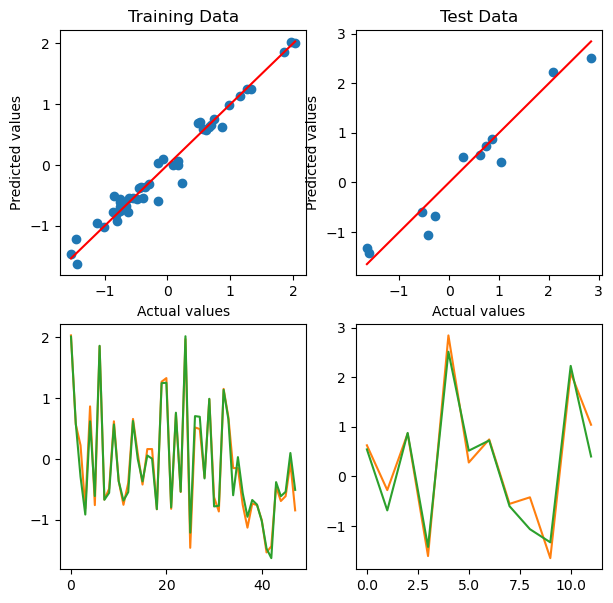

Epoch 27000/100000, Training Loss: 0.0188
Train R²:  0.97651
Test R² :  0.90157


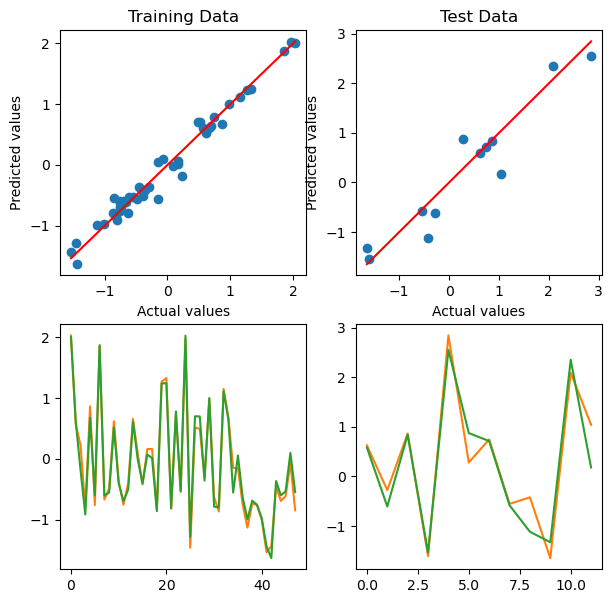

Epoch 28000/100000, Training Loss: 0.0155
Train R²:  0.98066
Test R² :  0.85498


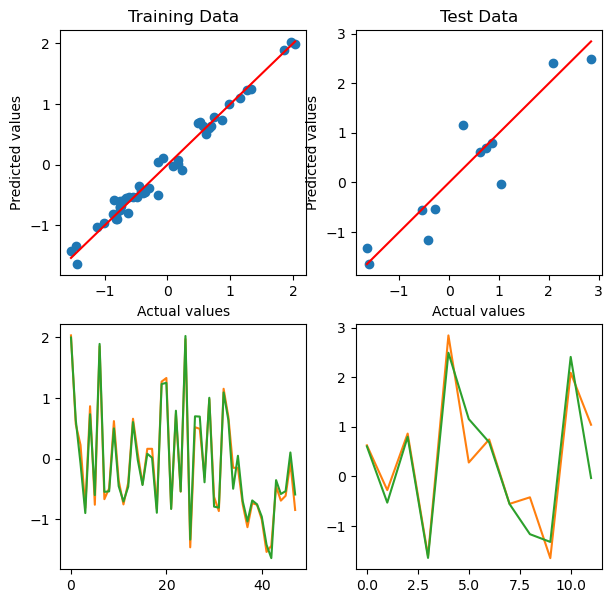

Epoch 29000/100000, Training Loss: 0.0132
Train R²:  0.98356
Test R² :  0.81335


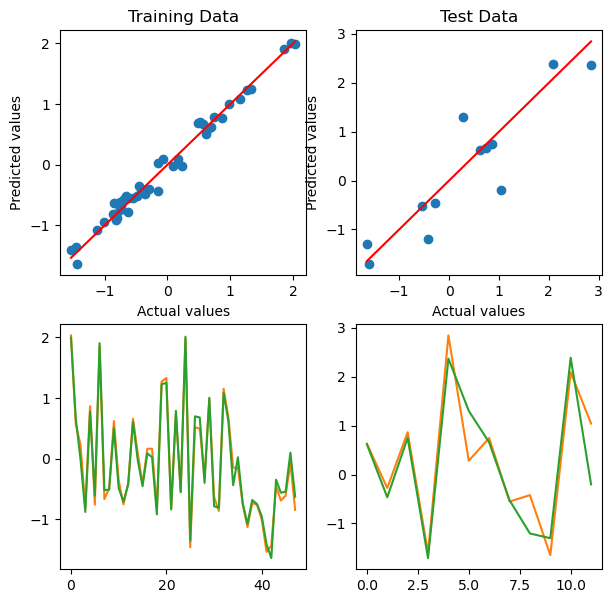

Epoch 30000/100000, Training Loss: 0.0113
Train R²:  0.98588
Test R² :  0.78028


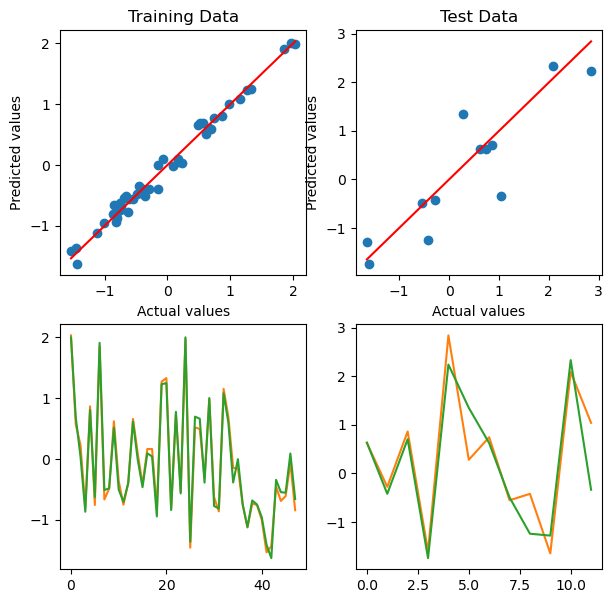

Epoch 31000/100000, Training Loss: 0.0098
Train R²:  0.98777
Test R² :  0.75416


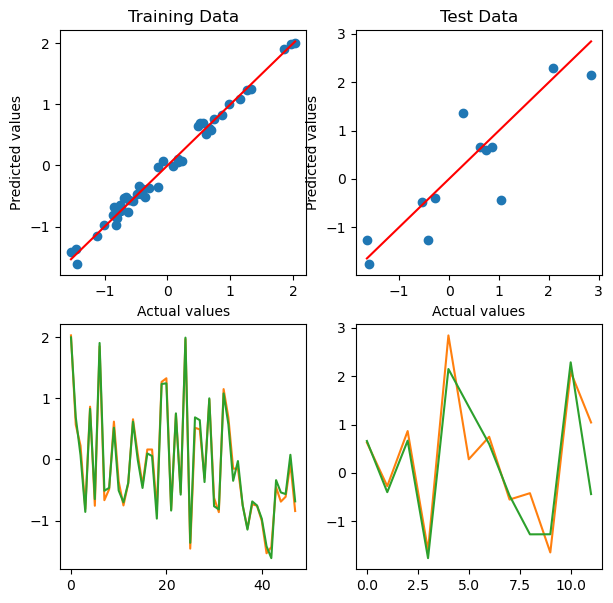

KeyboardInterrupt: 

In [3]:
X = pd.read_excel(root,usecols=[0,1,2,3,4])
y = pd.read_excel(root,usecols=[5])

# Normalize inputs
scaler_X = StandardScaler()
X_scaled = scaler_X.fit_transform(X)

scaler_y = StandardScaler()
y_scaled = scaler_y.fit_transform(y)

# Convert to PyTorch tensors
X_tensor = torch.tensor(X_scaled, dtype=torch.float32)
y_tensor = torch.tensor(y_scaled, dtype=torch.float32)

# Split into train/test
X_train, X_test, y_train, y_test = train_test_split(X_tensor, y_tensor, test_size = 0.2, random_state = 10)

# Define the neural network
class DeepNN(nn.Module):
    def __init__(self, input_size = 5, hidden_size = 8, output_size = 1):
        super(DeepNN, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, hidden_size)
        self.fc4 = nn.Linear(hidden_size, hidden_size)
        self.fc5 = nn.Linear(hidden_size, hidden_size)
        self.out = nn.Linear(hidden_size, output_size)

        self.activation = nn.Sigmoid()  # Logistic sigmoid

    def forward(self, x):
        x = self.activation(self.fc1(x))
        x = self.activation(self.fc2(x))
        x = self.activation(self.fc3(x))
        x = self.activation(self.fc4(x))
        x = self.activation(self.fc5(x))
        x = self.out(x)
        return x

# Example instantiation
model = DeepNN()

# Loss function (Mean Squared Error for regression)
criterion = nn.MSELoss()

# Optimizer: SGD with momentum
optimizer = optim.SGD(model.parameters(), lr = 0.01, momentum = 0.9)

num_epochs = 100000
for epoch in range(num_epochs):
    # Forward pass
    outputs = model(X_train)
    y_train_pred = model(X_train)
    y_test_pred = model(X_test)
    loss = criterion(y_train_pred, y_train)

    # Backward and optimize
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    var_train = r2_score(y_train.data.numpy(), y_train_pred.detach().numpy())
    var_test  = r2_score(y_test.data.numpy(), y_test_pred.detach().numpy())

    if (epoch+1) % 1000 == 0:
        print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {loss.item():.4f}")
        print("Train R²: ", "%.5f" % round(var_train, 5))
        print("Test R² : ", "%.5f" % round(var_test, 5))
        
        y_train_c = y_train.data.numpy()
        y_test_c  = y_test.data.numpy()
        
        fig, axes = plt.subplots(2, 2, figsize = (7, 7))
        axes[0, 0].scatter(y_train, y_train_pred.detach().numpy())
        axes[0, 0].plot([min(y_train_c), max(y_train_c)],[min(y_train_c), max(y_train_c)], color = 'r')
        axes[0, 0].set_title("Training Data")
        axes[0, 0].set_xlabel("Actual values")
        axes[0, 0].set_ylabel("Predicted values")

        axes[0, 1].scatter(y_test, y_test_pred.detach().numpy())
        axes[0, 1].plot([min(y_test_c), max(y_test_c)],[min(y_test_c), max(y_test_c)], color = 'r')
        axes[0, 1].set_title("Test Data")
        axes[0, 1].set_xlabel("Actual values")
        axes[0, 1].set_ylabel("Predicted values")

        axes[1, 0].plot(y_train.data.numpy().squeeze(),'tab:orange', label = 'real')
        axes[1, 0].plot(y_train_pred.detach().numpy(),'tab:green',label = 'pred')

        axes[1, 1].plot(y_test.data.numpy().squeeze(), 'tab:orange',label = 'real')
        axes[1, 1].plot(y_test_pred.detach().numpy(),'tab:green',label = 'pred')

        plt.draw();plt.pause(0.05)
    
    plt.ioff()
    plt.show()

## GBR + DNN

In [10]:
def GBR_HYP(X_train, X_test, y_train, y_test):
    n_estimate = [30000, 50000]
    l_rate = [0.001, 0.01]
    #l_rate = [0.001, 0.01, 0.1, 0.2]
    m_depth = [3, 4]
    #m_depth = [2, 3, 4]
    max_test_score = 0
    max_n = 0
    max_l = 0
    max_d = 0
    
    for x in range(len(n_estimate)):
        for y in range(len(l_rate)):
            for z in range(len(m_depth)):
                gbr = GradientBoostingRegressor(n_estimators = n_estimate[x],learning_rate = l_rate[y], max_depth = m_depth[z], random_state = 10, tol = 1e-5)
                gbr.fit(X_train, y_train)
    
                y_train_pred = gbr.predict(X_train)
                y_test_pred = gbr.predict(X_test)
    
                r2_train = r2_score(y_train, y_train_pred)
                r2_test  = r2_score(y_test, y_test_pred)
    
                print("GBR Parameters: n-estimators = ", n_estimate[x], " lr = ", l_rate[y], " max depth = ", m_depth[z])
                print("Train R²: ", "%.5f" % round(r2_train, 5))
                print("Test R² : ", "%.5f" % round(r2_test, 5))
    
                if r2_test > max_test_score:
                    max_test_score = r2_test
                    max_n = n_estimate[x]
                    max_l = l_rate[y]
                    max_d = m_depth[z]
    
    print("Best GBR Parameters: n-estimators = ", max_n, " lr = ", max_l, " max depth = ", max_d)
    return max_n, max_l, max_d

In [11]:
def GBR_DNN(variable):
    X = pd.read_excel(root,usecols=[0,1,2,3,4])
    y = pd.read_excel(root,usecols=[variable])
    
    # Normalize inputs
    scaler_X = StandardScaler()
    X_scaled = scaler_X.fit_transform(X)
    
    scaler_y = StandardScaler()
    y_scaled = scaler_y.fit_transform(y)
    
    # Use scaled data
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=10)
    
    # Convert y to float and flatten
    y_train = np.array(y_train, dtype=np.float32).ravel()
    y_test = np.array(y_test, dtype=np.float32).ravel()

    a1, a2, a3 = GBR_HYP(X_train, X_test, y_train, y_test)
    
    # Train the Gradient Boosting Regressor #70000, 0.001, 4
    gbr = GradientBoostingRegressor(n_estimators= a1, learning_rate= a2, max_depth= a3, random_state=10, tol=1e-5)
    gbr.fit(X_train, y_train)
    
    # Get GBR predictions
    gbr_train_pred = gbr.predict(X_train)
    gbr_test_pred = gbr.predict(X_test)
    
    # Augment inputs
    X_train_nn = np.hstack([X_train, gbr_train_pred.reshape(-1, 1)])
    X_test_nn = np.hstack([X_test, gbr_test_pred.reshape(-1, 1)])
    
    # Convert to tensors
    X_train = torch.tensor(X_train_nn, dtype=torch.float32)
    y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
    X_test = torch.tensor(X_test_nn, dtype=torch.float32)
    y_test = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)
    
    # Define the neural network
    class DeepNN(nn.Module):
        def __init__(self, input_size = 6, hidden_size = 16, output_size = 1):
            super(DeepNN, self).__init__()
            self.fc1 = nn.Linear(input_size, hidden_size)
            self.fc2 = nn.Linear(hidden_size, hidden_size)
            self.fc3 = nn.Linear(hidden_size, hidden_size)
            self.fc4 = nn.Linear(hidden_size, hidden_size)
            self.fc5 = nn.Linear(hidden_size, hidden_size)
            self.out = nn.Linear(hidden_size, output_size)
    
            self.activation = nn.Sigmoid()  # Logistic sigmoid
    
        def forward(self, x):
            x = self.activation(self.fc1(x))
            x = self.activation(self.fc2(x))
            x = self.activation(self.fc3(x))
            x = self.activation(self.fc4(x))
            x = self.activation(self.fc5(x))
            x = self.out(x)
            return x
    
    # Example instantiation
    model = DeepNN()
    
    # Loss function (Mean Squared Error for regression)
    criterion = nn.MSELoss()
    
    # Optimizer: SGD with momentum
    optimizer = optim.SGD(model.parameters(), lr = 0.01, momentum = 0.9)
    
    num_epochs = 100000
    for epoch in range(num_epochs):
        # Forward pass
        outputs = model(X_train)
        y_train_pred = model(X_train)
        y_test_pred = model(X_test)
        loss = criterion(y_train_pred, y_train)
    
        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
        var_train = r2_score(y_train.data.numpy(), y_train_pred.detach().numpy())
        var_test  = r2_score(y_test.data.numpy(), y_test_pred.detach().numpy())
    
        if (epoch+1) % 1000 == 0:
            print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {loss.item():.4f}")
            print("Train R²: ", "%.5f" % round(var_train, 5))
            print("Test R² : ", "%.5f" % round(var_test, 5))
            
            y_train_c = y_train.data.numpy()
            y_test_c  = y_test.data.numpy()
            
            fig, axes = plt.subplots(2, 2, figsize = (7, 7))
            axes[0, 0].scatter(y_train, y_train_pred.detach().numpy())
            axes[0, 0].plot([min(y_train_c), max(y_train_c)],[min(y_train_c), max(y_train_c)], color = 'r')
            axes[0, 0].set_title("Training Data")
            axes[0, 0].set_xlabel("Actual values")
            axes[0, 0].set_ylabel("Predicted values")
    
            axes[0, 1].scatter(y_test, y_test_pred.detach().numpy())
            axes[0, 1].plot([min(y_test_c), max(y_test_c)],[min(y_test_c), max(y_test_c)], color = 'r')
            axes[0, 1].set_title("Test Data")
            axes[0, 1].set_xlabel("Actual values")
            axes[0, 1].set_ylabel("Predicted values")
    
            axes[1, 0].plot(y_train.data.numpy().squeeze(),'tab:orange', label = 'real')
            axes[1, 0].plot(y_train_pred.detach().numpy(),'tab:green',label = 'pred')
    
            axes[1, 1].plot(y_test.data.numpy().squeeze(), 'tab:orange',label = 'real')
            axes[1, 1].plot(y_test_pred.detach().numpy(),'tab:green',label = 'pred')
    
            plt.draw();plt.pause(0.05)
        
        plt.ioff()
        plt.show()

GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  3
Train R²:  1.00000
Test R² :  0.92460
GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  4
Train R²:  1.00000
Test R² :  0.91334
GBR Parameters: n-estimators =  30000  lr =  0.01  max depth =  3
Train R²:  1.00000
Test R² :  0.92356
GBR Parameters: n-estimators =  30000  lr =  0.01  max depth =  4
Train R²:  1.00000
Test R² :  0.91304
GBR Parameters: n-estimators =  50000  lr =  0.001  max depth =  3
Train R²:  1.00000
Test R² :  0.92455
GBR Parameters: n-estimators =  50000  lr =  0.001  max depth =  4
Train R²:  1.00000
Test R² :  0.91334
GBR Parameters: n-estimators =  50000  lr =  0.01  max depth =  3
Train R²:  1.00000
Test R² :  0.92356
GBR Parameters: n-estimators =  50000  lr =  0.01  max depth =  4
Train R²:  1.00000
Test R² :  0.91304
Best GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  3
Epoch 1000/100000, Training Loss: 0.8020
Train R²:  0.00002
Test R² :  -0.10525


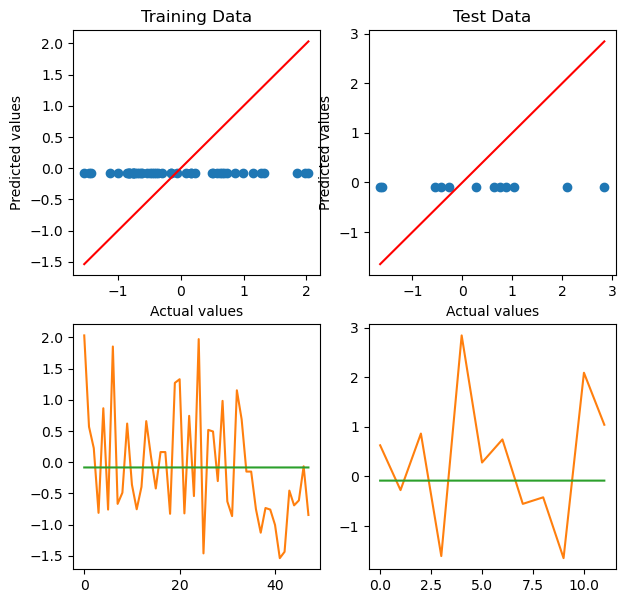

Epoch 2000/100000, Training Loss: 0.8020
Train R²:  0.00005
Test R² :  -0.10522


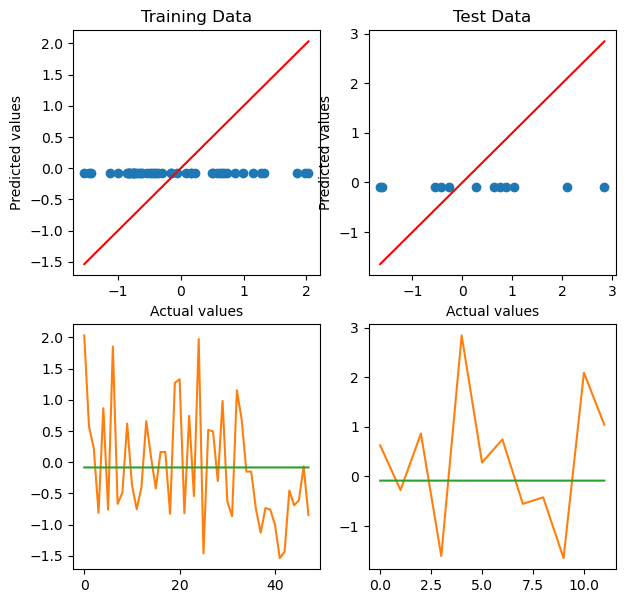

Epoch 3000/100000, Training Loss: 0.8020
Train R²:  0.00008
Test R² :  -0.10518


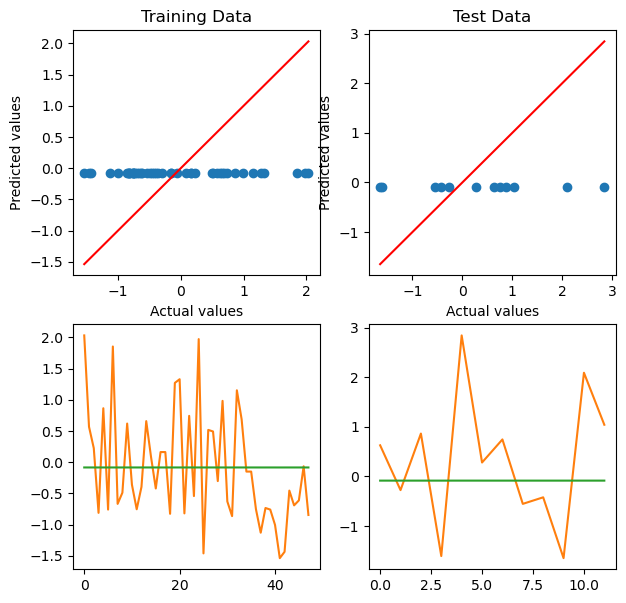

Epoch 4000/100000, Training Loss: 0.8019
Train R²:  0.00014
Test R² :  -0.10512


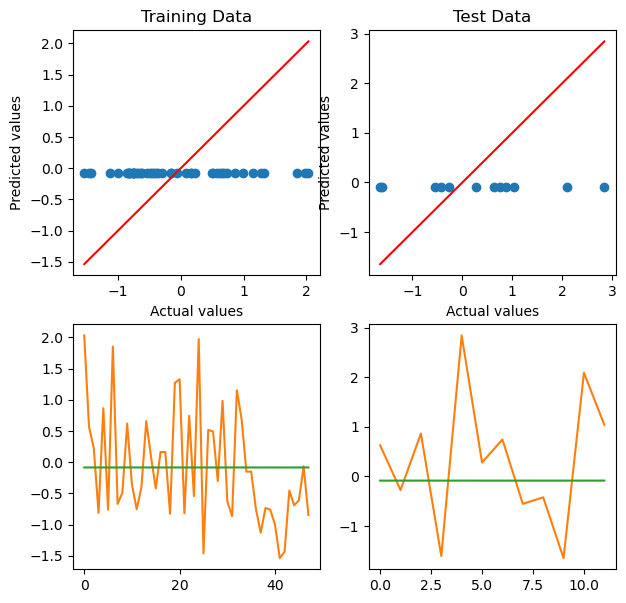

Epoch 5000/100000, Training Loss: 0.8018
Train R²:  0.00024
Test R² :  -0.10503


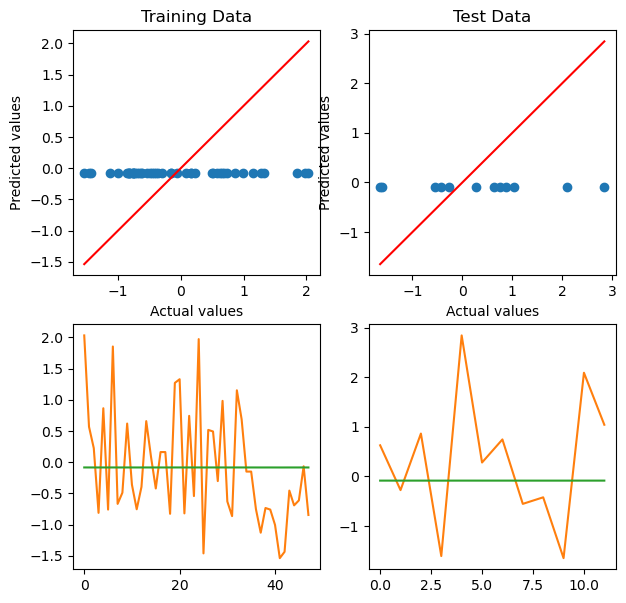

Epoch 6000/100000, Training Loss: 0.8017
Train R²:  0.00045
Test R² :  -0.10483


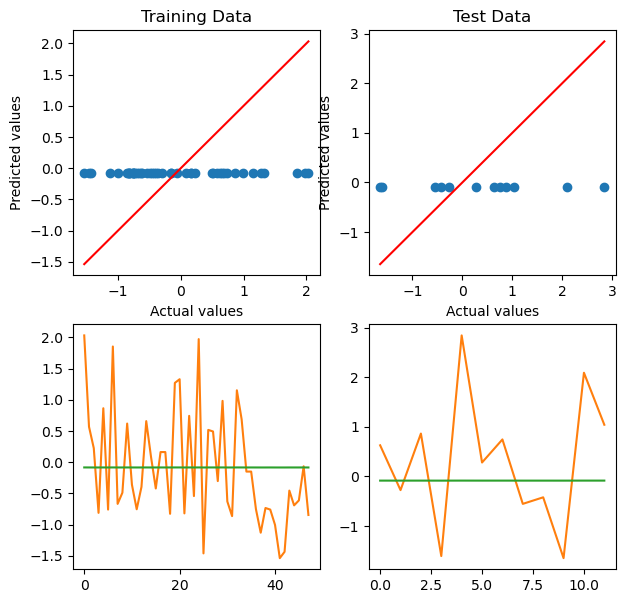

Epoch 7000/100000, Training Loss: 0.8012
Train R²:  0.00097
Test R² :  -0.10432


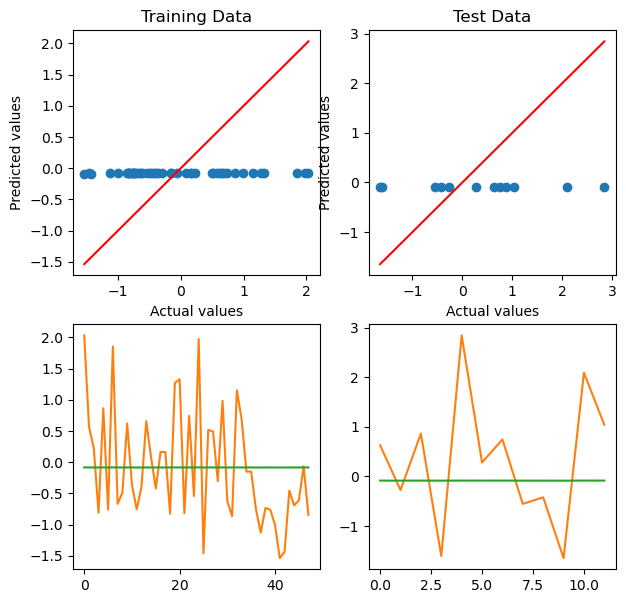

Epoch 8000/100000, Training Loss: 0.7994
Train R²:  0.00323
Test R² :  -0.10218


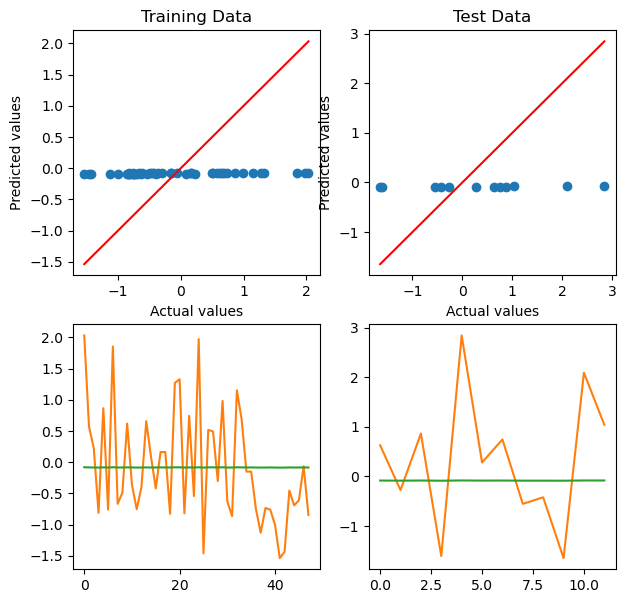

Epoch 9000/100000, Training Loss: 0.6377
Train R²:  0.20488
Test R² :  0.08349


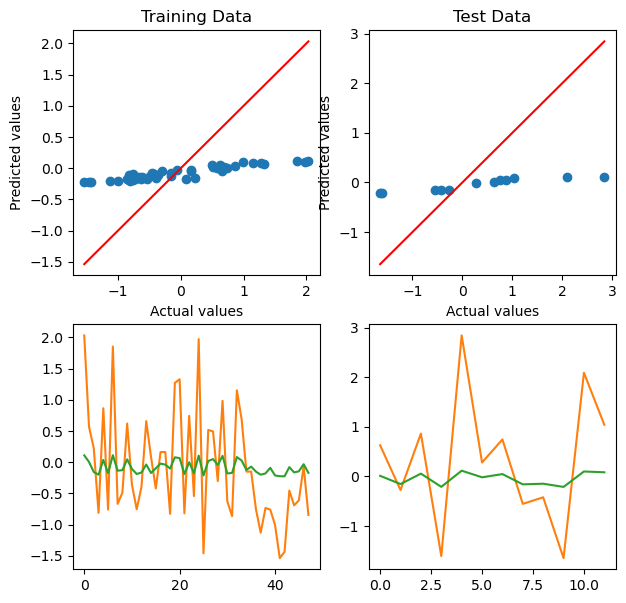

Epoch 10000/100000, Training Loss: 0.0063
Train R²:  0.99217
Test R² :  0.89423


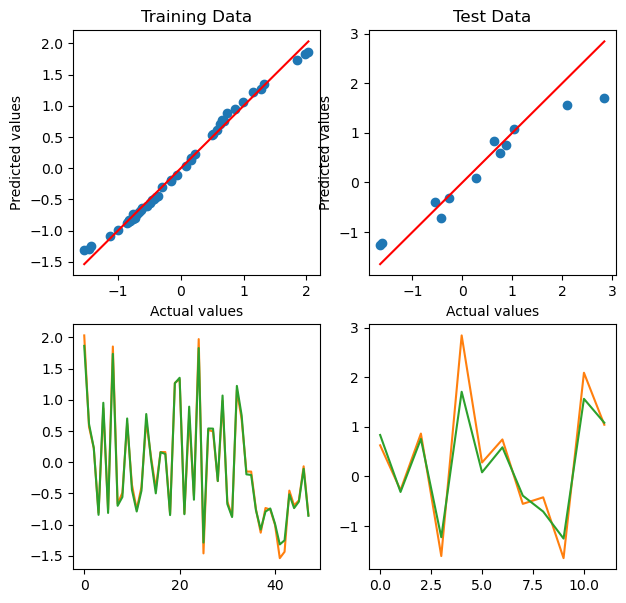

Epoch 11000/100000, Training Loss: 0.0029
Train R²:  0.99643
Test R² :  0.90663


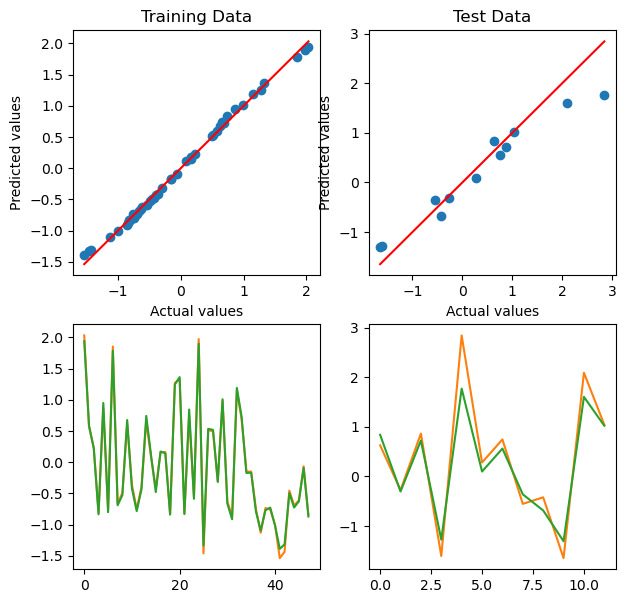

Epoch 12000/100000, Training Loss: 0.0019
Train R²:  0.99769
Test R² :  0.91126


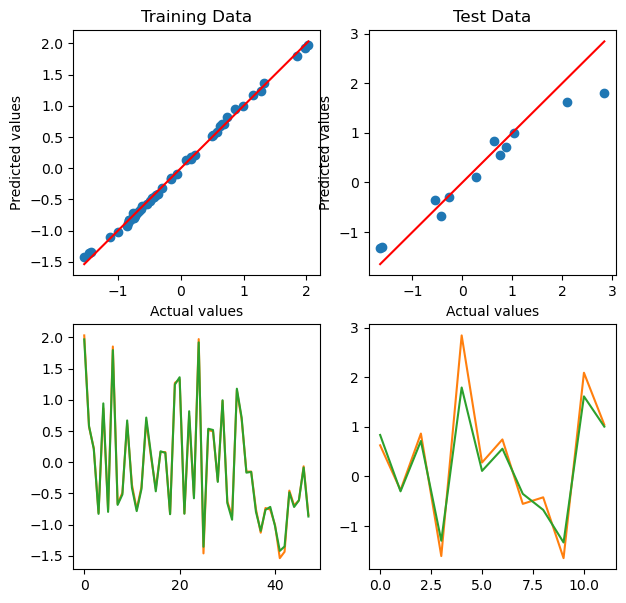

Epoch 13000/100000, Training Loss: 0.0014
Train R²:  0.99828
Test R² :  0.91325


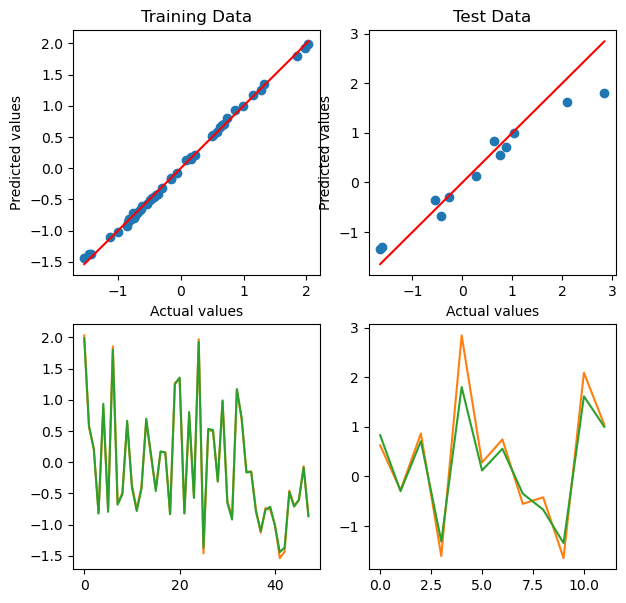

Epoch 14000/100000, Training Loss: 0.0011
Train R²:  0.99864
Test R² :  0.91434


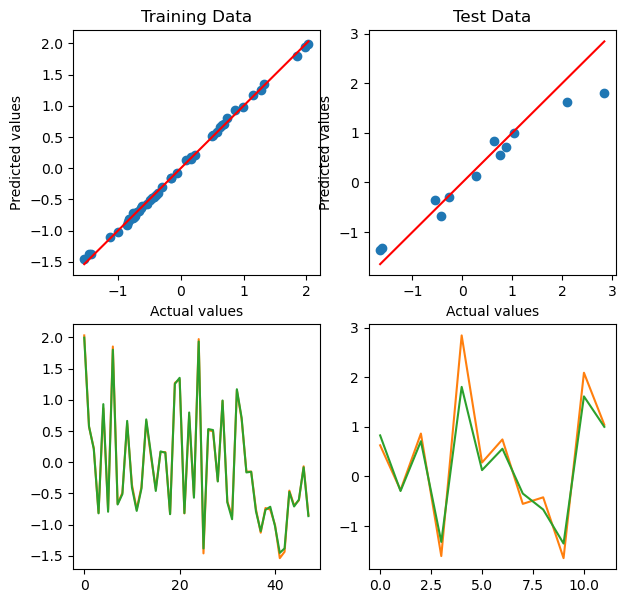

Epoch 15000/100000, Training Loss: 0.0009
Train R²:  0.99886
Test R² :  0.91506


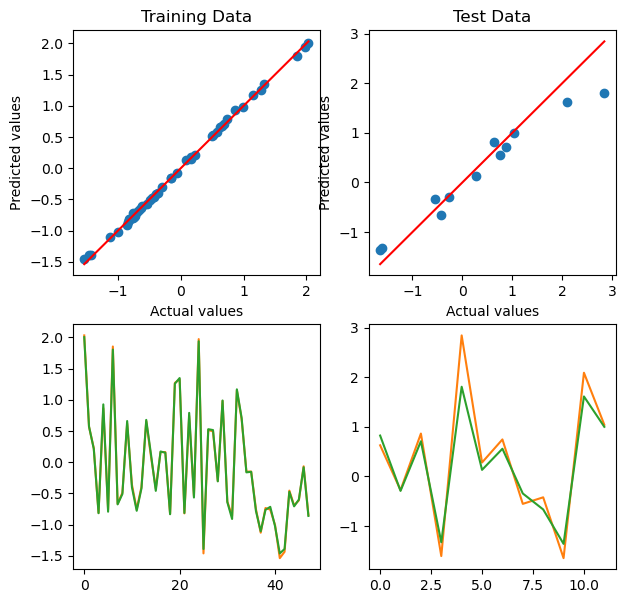

Epoch 16000/100000, Training Loss: 0.0008
Train R²:  0.99903
Test R² :  0.91557


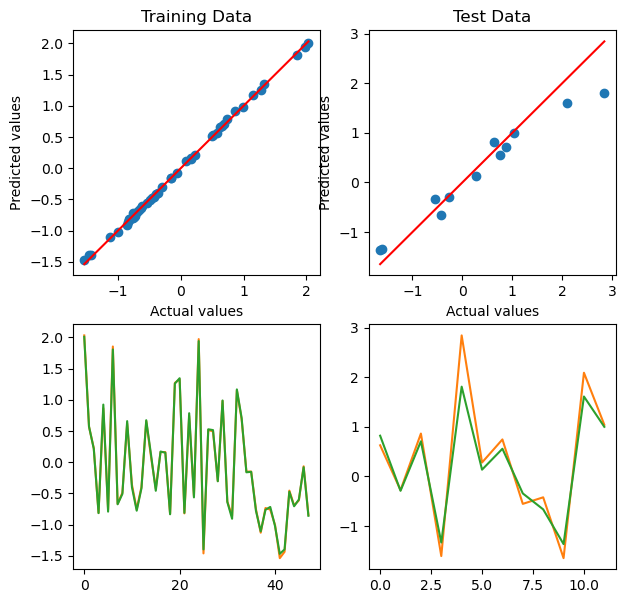

Epoch 17000/100000, Training Loss: 0.0007
Train R²:  0.99915
Test R² :  0.91594


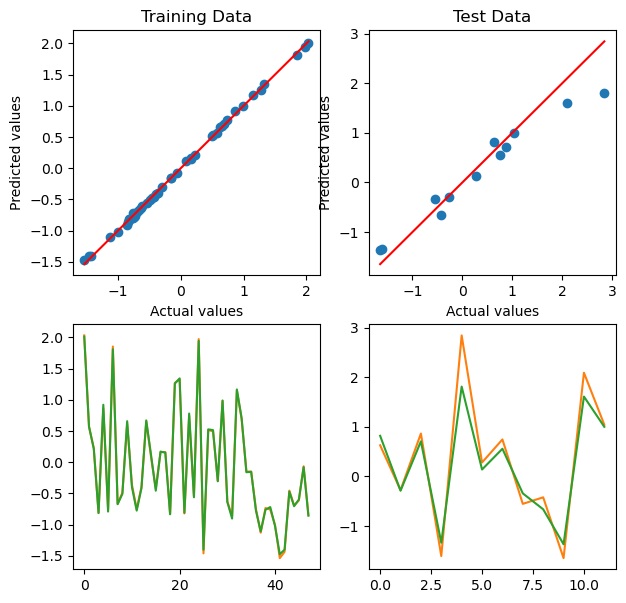

Epoch 18000/100000, Training Loss: 0.0006
Train R²:  0.99924
Test R² :  0.91621


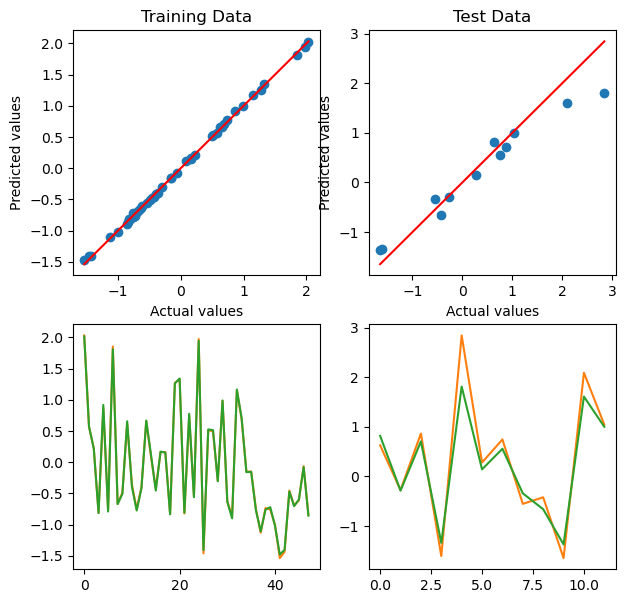

Epoch 19000/100000, Training Loss: 0.0005
Train R²:  0.99932
Test R² :  0.91641


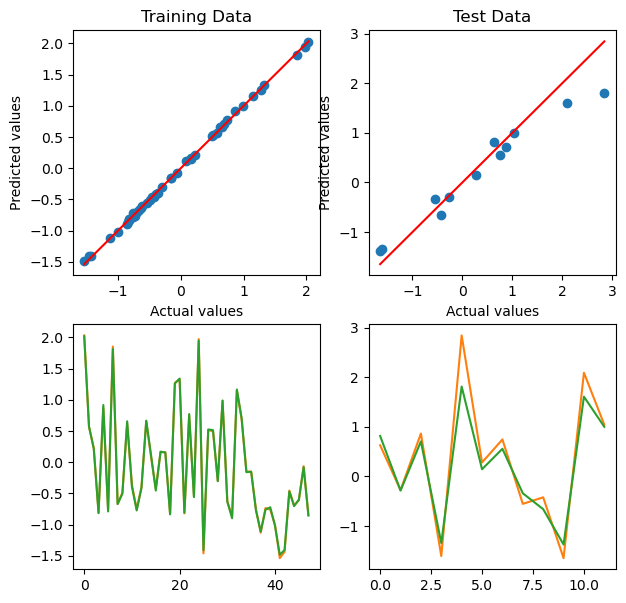

Epoch 20000/100000, Training Loss: 0.0005
Train R²:  0.99939
Test R² :  0.91655


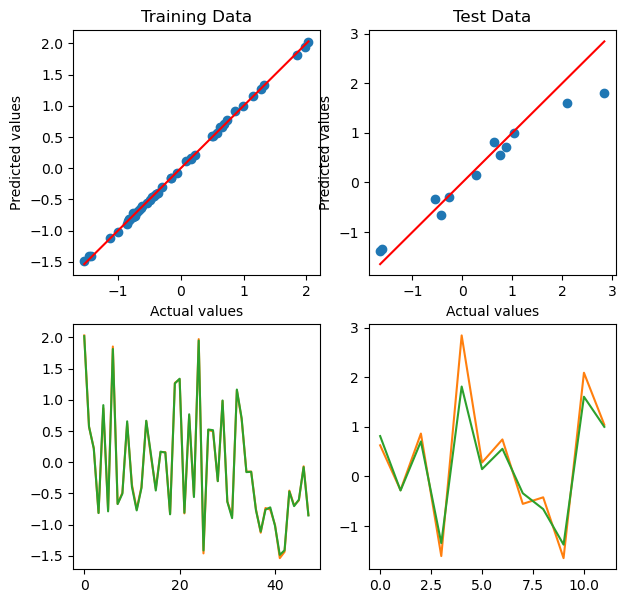

Epoch 21000/100000, Training Loss: 0.0004
Train R²:  0.99944
Test R² :  0.91665


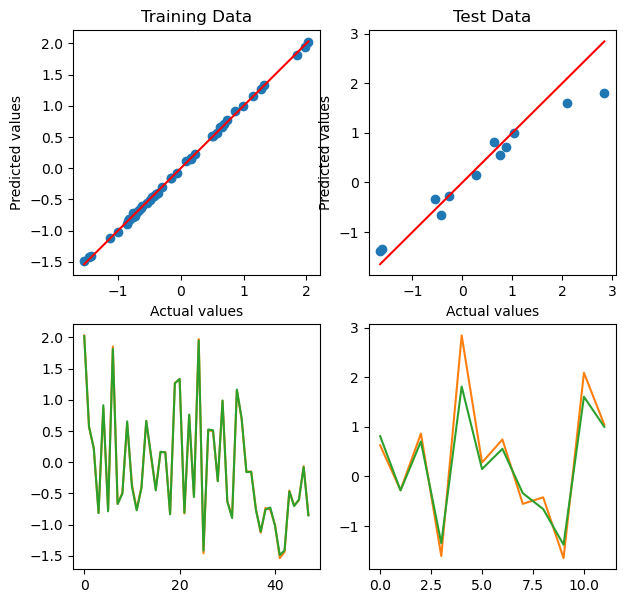

Epoch 22000/100000, Training Loss: 0.0004
Train R²:  0.99949
Test R² :  0.91672


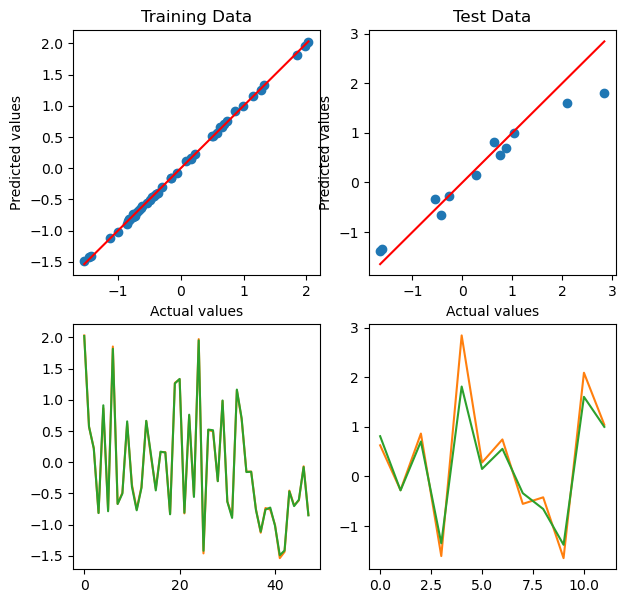

Epoch 23000/100000, Training Loss: 0.0004
Train R²:  0.99953
Test R² :  0.91677


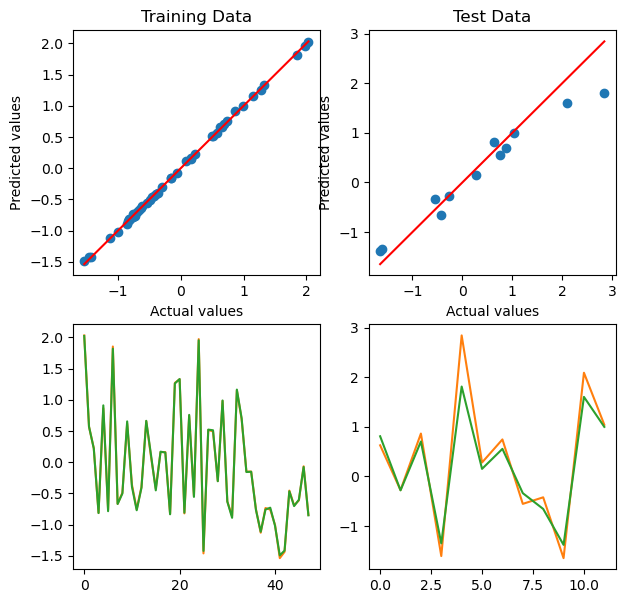

Epoch 24000/100000, Training Loss: 0.0004
Train R²:  0.99956
Test R² :  0.91680


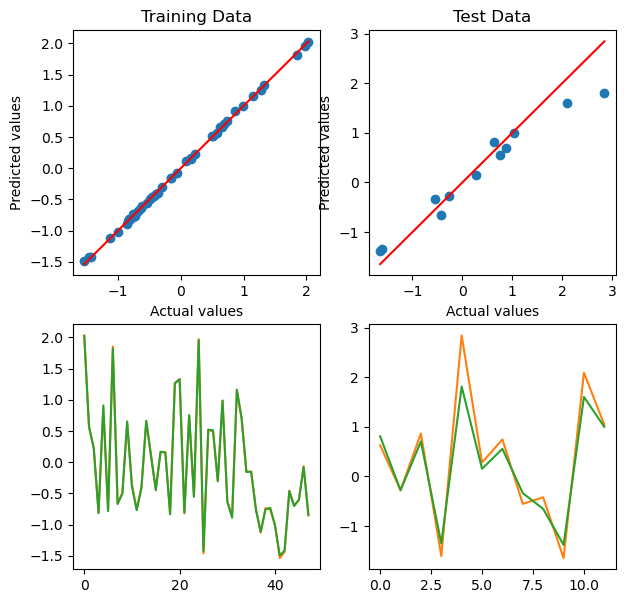

Epoch 25000/100000, Training Loss: 0.0003
Train R²:  0.99959
Test R² :  0.91682


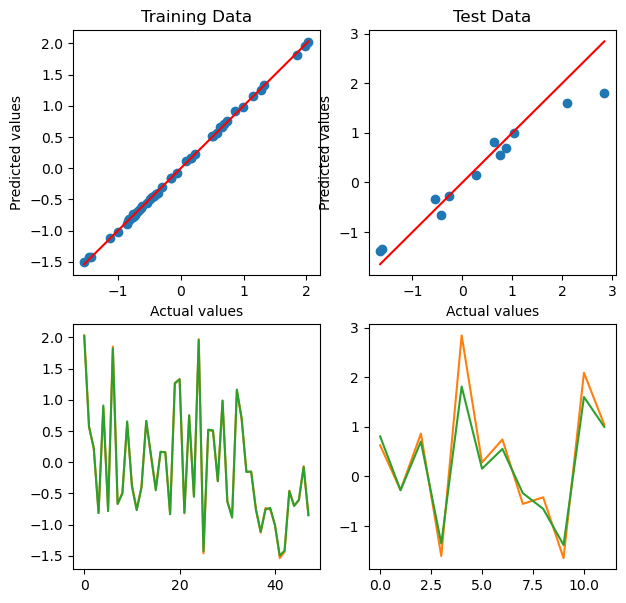

Epoch 26000/100000, Training Loss: 0.0003
Train R²:  0.99962
Test R² :  0.91683


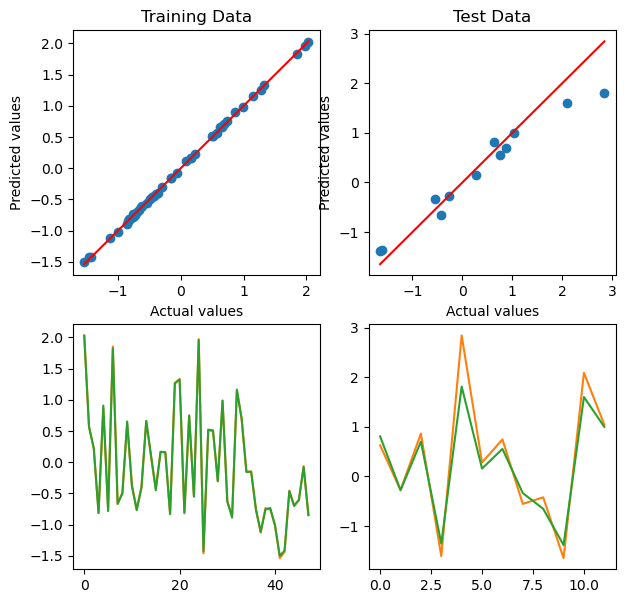

Epoch 27000/100000, Training Loss: 0.0003
Train R²:  0.99964
Test R² :  0.91683


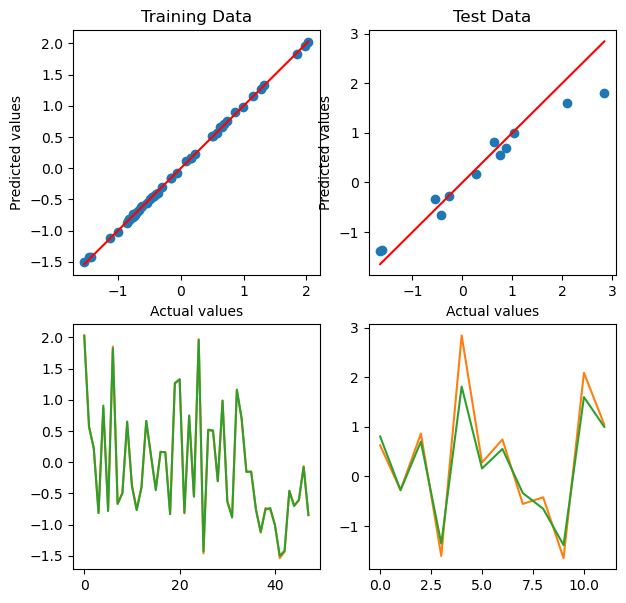

Epoch 28000/100000, Training Loss: 0.0003
Train R²:  0.99966
Test R² :  0.91683


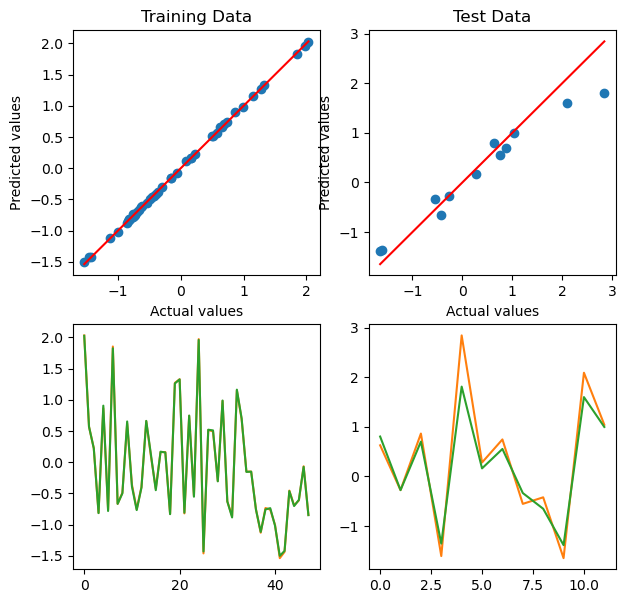

Epoch 29000/100000, Training Loss: 0.0003
Train R²:  0.99968
Test R² :  0.91682


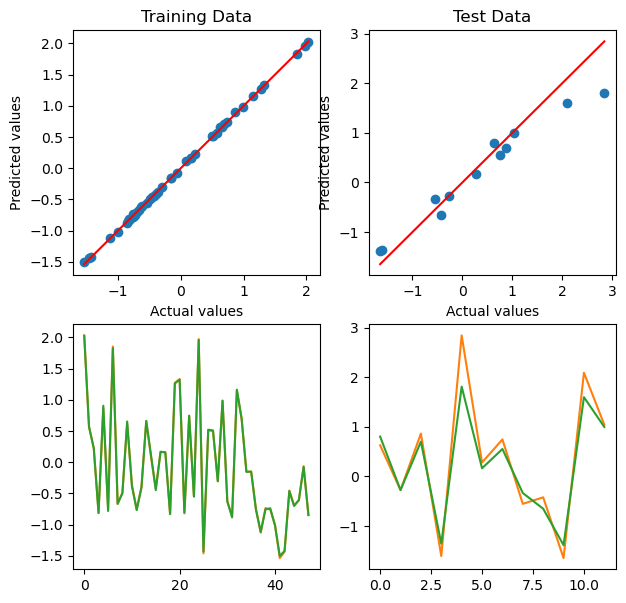

Epoch 30000/100000, Training Loss: 0.0002
Train R²:  0.99970
Test R² :  0.91681


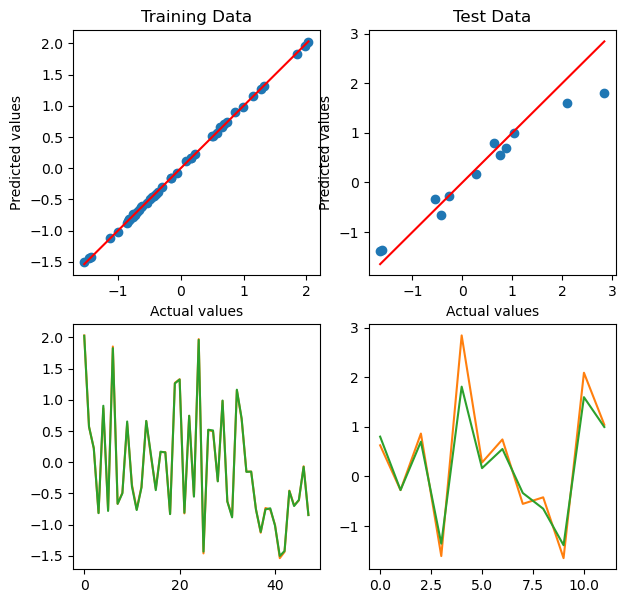

Epoch 31000/100000, Training Loss: 0.0002
Train R²:  0.99971
Test R² :  0.91680


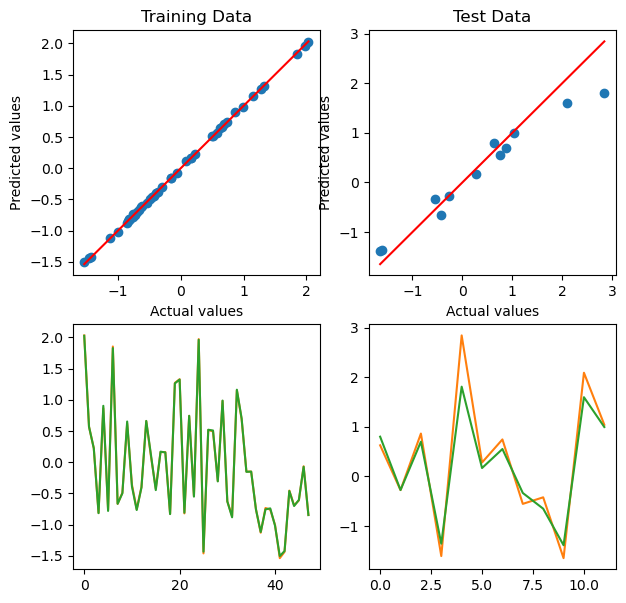

Epoch 32000/100000, Training Loss: 0.0002
Train R²:  0.99973
Test R² :  0.91678


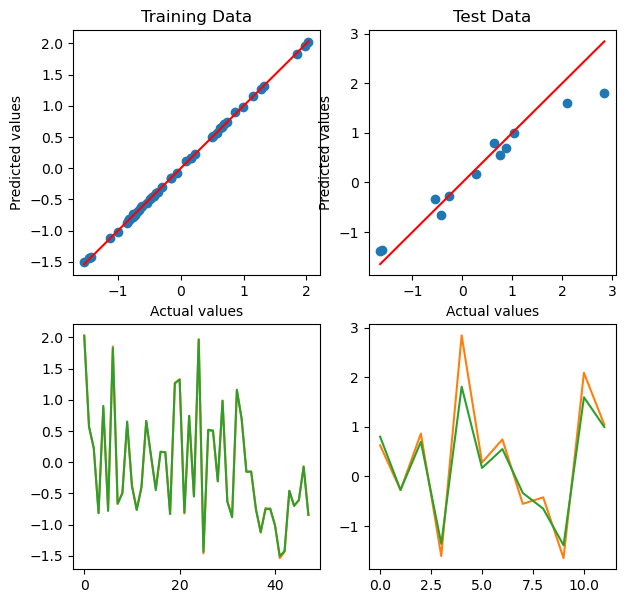

Epoch 33000/100000, Training Loss: 0.0002
Train R²:  0.99974
Test R² :  0.91676


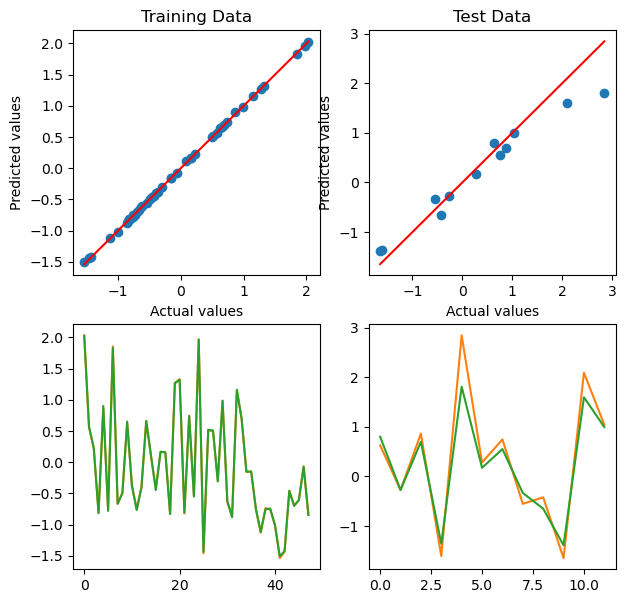

Epoch 34000/100000, Training Loss: 0.0002
Train R²:  0.99975
Test R² :  0.91674


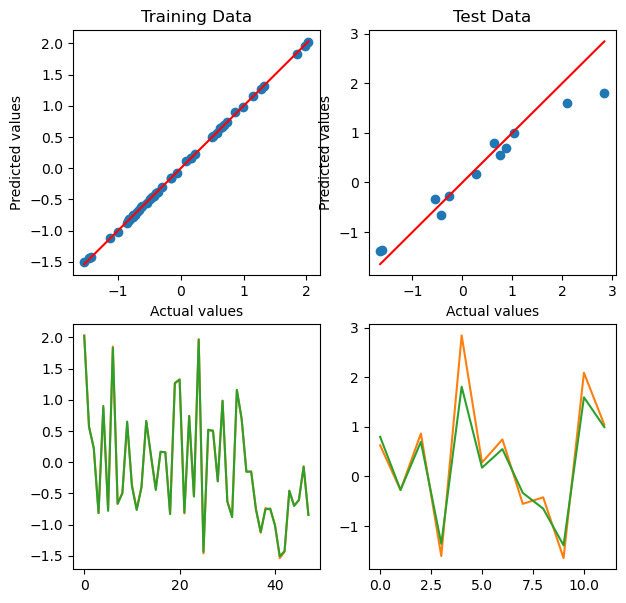

Epoch 35000/100000, Training Loss: 0.0002
Train R²:  0.99976
Test R² :  0.91671


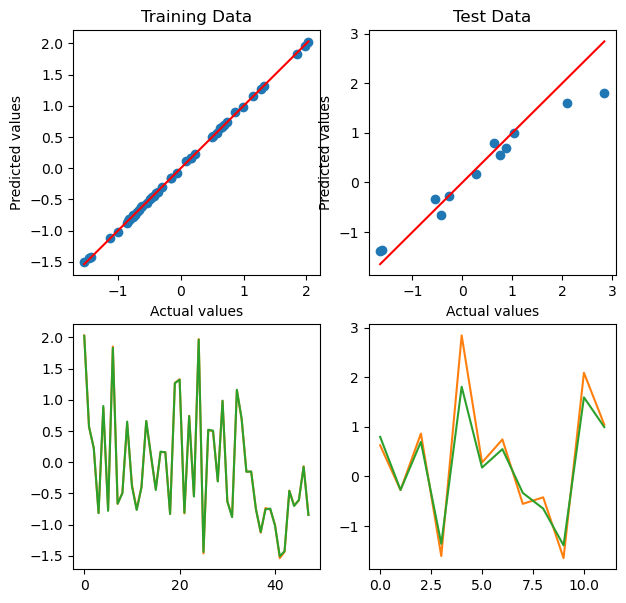

Epoch 36000/100000, Training Loss: 0.0002
Train R²:  0.99977
Test R² :  0.91668


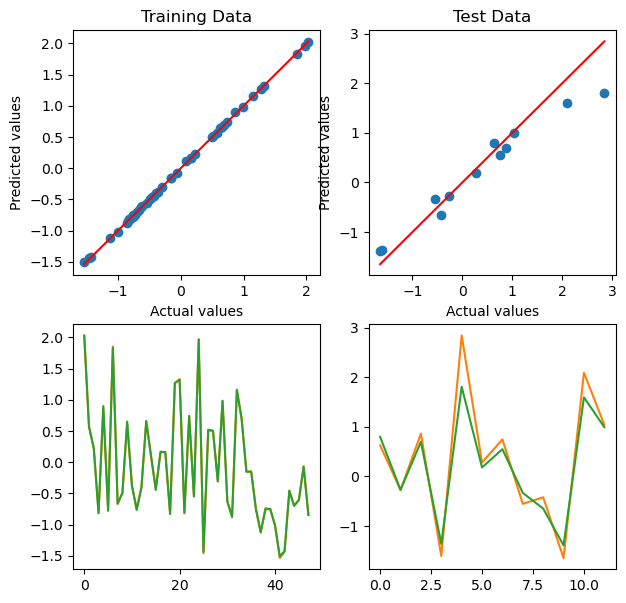

Epoch 37000/100000, Training Loss: 0.0002
Train R²:  0.99978
Test R² :  0.91665


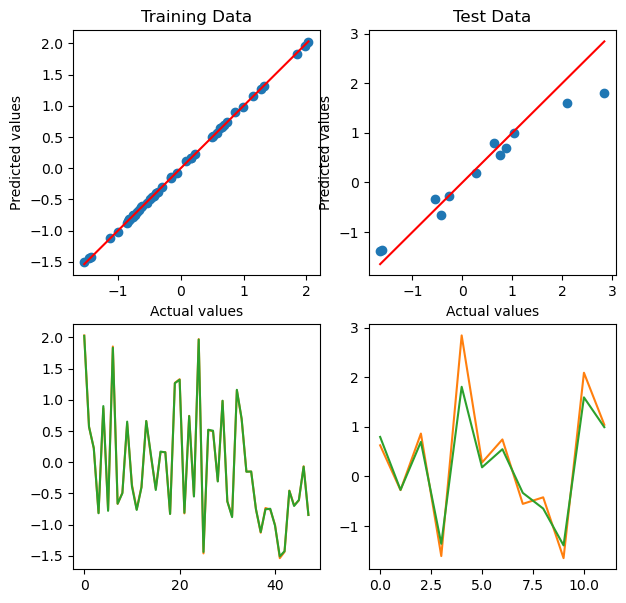

Epoch 38000/100000, Training Loss: 0.0002
Train R²:  0.99979
Test R² :  0.91662


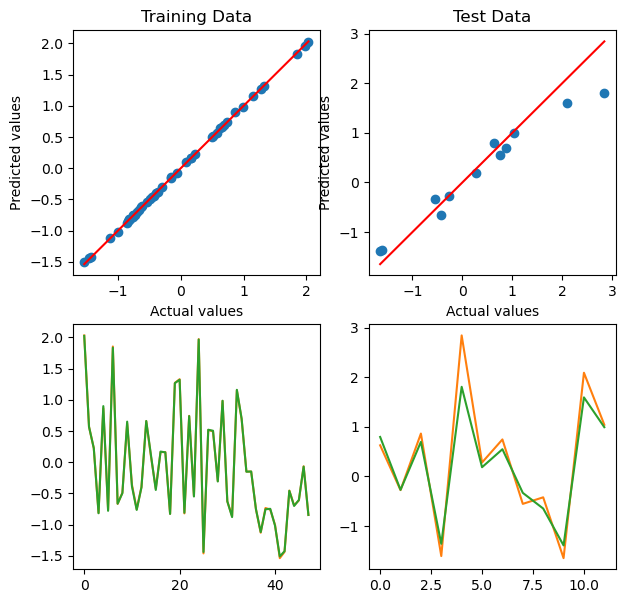

Epoch 39000/100000, Training Loss: 0.0002
Train R²:  0.99980
Test R² :  0.91658


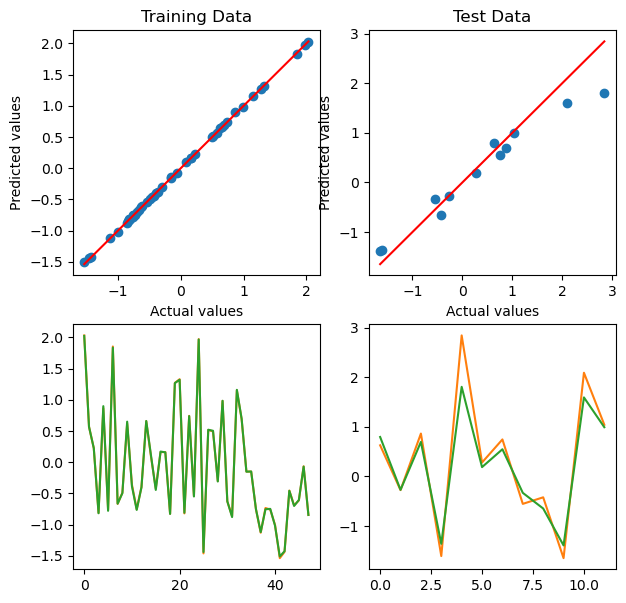

Epoch 40000/100000, Training Loss: 0.0002
Train R²:  0.99980
Test R² :  0.91654


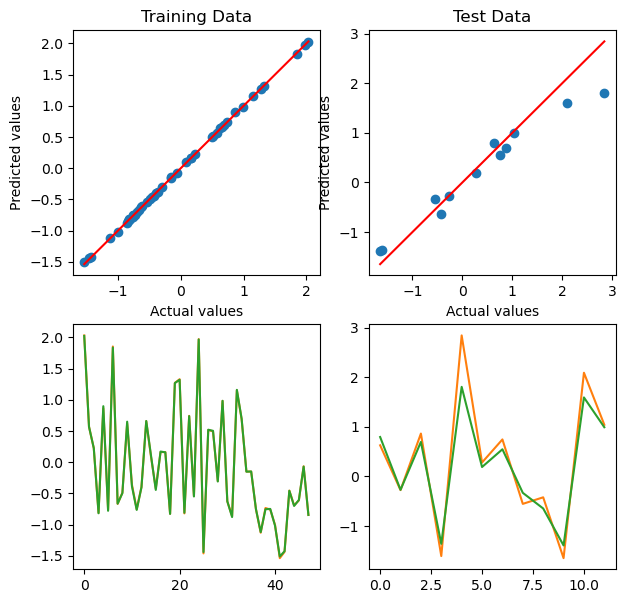

Epoch 41000/100000, Training Loss: 0.0002
Train R²:  0.99981
Test R² :  0.91650


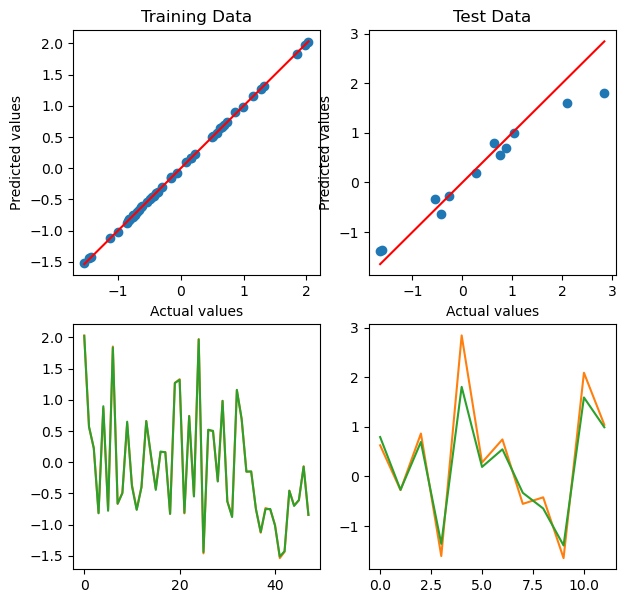

Epoch 42000/100000, Training Loss: 0.0001
Train R²:  0.99982
Test R² :  0.91647


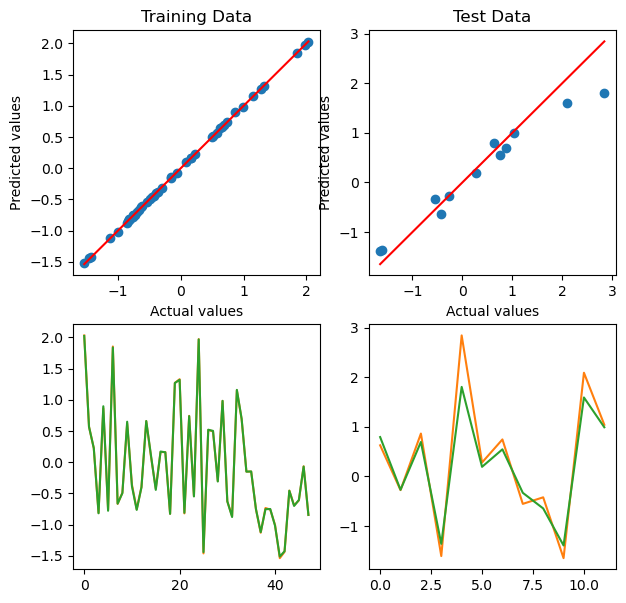

Epoch 43000/100000, Training Loss: 0.0001
Train R²:  0.99982
Test R² :  0.91643


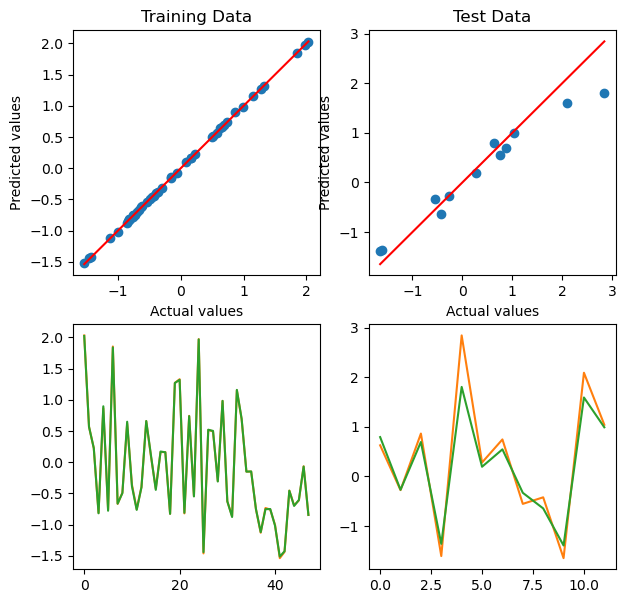

Epoch 44000/100000, Training Loss: 0.0001
Train R²:  0.99983
Test R² :  0.91640


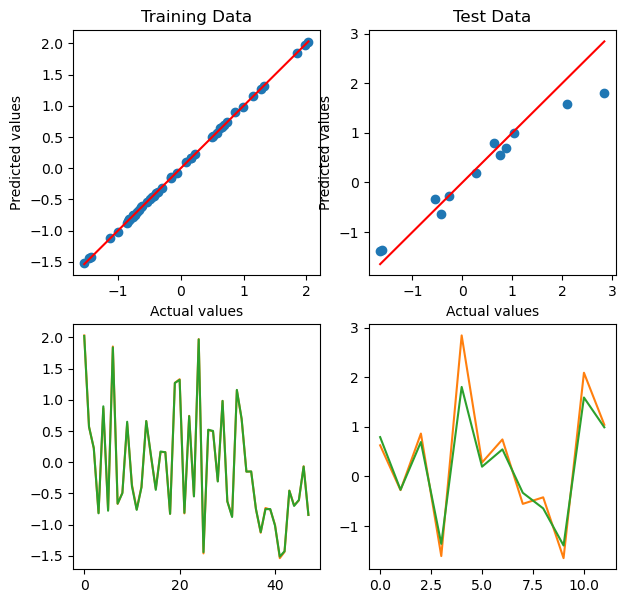

Epoch 45000/100000, Training Loss: 0.0001
Train R²:  0.99983
Test R² :  0.91637


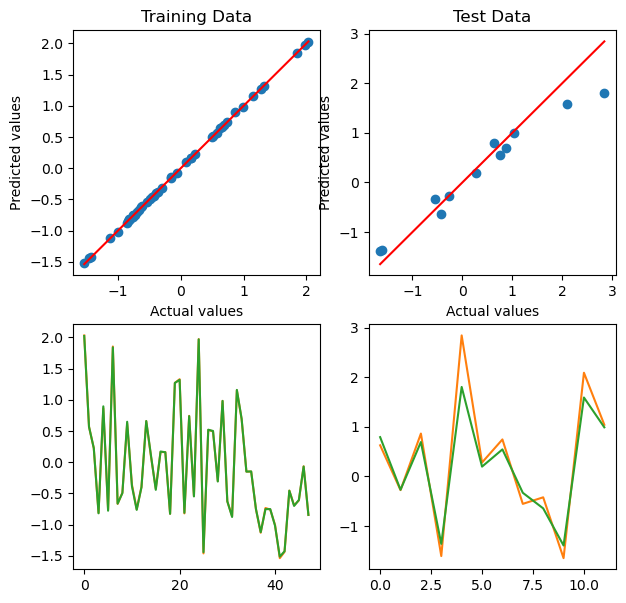

Epoch 46000/100000, Training Loss: 0.0001
Train R²:  0.99984
Test R² :  0.91634


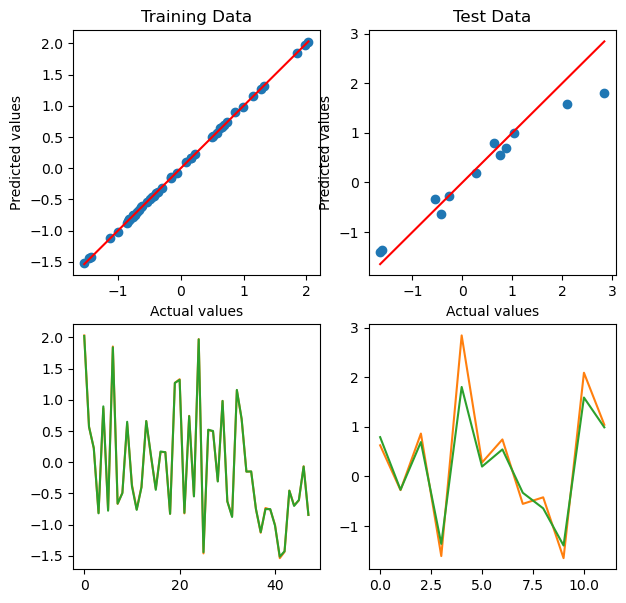

KeyboardInterrupt: 

In [12]:
GBR_DNN(5)

GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  3
Train R²:  1.00000
Test R² :  0.21763
GBR Parameters: n-estimators =  30000  lr =  0.001  max depth =  4
Train R²:  1.00000
Test R² :  0.37858
GBR Parameters: n-estimators =  30000  lr =  0.01  max depth =  3
Train R²:  1.00000
Test R² :  0.18853
GBR Parameters: n-estimators =  30000  lr =  0.01  max depth =  4
Train R²:  1.00000
Test R² :  0.21654
GBR Parameters: n-estimators =  50000  lr =  0.001  max depth =  3
Train R²:  1.00000
Test R² :  0.21780
GBR Parameters: n-estimators =  50000  lr =  0.001  max depth =  4
Train R²:  1.00000
Test R² :  0.37862
GBR Parameters: n-estimators =  50000  lr =  0.01  max depth =  3
Train R²:  1.00000
Test R² :  0.18853
GBR Parameters: n-estimators =  50000  lr =  0.01  max depth =  4
Train R²:  1.00000
Test R² :  0.21654
Best GBR Parameters: n-estimators =  50000  lr =  0.001  max depth =  4
Epoch 1000/100000, Training Loss: 1.0384
Train R²:  -0.00001
Test R² :  -1.37719


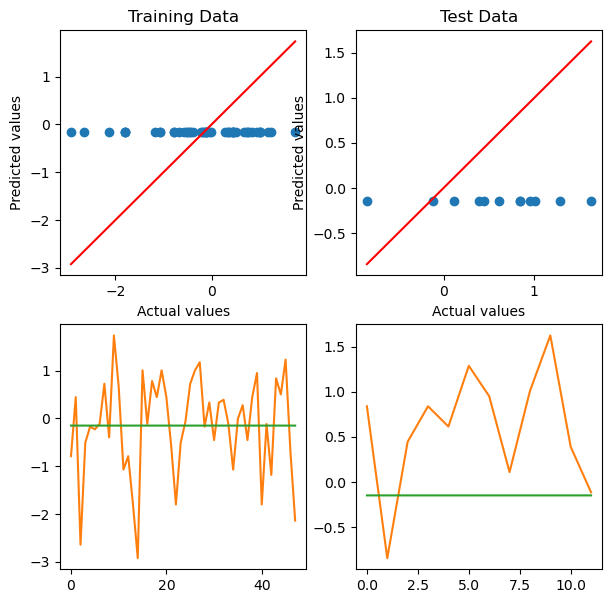

Epoch 2000/100000, Training Loss: 1.0384
Train R²:  0.00001
Test R² :  -1.37715


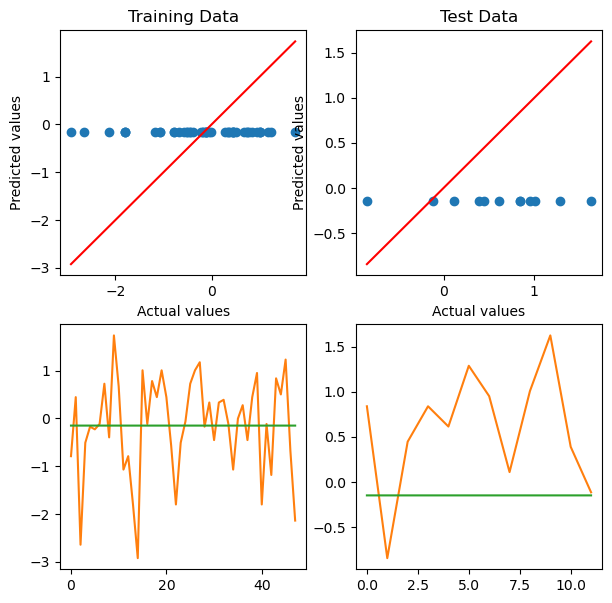

Epoch 3000/100000, Training Loss: 1.0383
Train R²:  0.00003
Test R² :  -1.37711


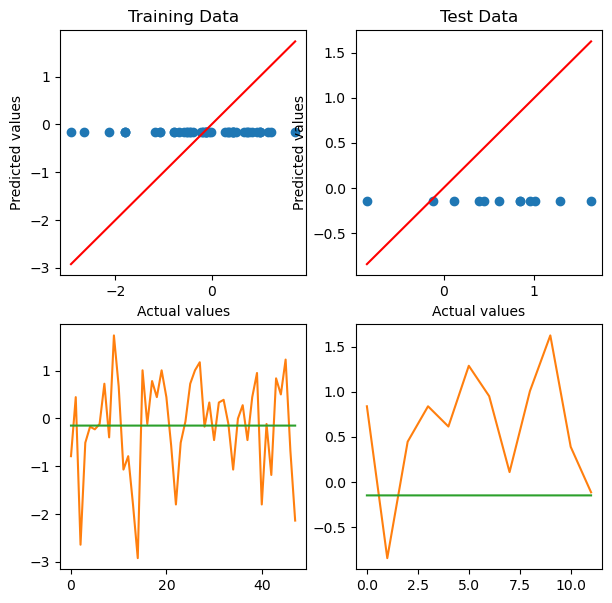

Epoch 4000/100000, Training Loss: 1.0383
Train R²:  0.00006
Test R² :  -1.37706


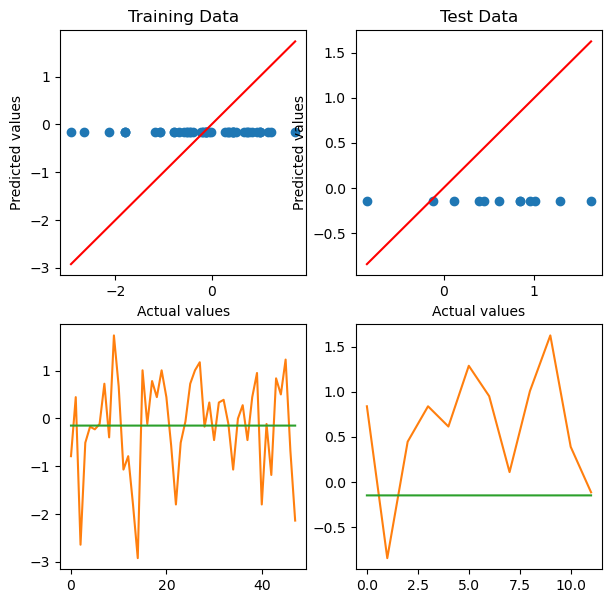

Epoch 5000/100000, Training Loss: 1.0383
Train R²:  0.00009
Test R² :  -1.37699


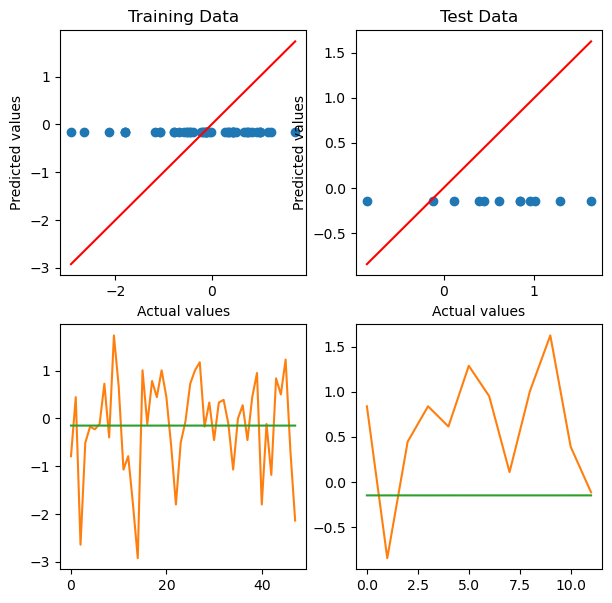

Epoch 6000/100000, Training Loss: 1.0382
Train R²:  0.00014
Test R² :  -1.37690


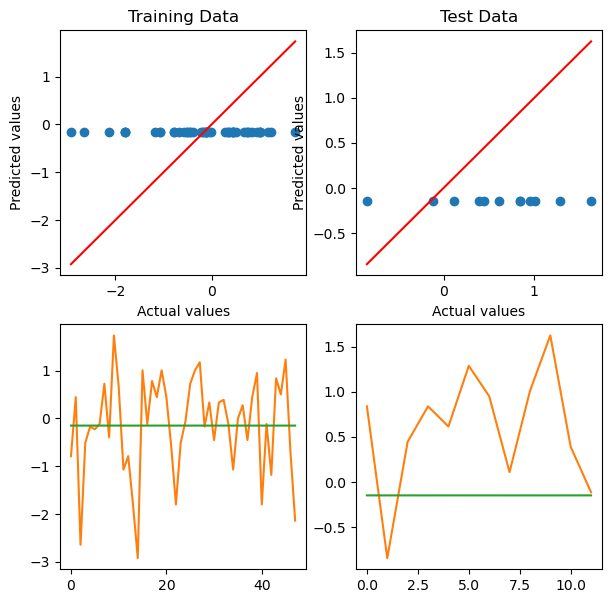

Epoch 7000/100000, Training Loss: 1.0381
Train R²:  0.00022
Test R² :  -1.37675


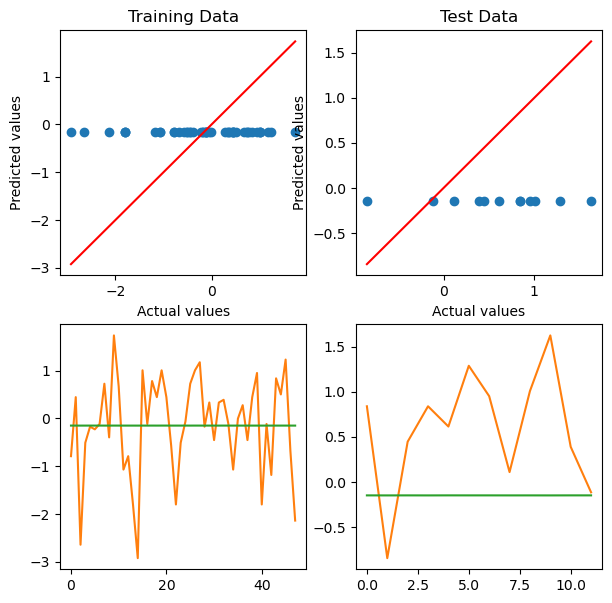

Epoch 8000/100000, Training Loss: 1.0380
Train R²:  0.00037
Test R² :  -1.37647


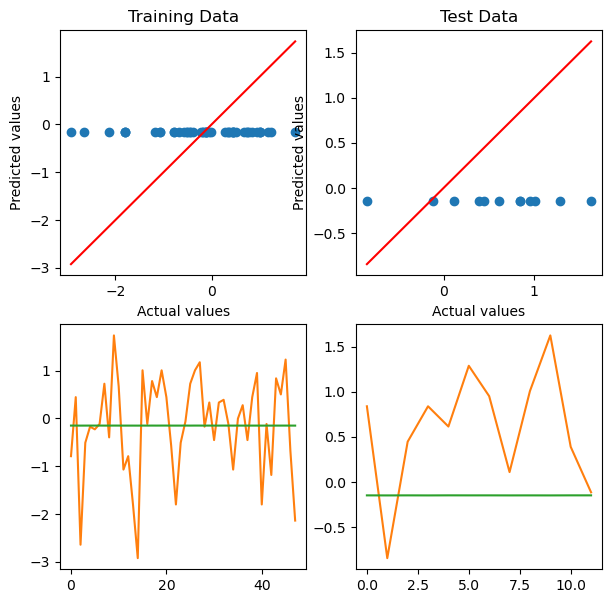

Epoch 9000/100000, Training Loss: 1.0376
Train R²:  0.00071
Test R² :  -1.37582


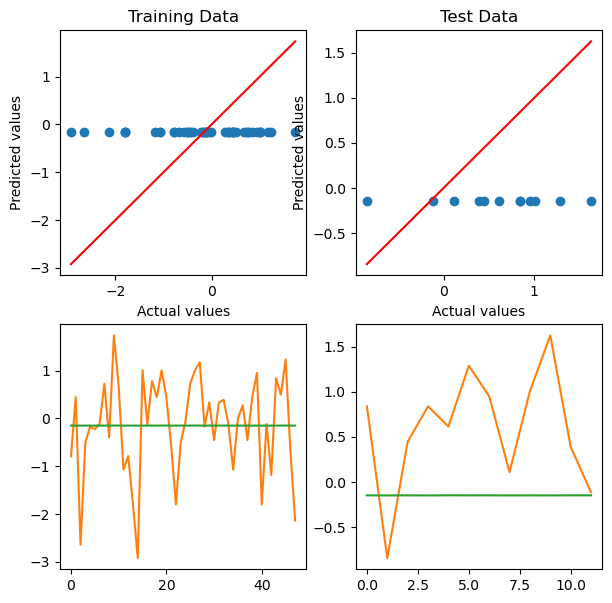

Epoch 10000/100000, Training Loss: 1.0364
Train R²:  0.00186
Test R² :  -1.37354


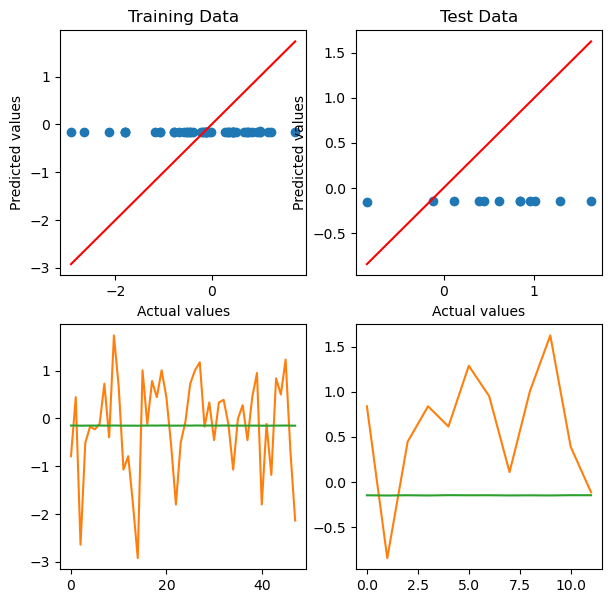

Epoch 11000/100000, Training Loss: 1.0193
Train R²:  0.01841
Test R² :  -1.33938


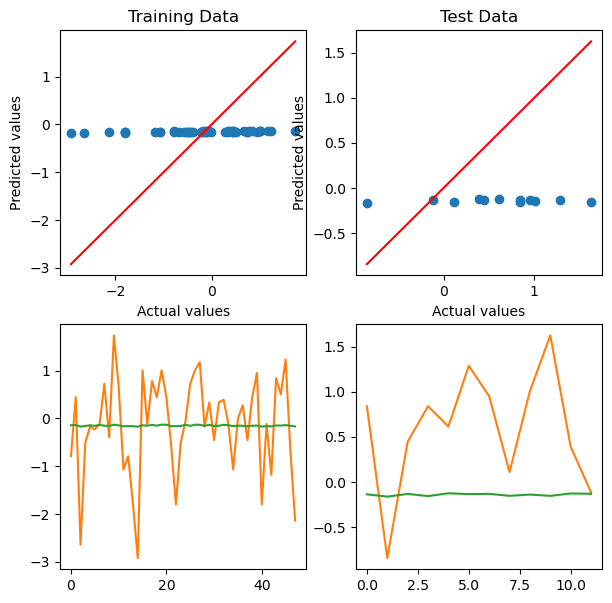

Epoch 12000/100000, Training Loss: 0.0126
Train R²:  0.98788
Test R² :  0.37482


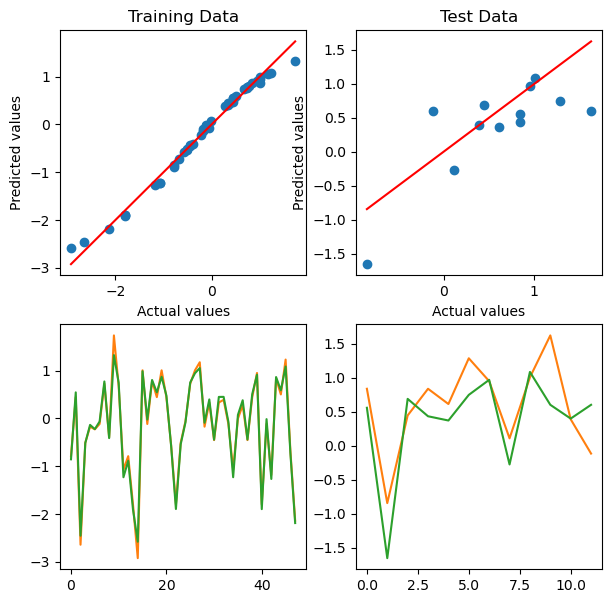

Epoch 13000/100000, Training Loss: 0.0044
Train R²:  0.99580
Test R² :  0.35184


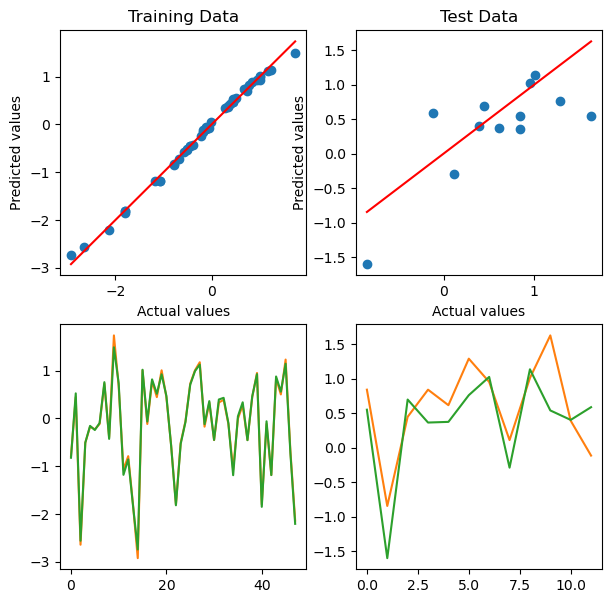

Epoch 14000/100000, Training Loss: 0.0024
Train R²:  0.99773
Test R² :  0.34543


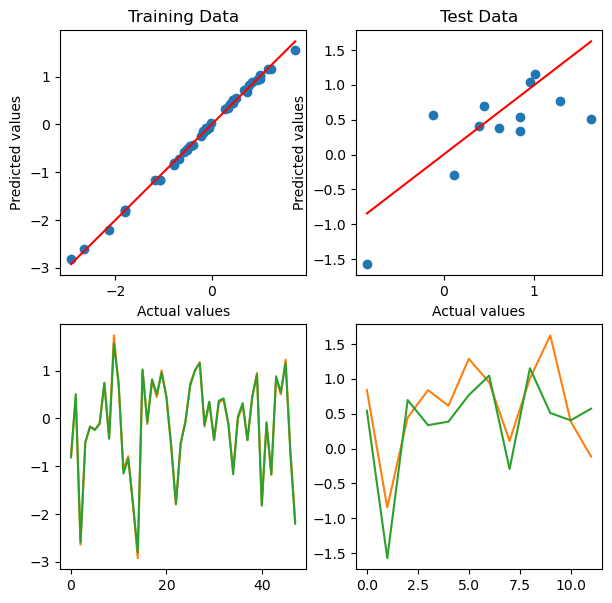

Epoch 15000/100000, Training Loss: 0.0016
Train R²:  0.99848
Test R² :  0.34417


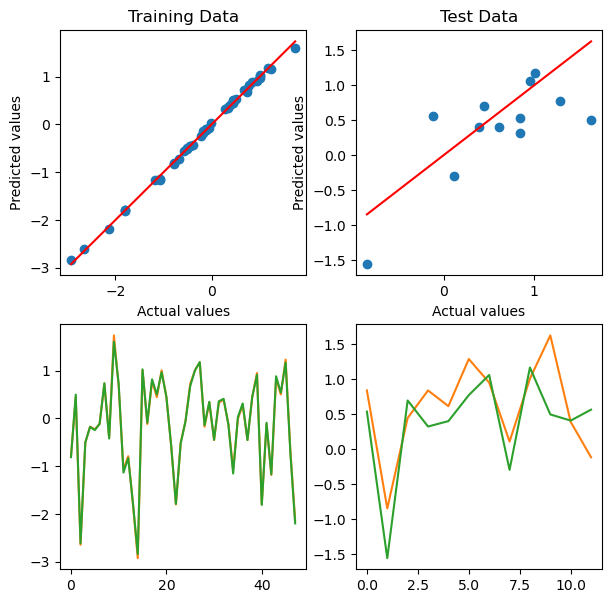

Epoch 16000/100000, Training Loss: 0.0012
Train R²:  0.99884
Test R² :  0.34447


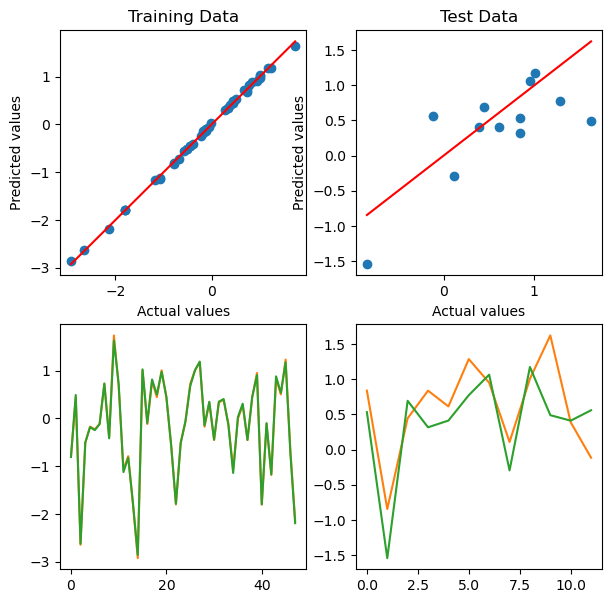

Epoch 17000/100000, Training Loss: 0.0010
Train R²:  0.99904
Test R² :  0.34542


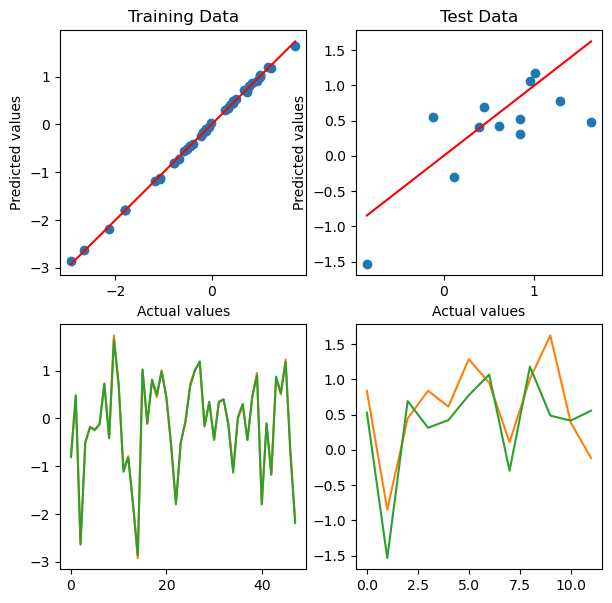

Epoch 18000/100000, Training Loss: 0.0009
Train R²:  0.99918
Test R² :  0.34667


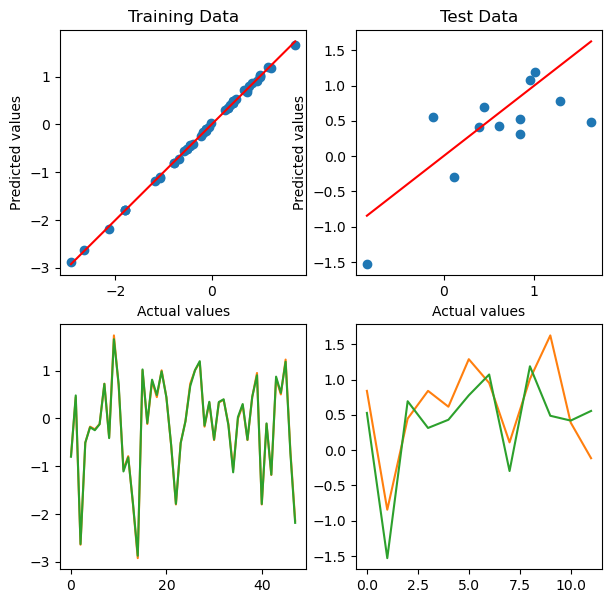

Epoch 19000/100000, Training Loss: 0.0008
Train R²:  0.99928
Test R² :  0.34803


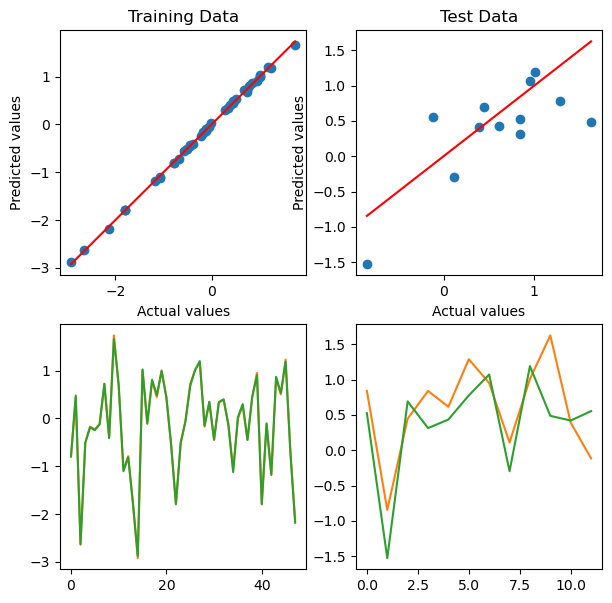

Epoch 20000/100000, Training Loss: 0.0007
Train R²:  0.99935
Test R² :  0.34938


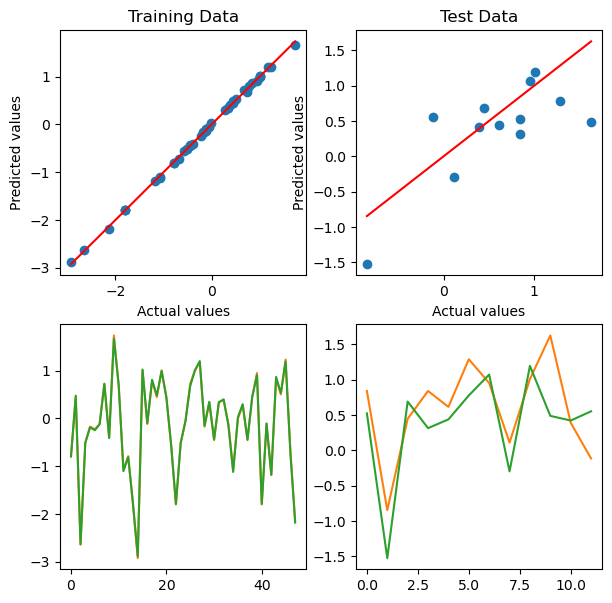

Epoch 21000/100000, Training Loss: 0.0006
Train R²:  0.99941
Test R² :  0.35065


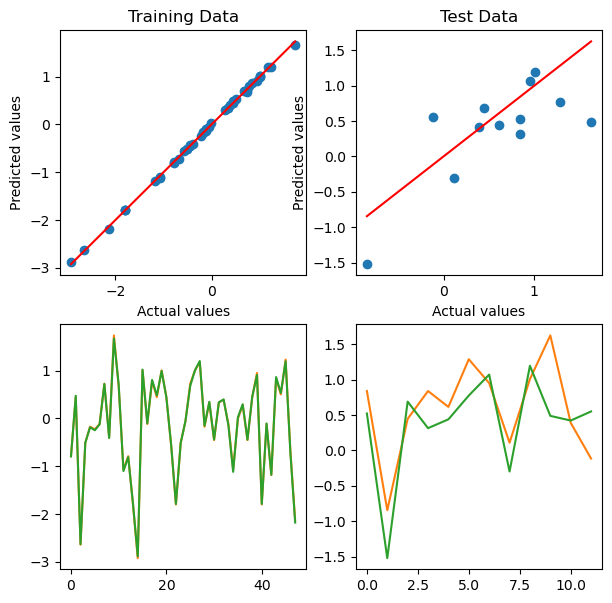

Epoch 22000/100000, Training Loss: 0.0006
Train R²:  0.99946
Test R² :  0.35183


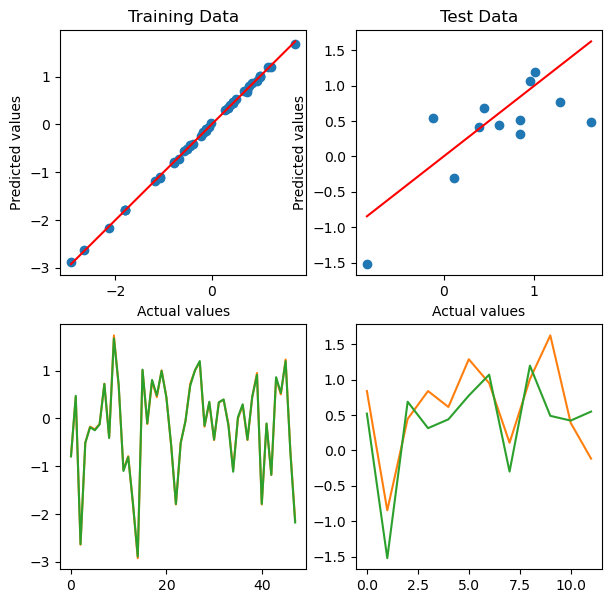

Epoch 23000/100000, Training Loss: 0.0005
Train R²:  0.99951
Test R² :  0.35290


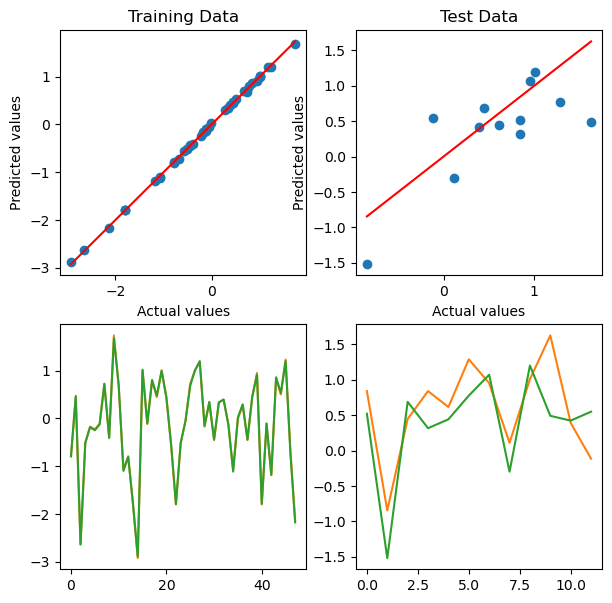

Epoch 24000/100000, Training Loss: 0.0005
Train R²:  0.99954
Test R² :  0.35386


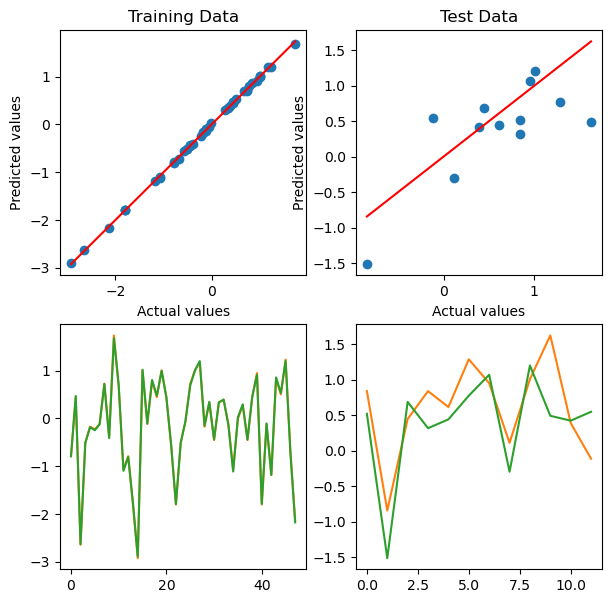

Epoch 25000/100000, Training Loss: 0.0004
Train R²:  0.99958
Test R² :  0.35473


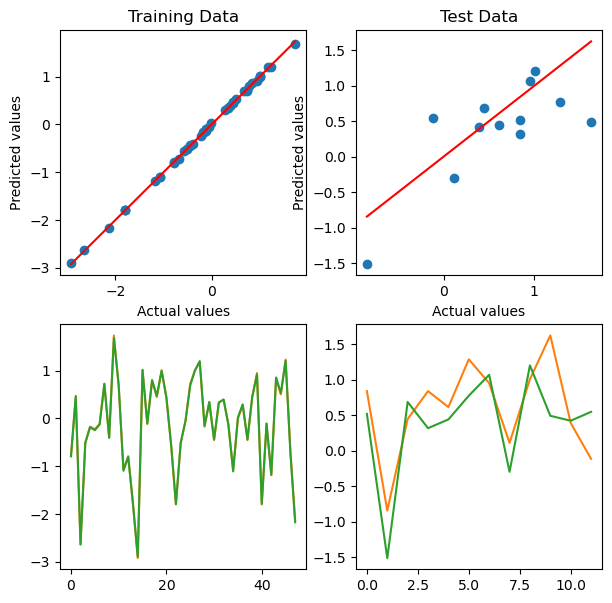

Epoch 26000/100000, Training Loss: 0.0004
Train R²:  0.99960
Test R² :  0.35552


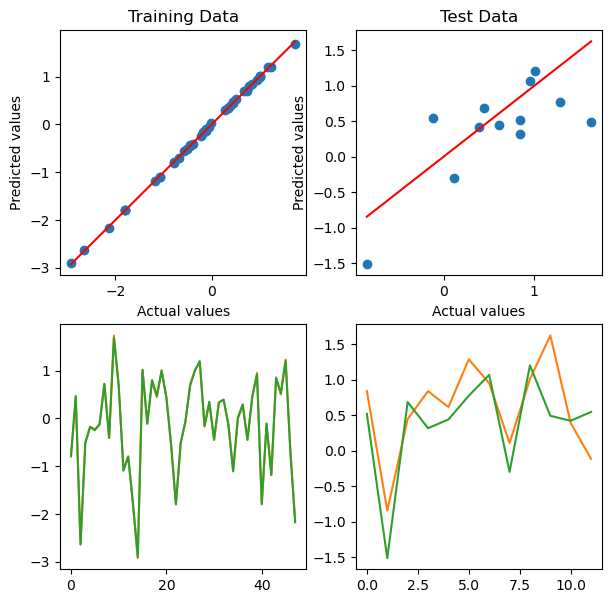

Epoch 27000/100000, Training Loss: 0.0004
Train R²:  0.99963
Test R² :  0.35622


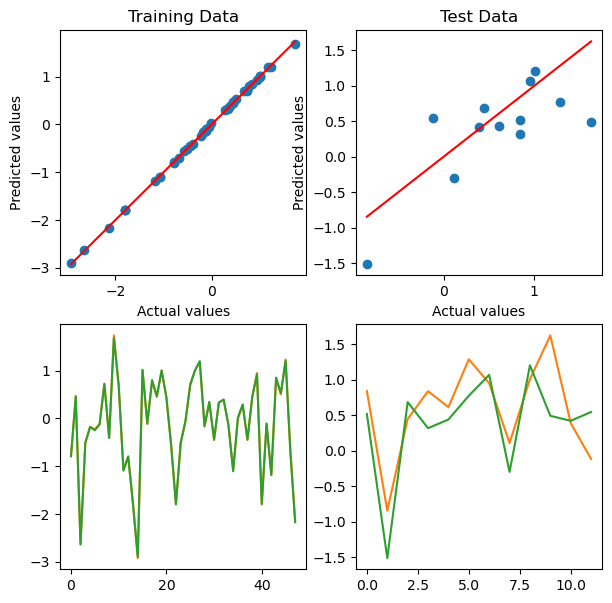

Epoch 28000/100000, Training Loss: 0.0004
Train R²:  0.99965
Test R² :  0.35686


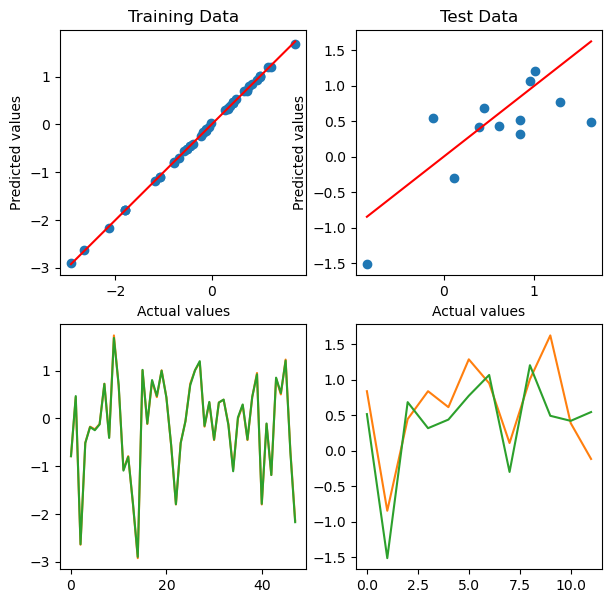

Epoch 29000/100000, Training Loss: 0.0003
Train R²:  0.99967
Test R² :  0.35744


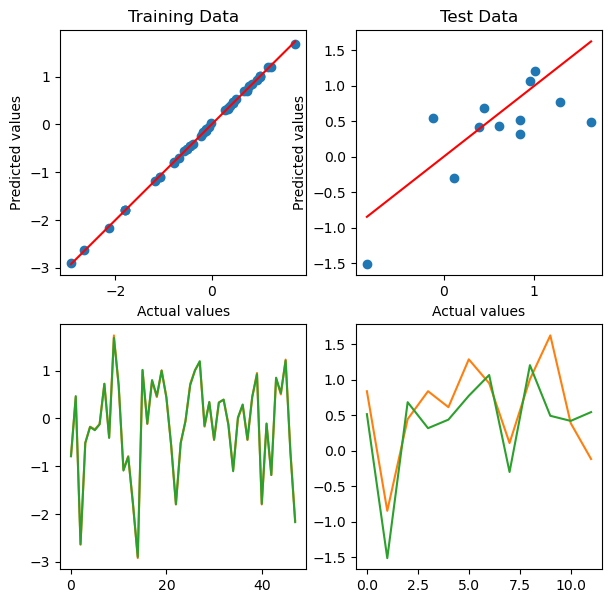

Epoch 30000/100000, Training Loss: 0.0003
Train R²:  0.99969
Test R² :  0.35797


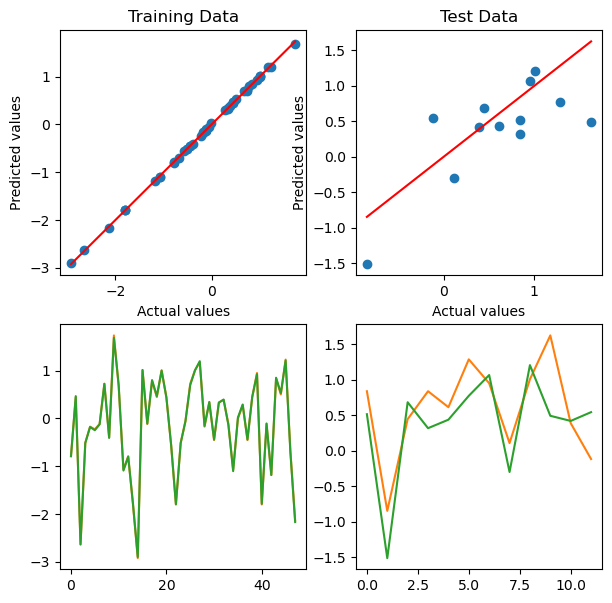

Epoch 31000/100000, Training Loss: 0.0003
Train R²:  0.99970
Test R² :  0.35845


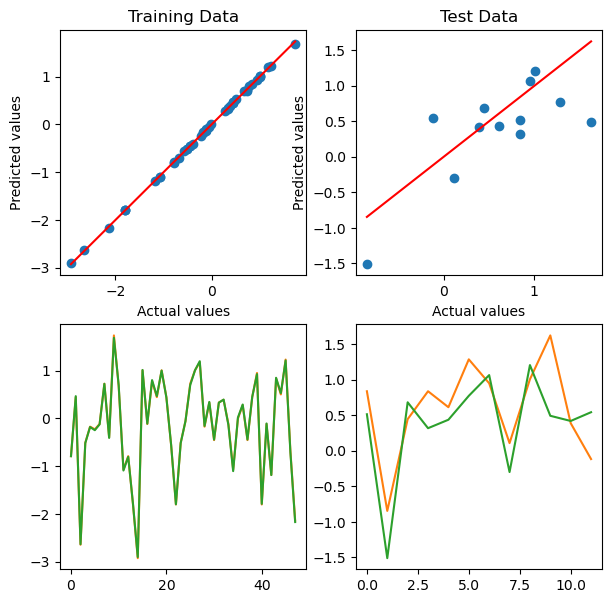

Epoch 32000/100000, Training Loss: 0.0003
Train R²:  0.99971
Test R² :  0.35888


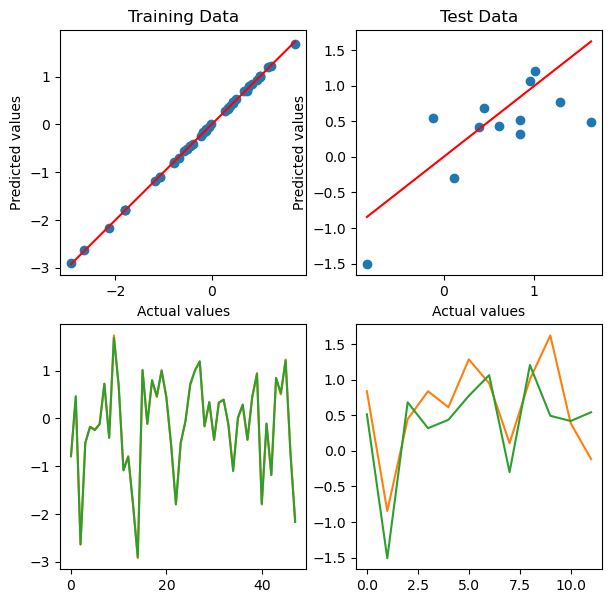

Epoch 33000/100000, Training Loss: 0.0003
Train R²:  0.99973
Test R² :  0.35928


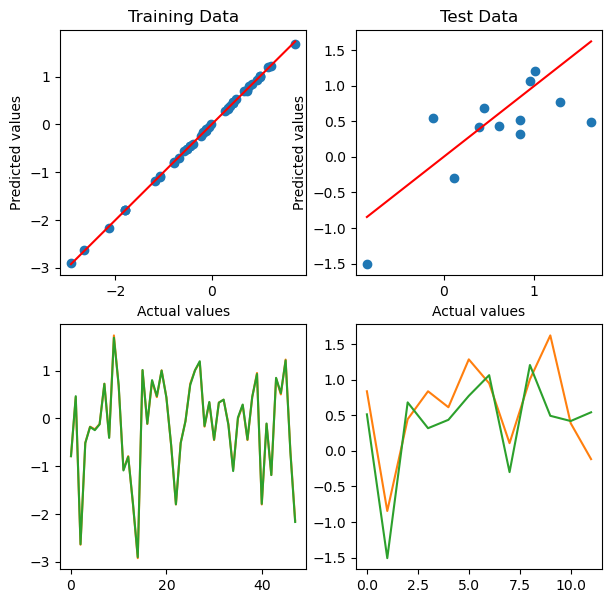

Epoch 34000/100000, Training Loss: 0.0003
Train R²:  0.99974
Test R² :  0.35965


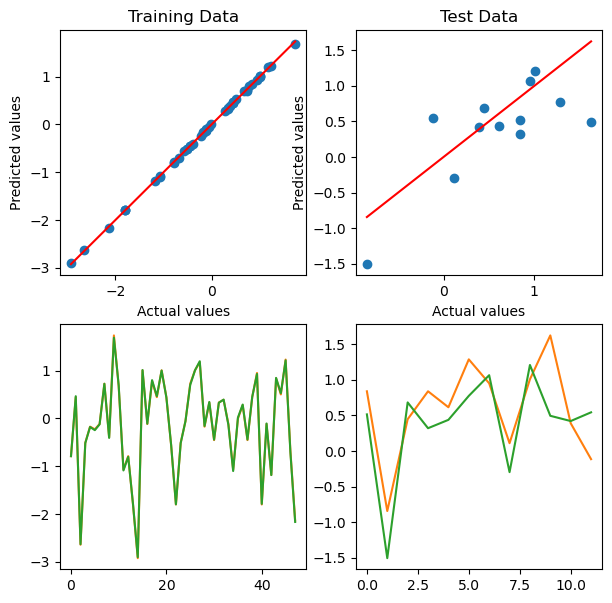

Epoch 35000/100000, Training Loss: 0.0003
Train R²:  0.99975
Test R² :  0.35998


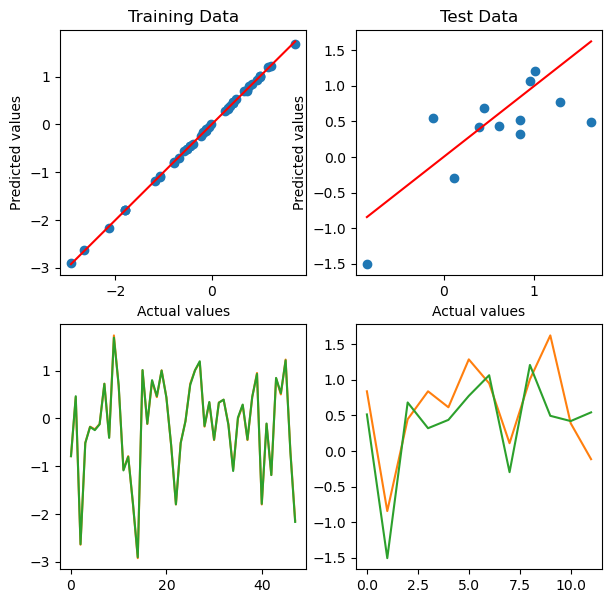

Epoch 36000/100000, Training Loss: 0.0002
Train R²:  0.99976
Test R² :  0.36028


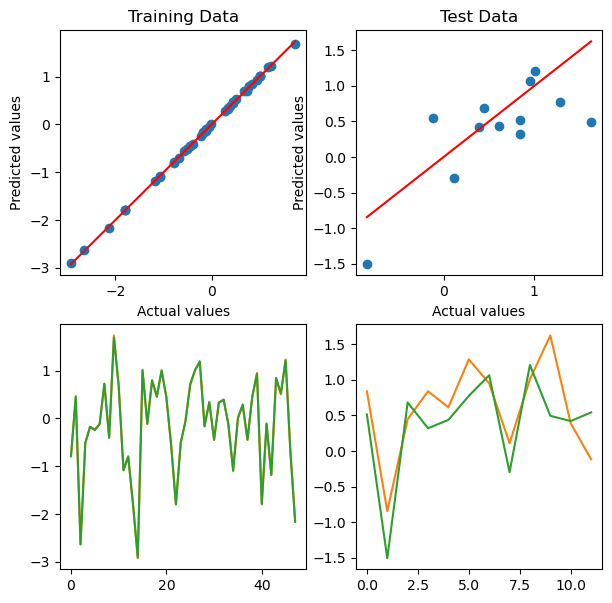

Epoch 37000/100000, Training Loss: 0.0002
Train R²:  0.99977
Test R² :  0.36056


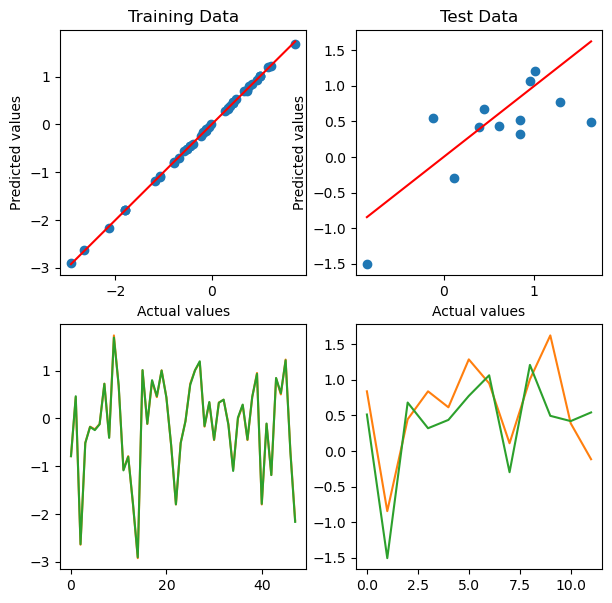

Epoch 38000/100000, Training Loss: 0.0002
Train R²:  0.99978
Test R² :  0.36082


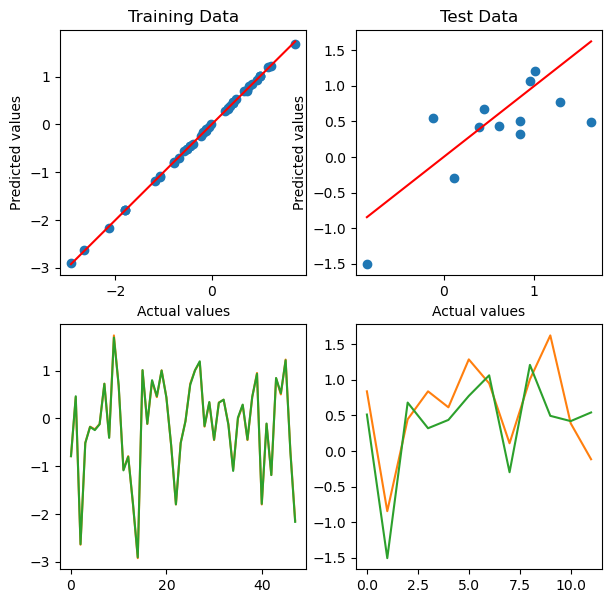

Epoch 39000/100000, Training Loss: 0.0002
Train R²:  0.99979
Test R² :  0.36105


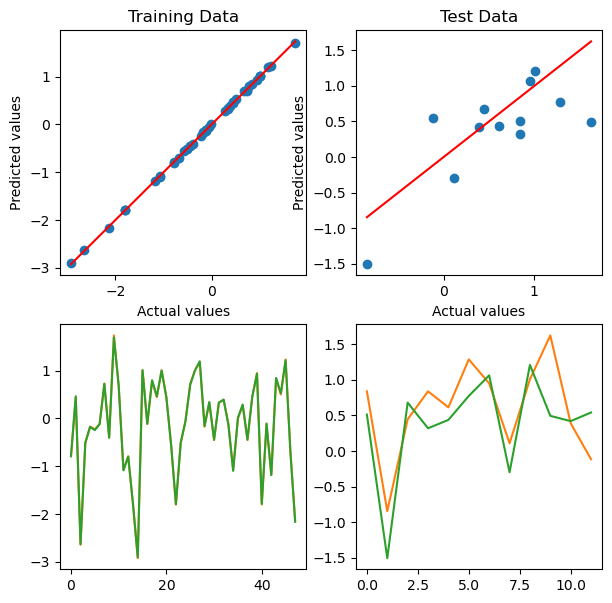

Epoch 40000/100000, Training Loss: 0.0002
Train R²:  0.99979
Test R² :  0.36127


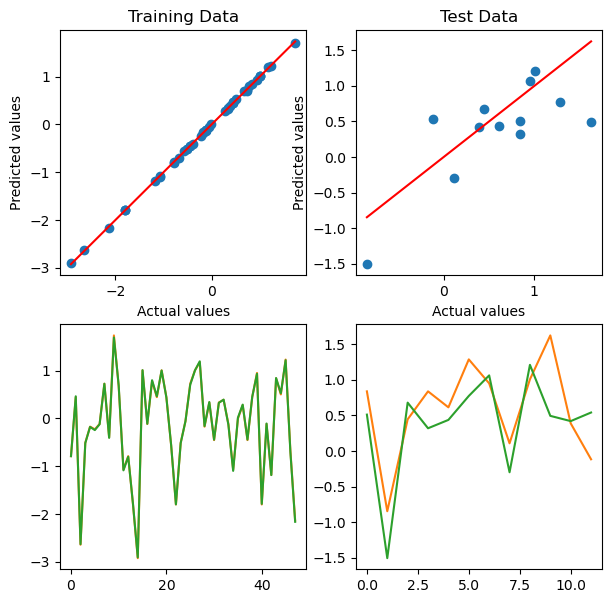

Epoch 41000/100000, Training Loss: 0.0002
Train R²:  0.99980
Test R² :  0.36147


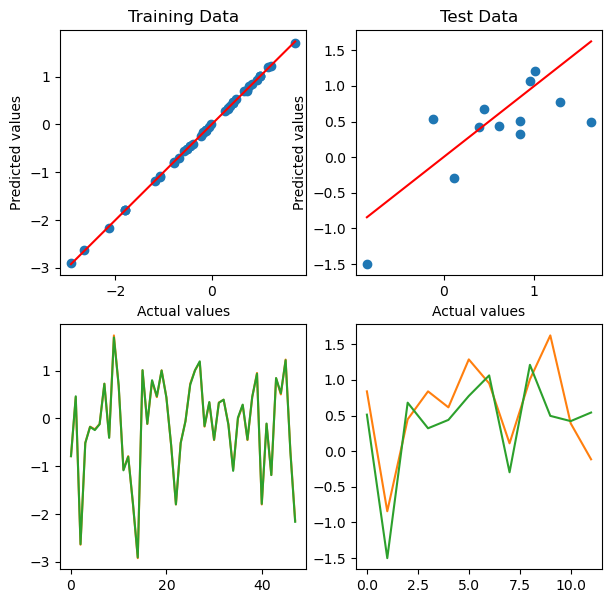

Epoch 42000/100000, Training Loss: 0.0002
Train R²:  0.99981
Test R² :  0.36165


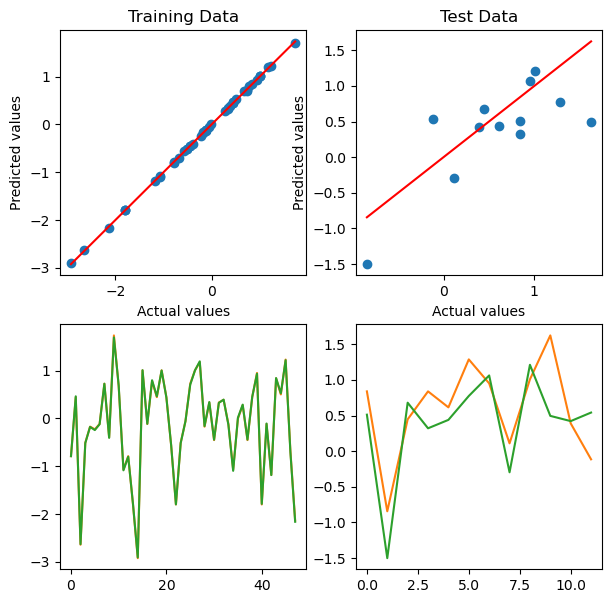

Epoch 43000/100000, Training Loss: 0.0002
Train R²:  0.99981
Test R² :  0.36182


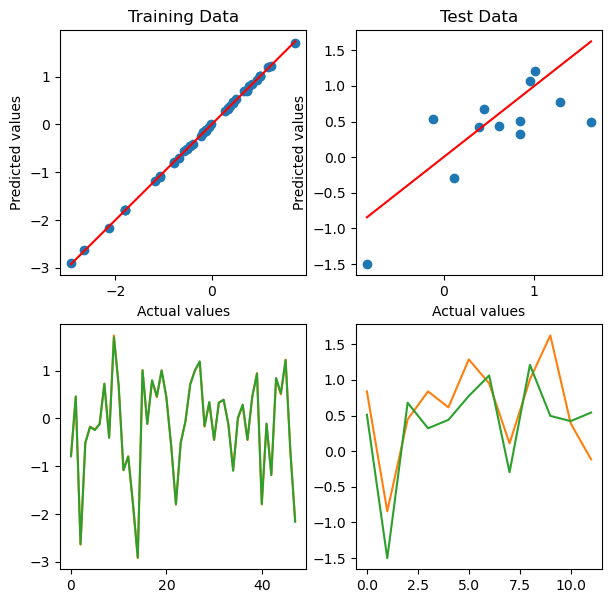

Epoch 44000/100000, Training Loss: 0.0002
Train R²:  0.99982
Test R² :  0.36197


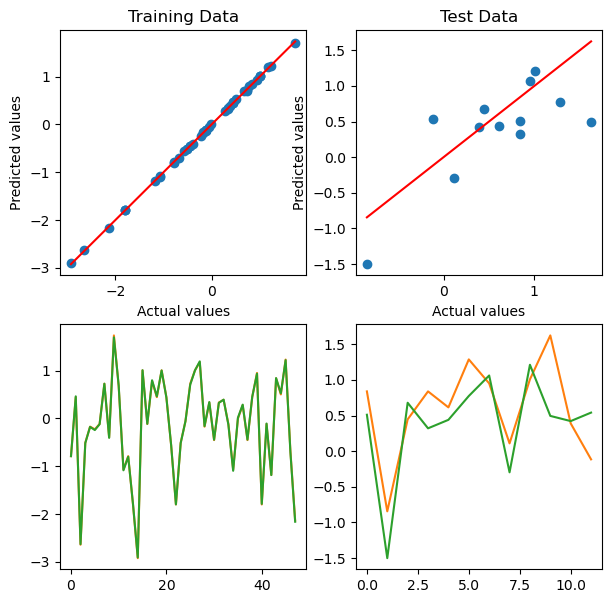

Epoch 45000/100000, Training Loss: 0.0002
Train R²:  0.99982
Test R² :  0.36212


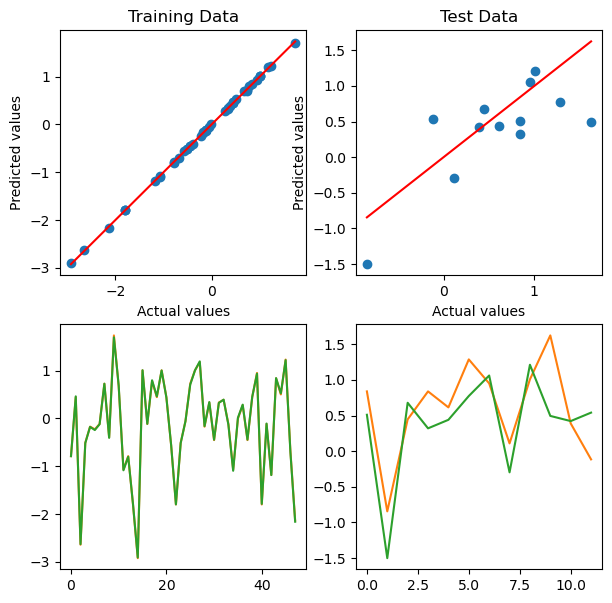

Epoch 46000/100000, Training Loss: 0.0002
Train R²:  0.99983
Test R² :  0.36225


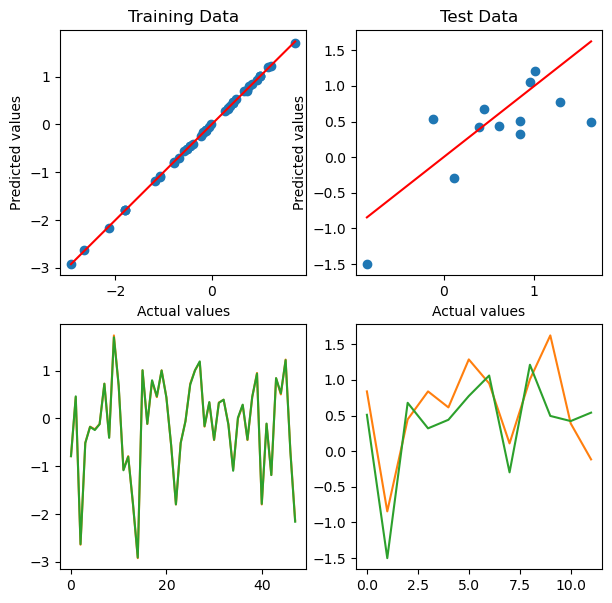

Epoch 47000/100000, Training Loss: 0.0002
Train R²:  0.99983
Test R² :  0.36237


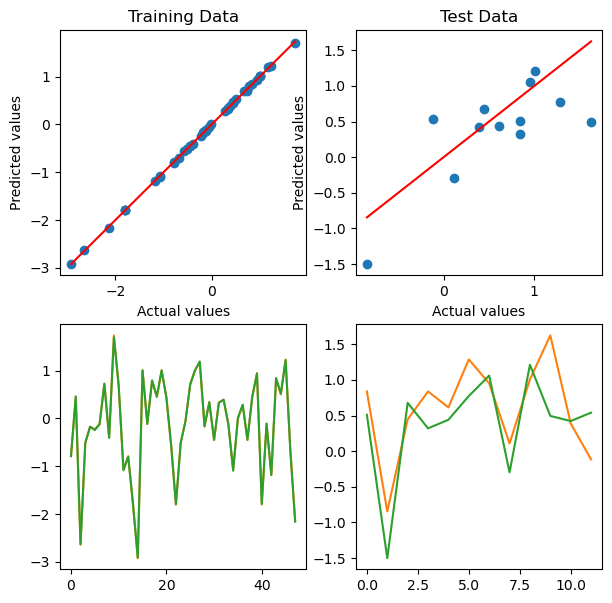

Epoch 48000/100000, Training Loss: 0.0002
Train R²:  0.99984
Test R² :  0.36249


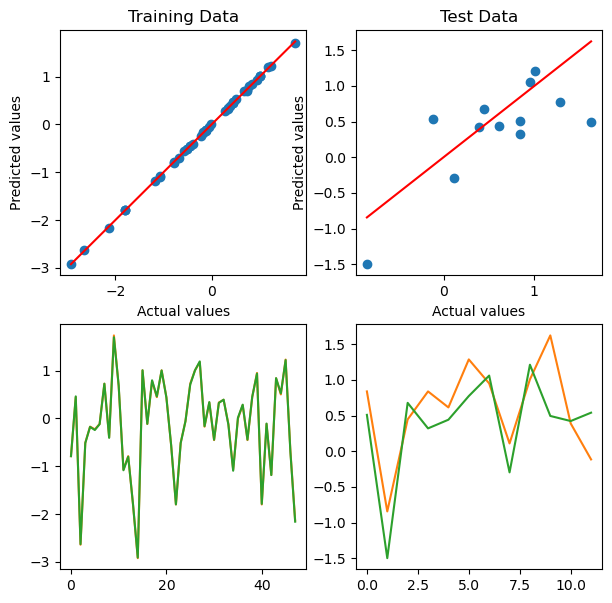

Epoch 49000/100000, Training Loss: 0.0002
Train R²:  0.99984
Test R² :  0.36259


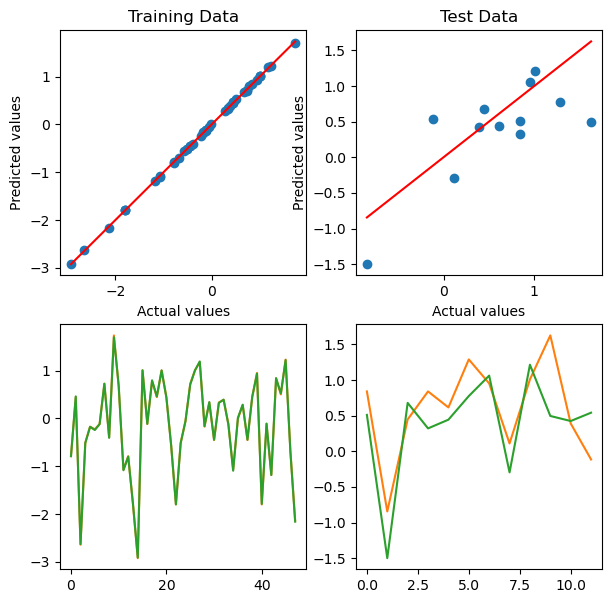

Epoch 50000/100000, Training Loss: 0.0002
Train R²:  0.99985
Test R² :  0.36269


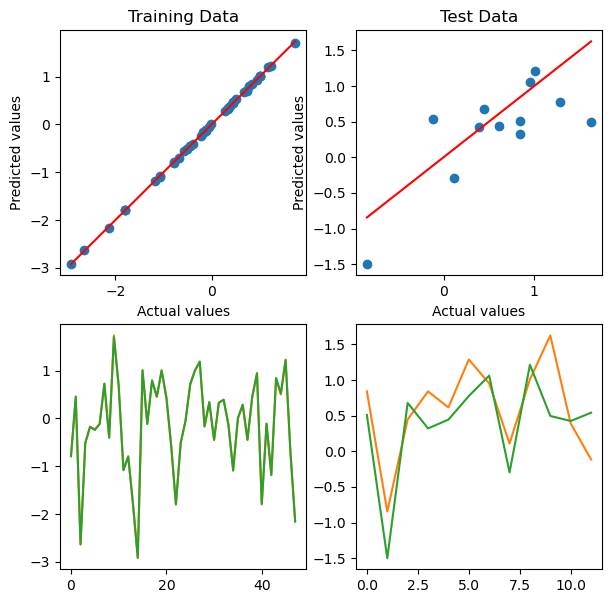

Epoch 51000/100000, Training Loss: 0.0002
Train R²:  0.99985
Test R² :  0.36278


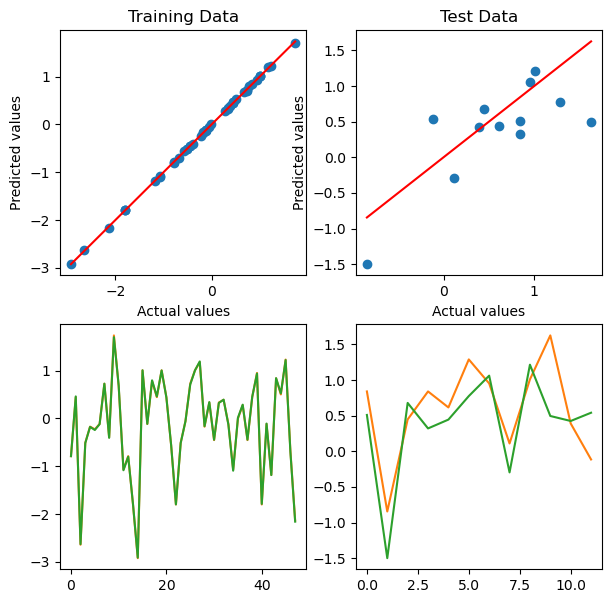

Epoch 52000/100000, Training Loss: 0.0002
Train R²:  0.99985
Test R² :  0.36287


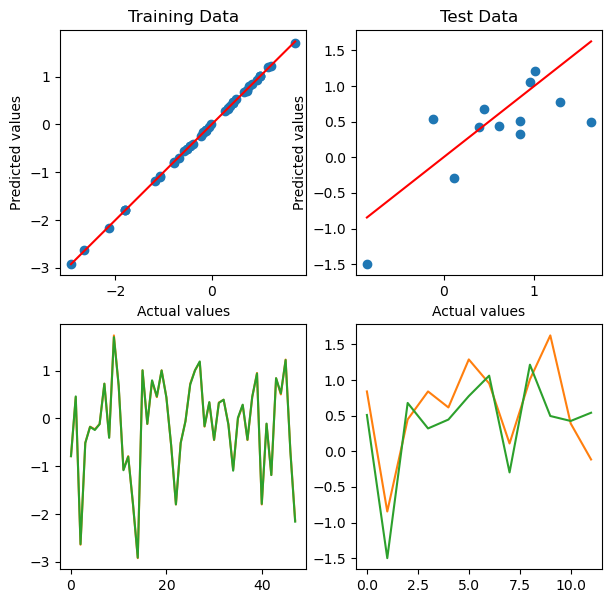

Epoch 53000/100000, Training Loss: 0.0001
Train R²:  0.99986
Test R² :  0.36295


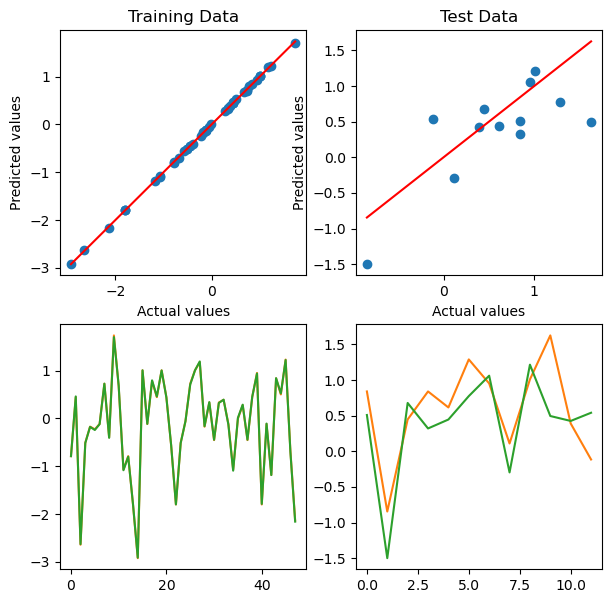

Epoch 54000/100000, Training Loss: 0.0001
Train R²:  0.99986
Test R² :  0.36303


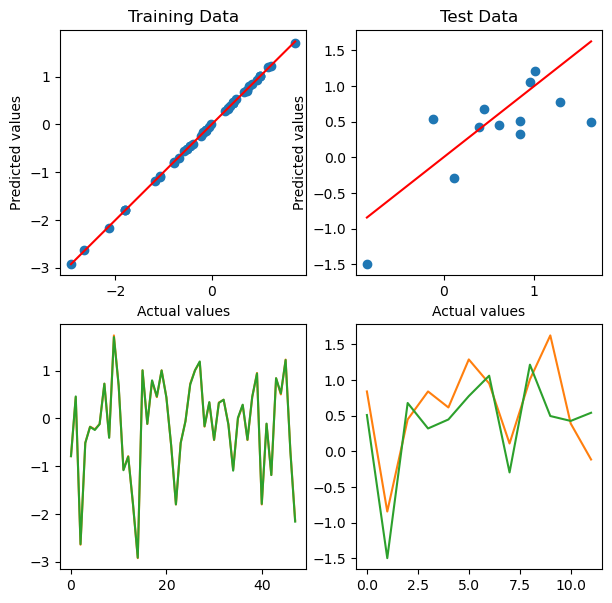

Epoch 55000/100000, Training Loss: 0.0001
Train R²:  0.99986
Test R² :  0.36310


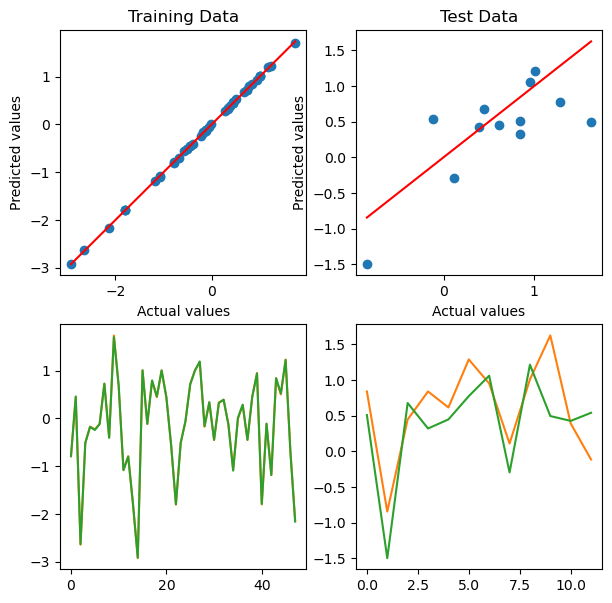

Epoch 56000/100000, Training Loss: 0.0001
Train R²:  0.99987
Test R² :  0.36317


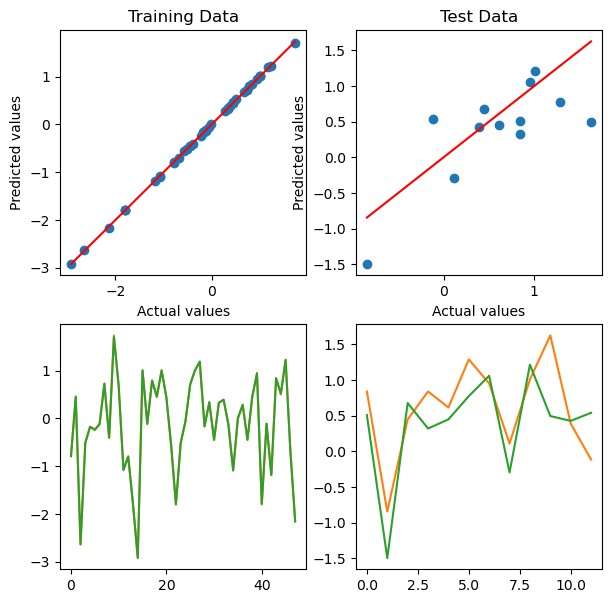

Epoch 57000/100000, Training Loss: 0.0001
Train R²:  0.99987
Test R² :  0.36324


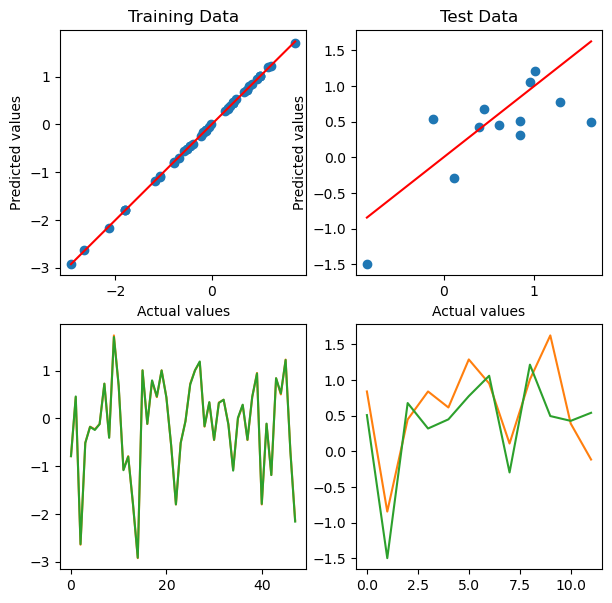

Epoch 58000/100000, Training Loss: 0.0001
Train R²:  0.99987
Test R² :  0.36330


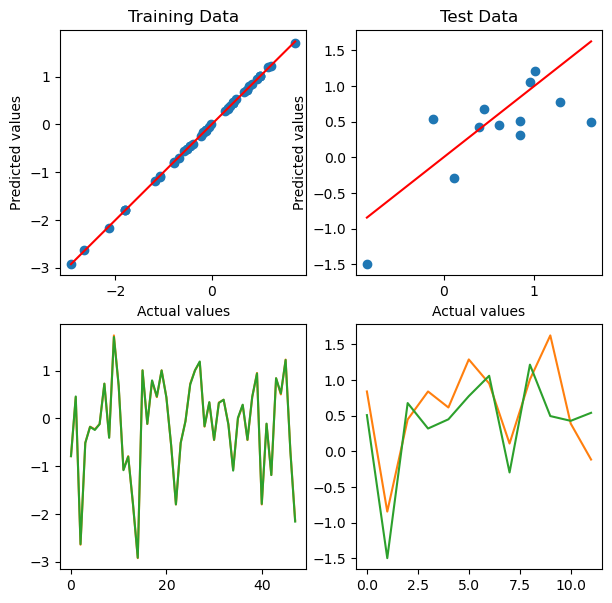

Epoch 59000/100000, Training Loss: 0.0001
Train R²:  0.99988
Test R² :  0.36336


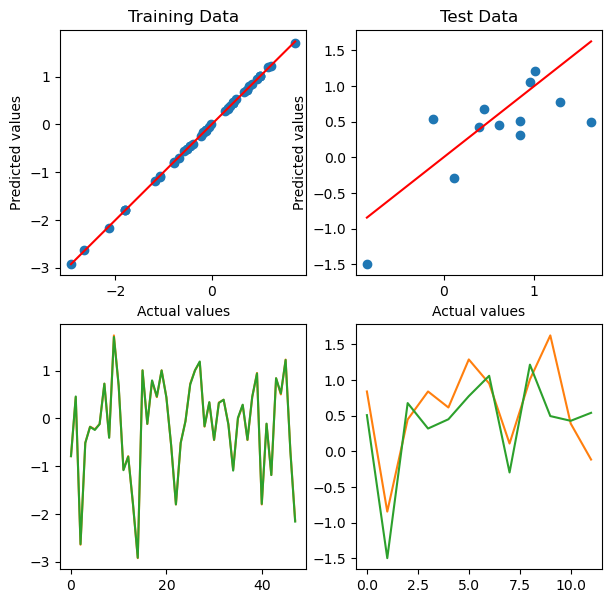

Epoch 60000/100000, Training Loss: 0.0001
Train R²:  0.99988
Test R² :  0.36342


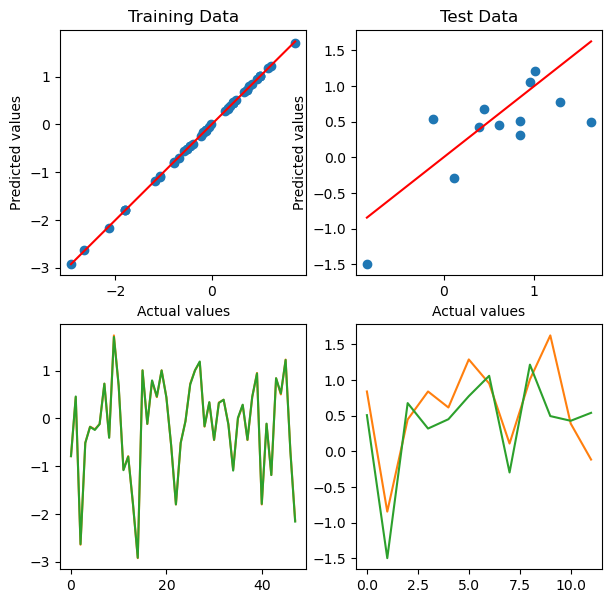

Epoch 61000/100000, Training Loss: 0.0001
Train R²:  0.99988
Test R² :  0.36348


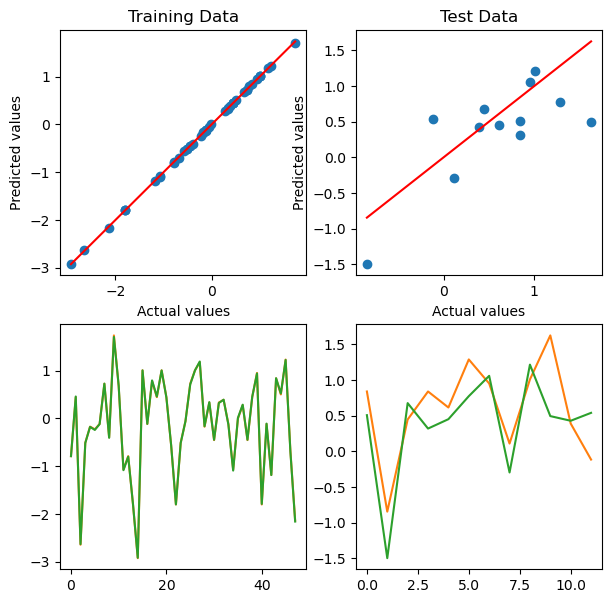

Epoch 62000/100000, Training Loss: 0.0001
Train R²:  0.99988
Test R² :  0.36353


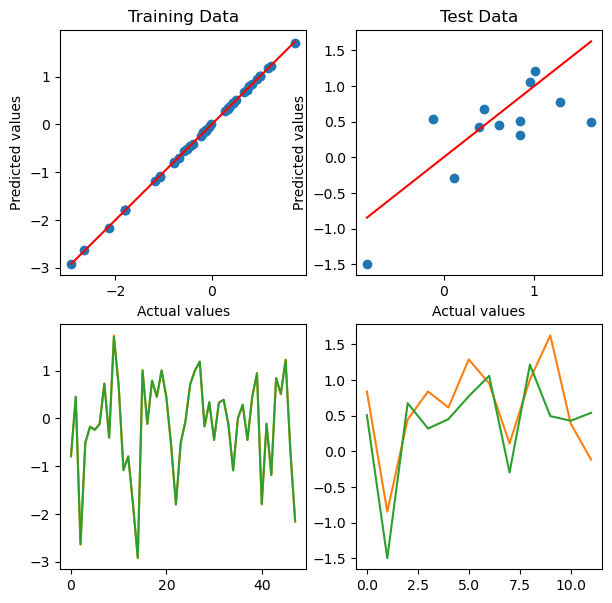

Epoch 63000/100000, Training Loss: 0.0001
Train R²:  0.99988
Test R² :  0.36358


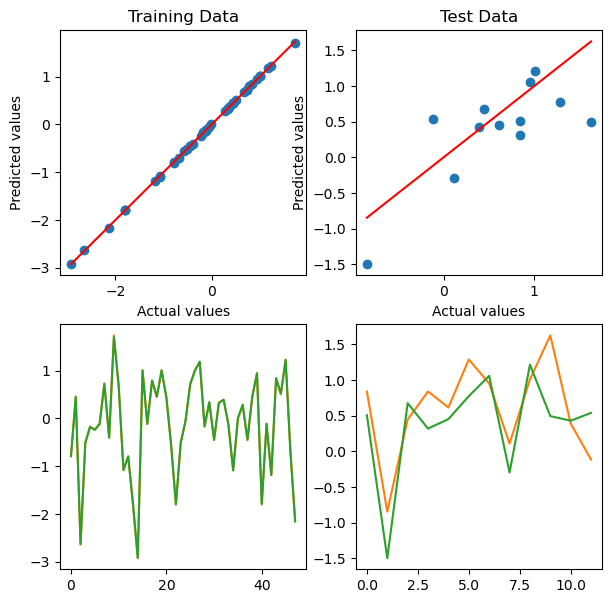

Epoch 64000/100000, Training Loss: 0.0001
Train R²:  0.99989
Test R² :  0.36363


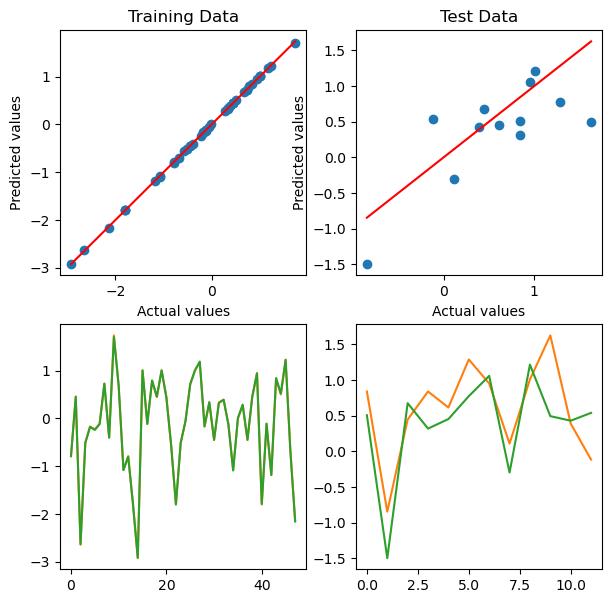

Epoch 65000/100000, Training Loss: 0.0001
Train R²:  0.99989
Test R² :  0.36368


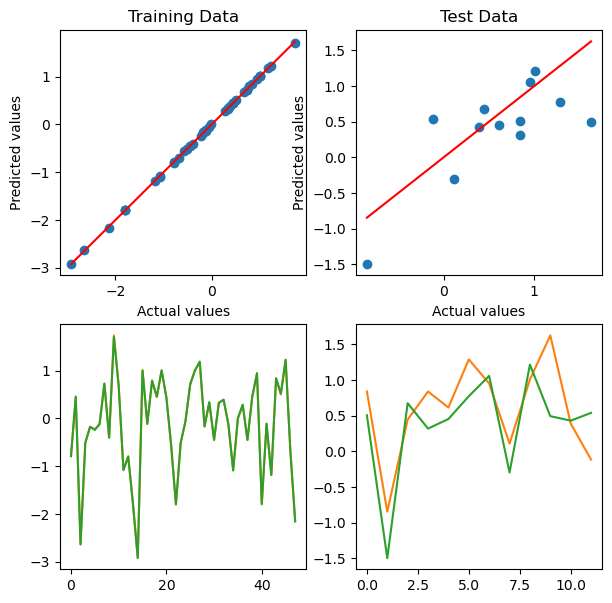

Epoch 66000/100000, Training Loss: 0.0001
Train R²:  0.99989
Test R² :  0.36374


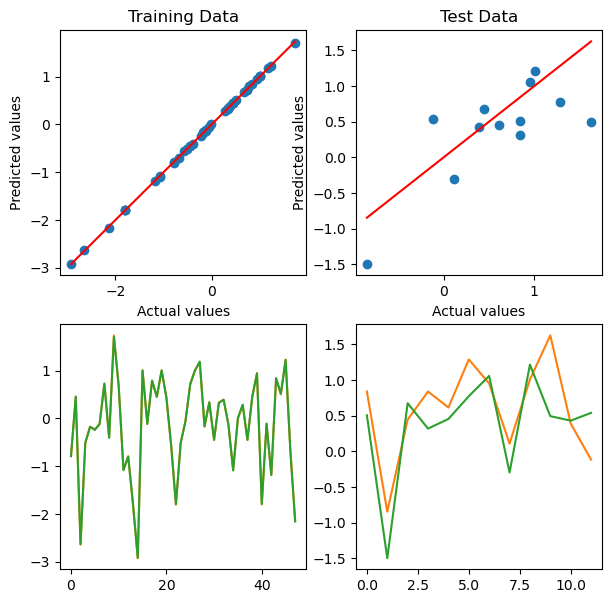

Epoch 67000/100000, Training Loss: 0.0001
Train R²:  0.99989
Test R² :  0.36378


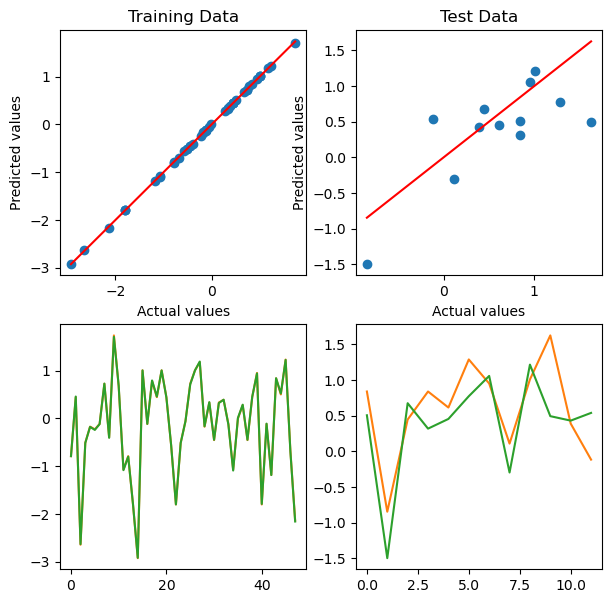

Epoch 68000/100000, Training Loss: 0.0001
Train R²:  0.99989
Test R² :  0.36383


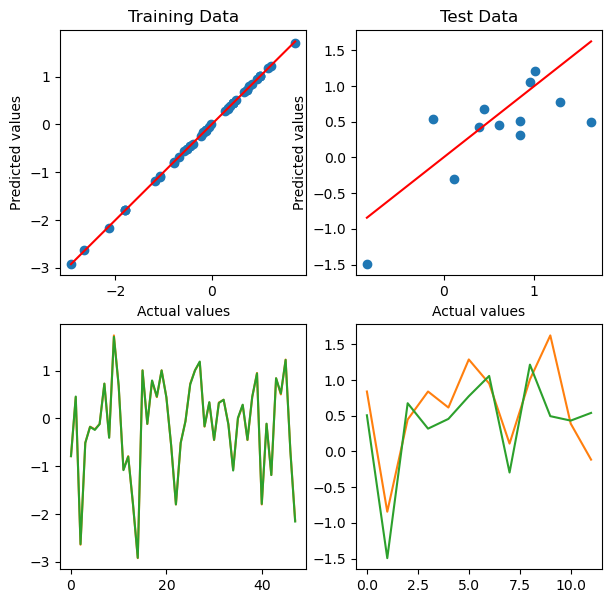

Epoch 69000/100000, Training Loss: 0.0001
Train R²:  0.99990
Test R² :  0.36388


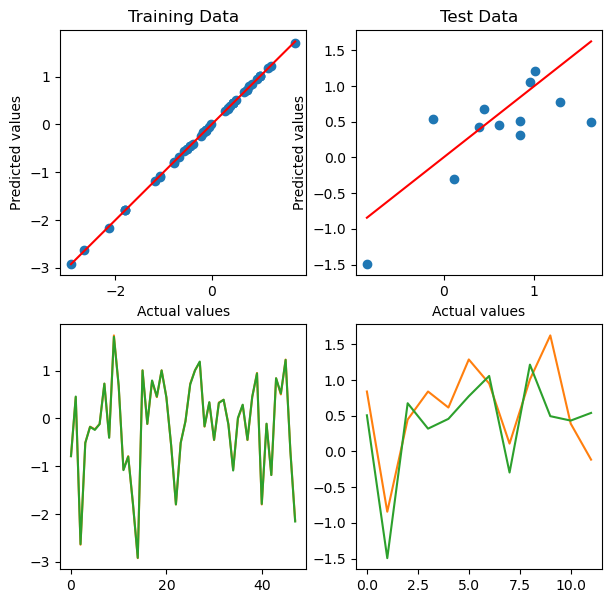

Epoch 70000/100000, Training Loss: 0.0001
Train R²:  0.99990
Test R² :  0.36393


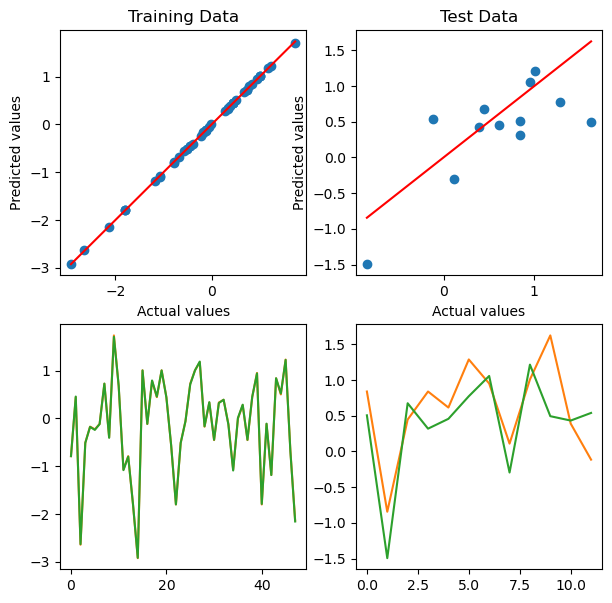

Epoch 71000/100000, Training Loss: 0.0001
Train R²:  0.99990
Test R² :  0.36398


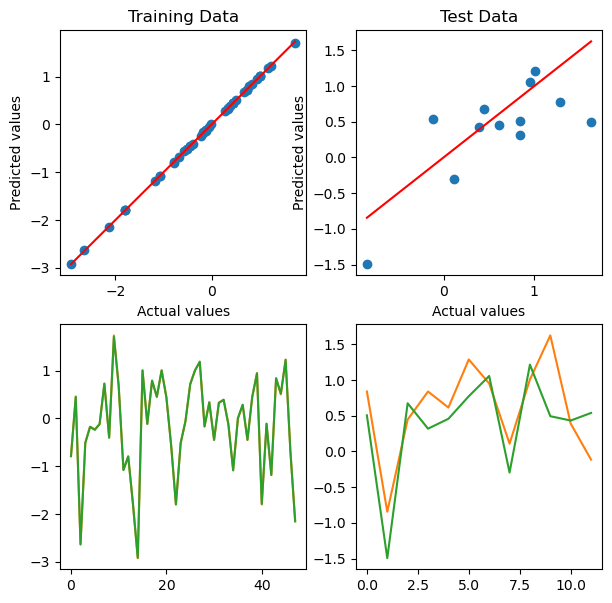

Epoch 72000/100000, Training Loss: 0.0001
Train R²:  0.99990
Test R² :  0.36402


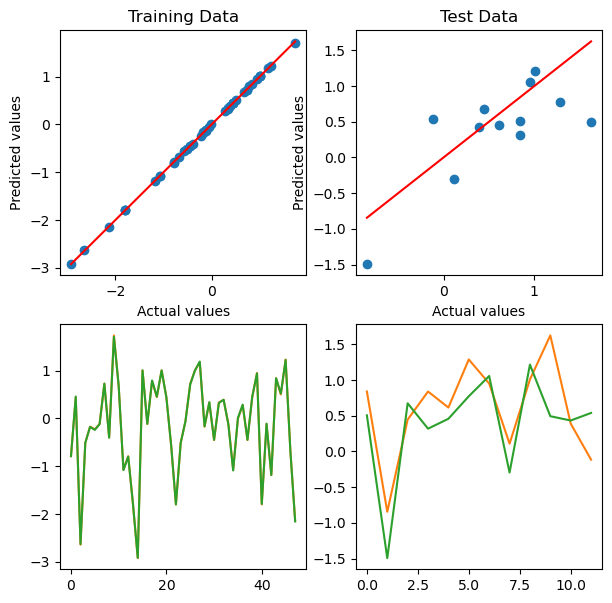

Epoch 73000/100000, Training Loss: 0.0001
Train R²:  0.99990
Test R² :  0.36407


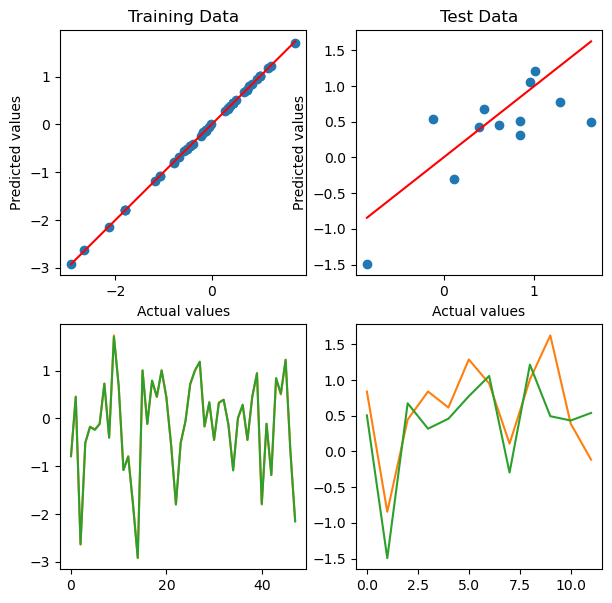

Epoch 74000/100000, Training Loss: 0.0001
Train R²:  0.99990
Test R² :  0.36412


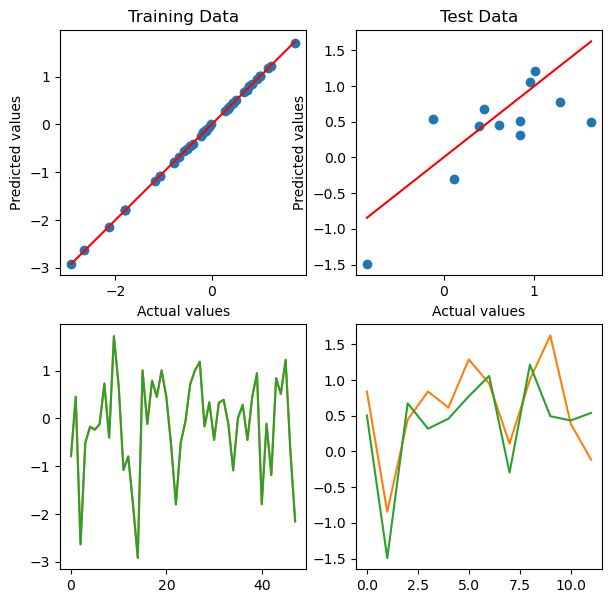

Epoch 75000/100000, Training Loss: 0.0001
Train R²:  0.99991
Test R² :  0.36417


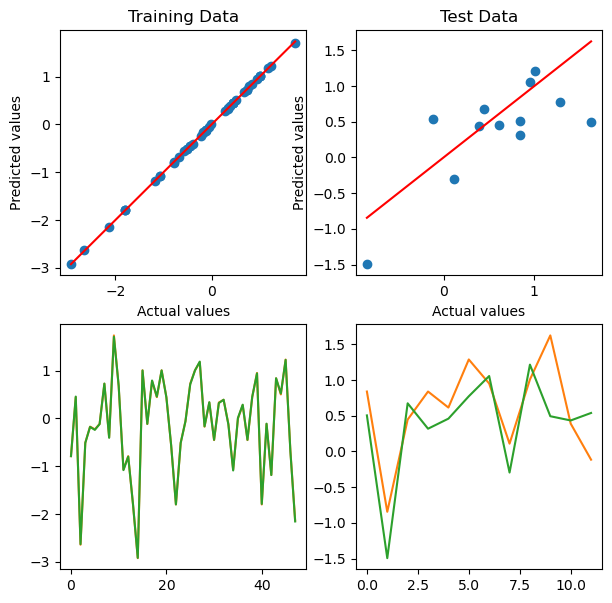

Epoch 76000/100000, Training Loss: 0.0001
Train R²:  0.99991
Test R² :  0.36422


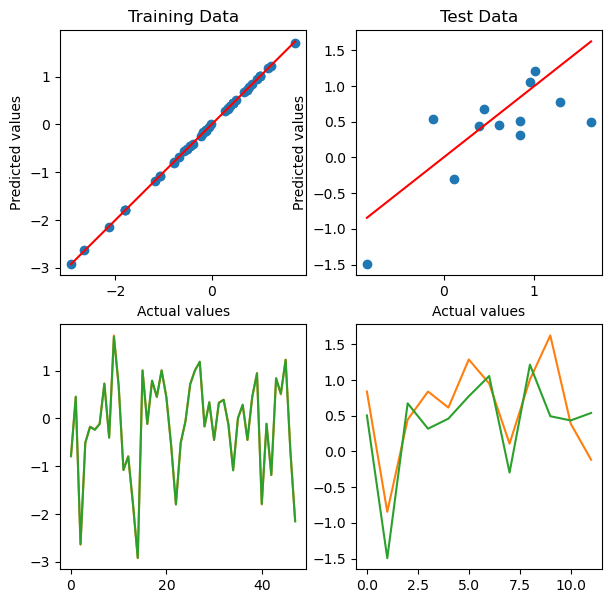

Epoch 77000/100000, Training Loss: 0.0001
Train R²:  0.99991
Test R² :  0.36426


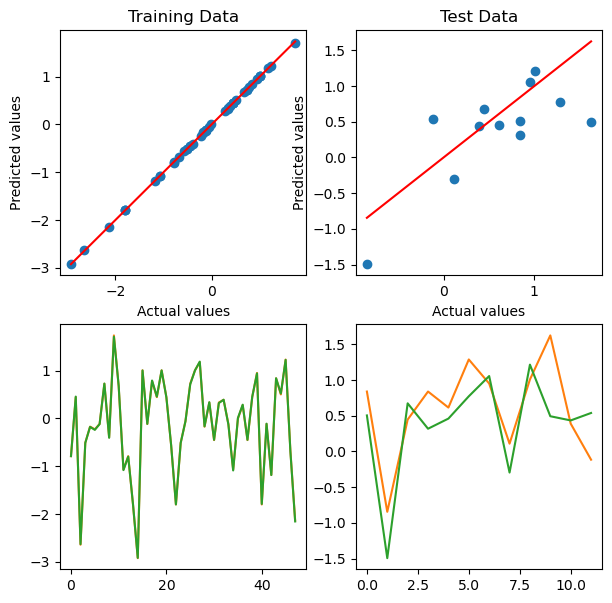

Epoch 78000/100000, Training Loss: 0.0001
Train R²:  0.99991
Test R² :  0.36431


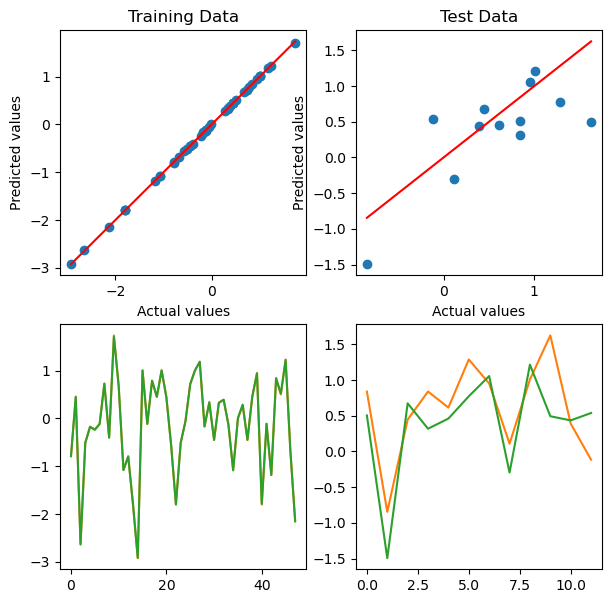

Epoch 79000/100000, Training Loss: 0.0001
Train R²:  0.99991
Test R² :  0.36436


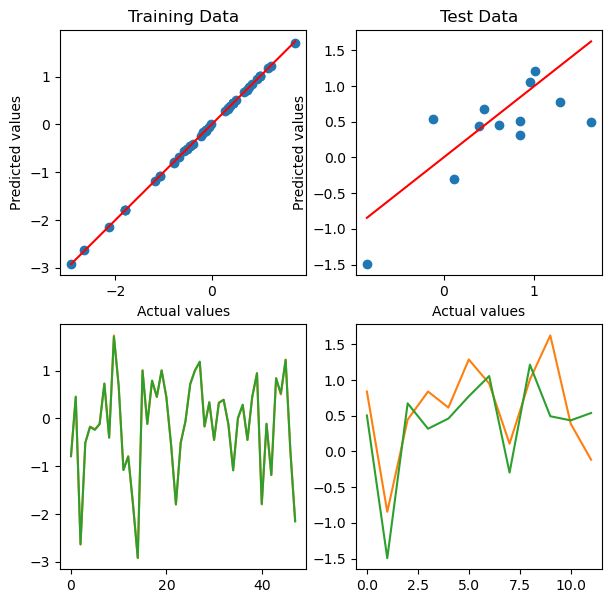

Epoch 80000/100000, Training Loss: 0.0001
Train R²:  0.99991
Test R² :  0.36441


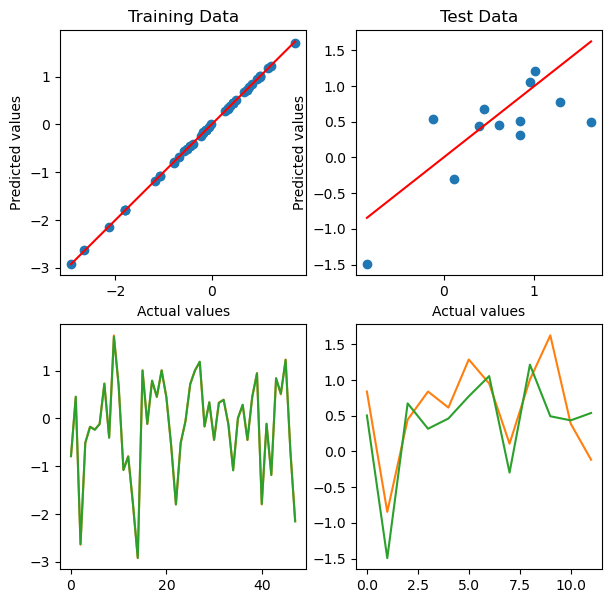

Epoch 81000/100000, Training Loss: 0.0001
Train R²:  0.99991
Test R² :  0.36446


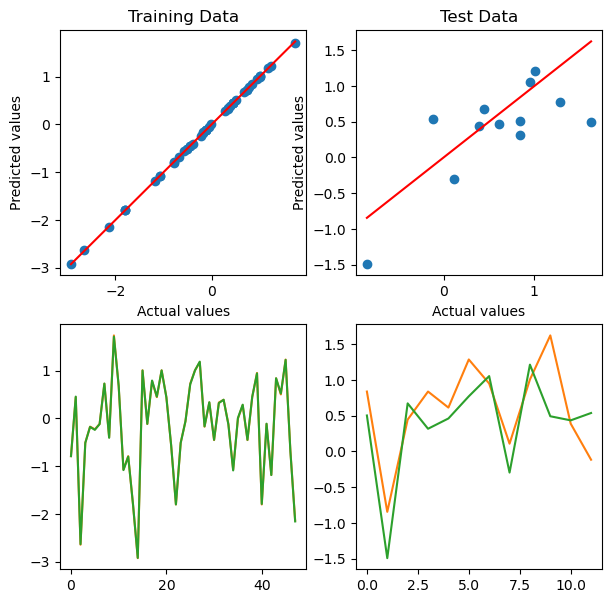

Epoch 82000/100000, Training Loss: 0.0001
Train R²:  0.99992
Test R² :  0.36451


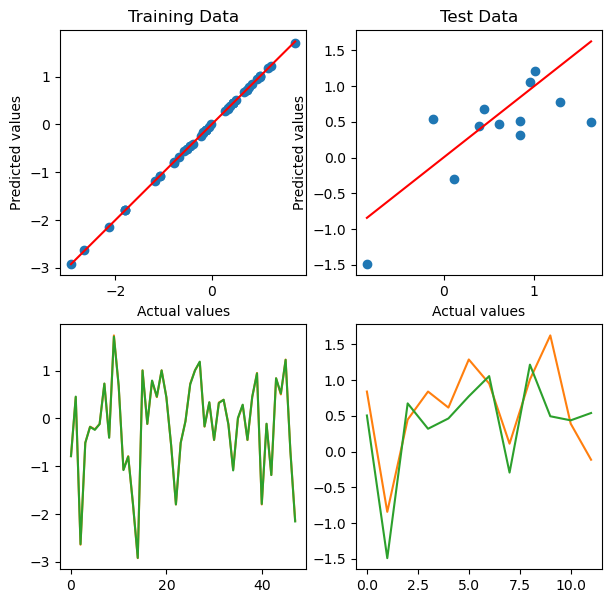

Epoch 83000/100000, Training Loss: 0.0001
Train R²:  0.99992
Test R² :  0.36456


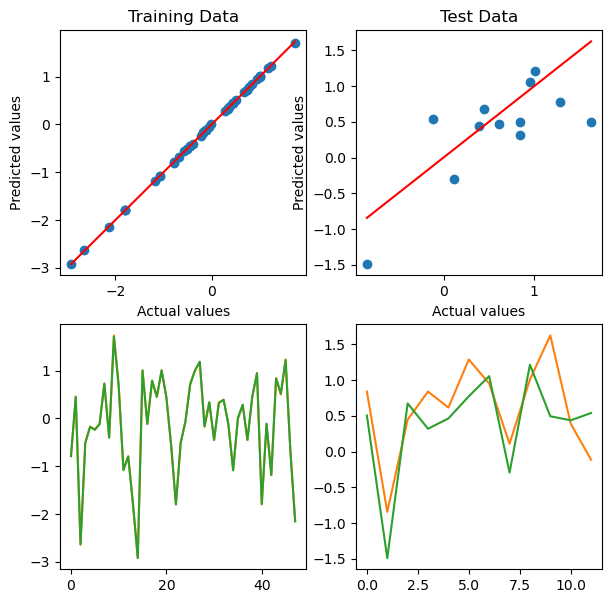

Epoch 84000/100000, Training Loss: 0.0001
Train R²:  0.99992
Test R² :  0.36461


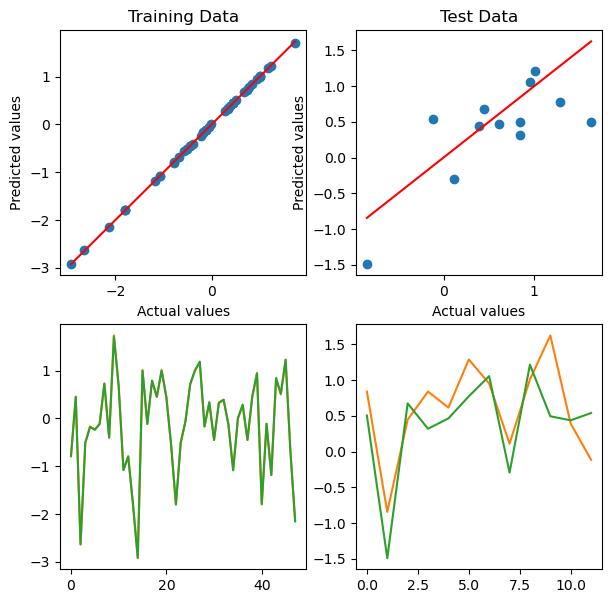

Epoch 85000/100000, Training Loss: 0.0001
Train R²:  0.99992
Test R² :  0.36466


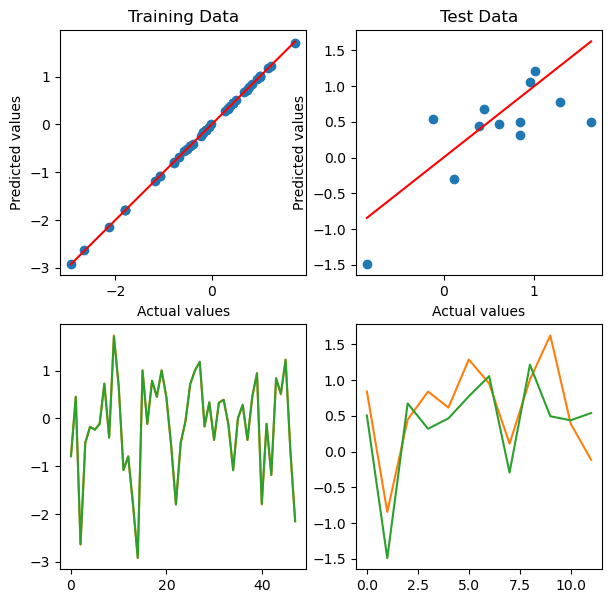

Epoch 86000/100000, Training Loss: 0.0001
Train R²:  0.99992
Test R² :  0.36471


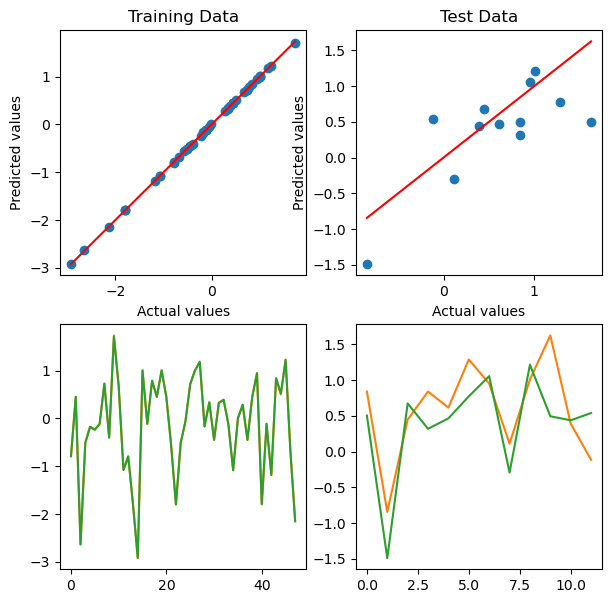

Epoch 87000/100000, Training Loss: 0.0001
Train R²:  0.99992
Test R² :  0.36477


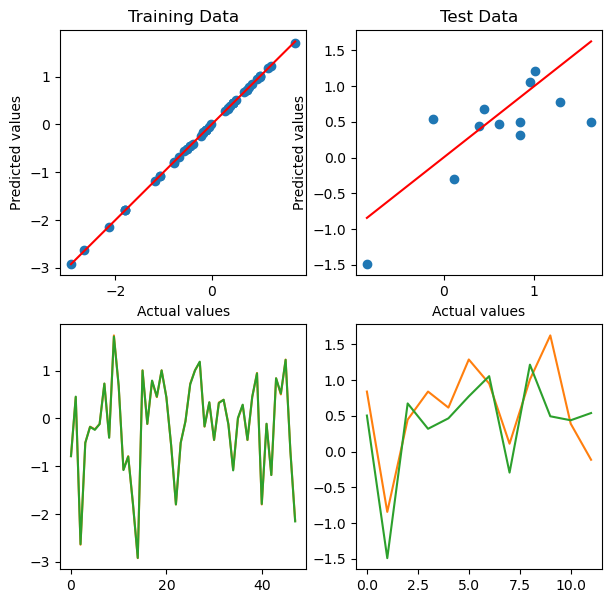

Epoch 88000/100000, Training Loss: 0.0001
Train R²:  0.99992
Test R² :  0.36482


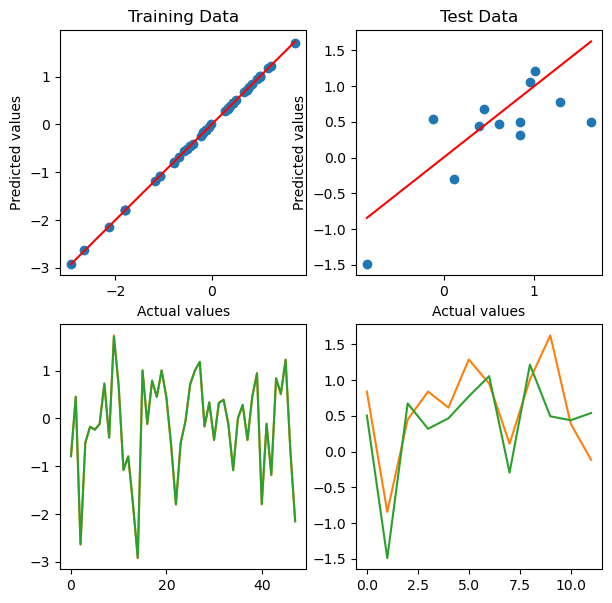

Epoch 89000/100000, Training Loss: 0.0001
Train R²:  0.99992
Test R² :  0.36487


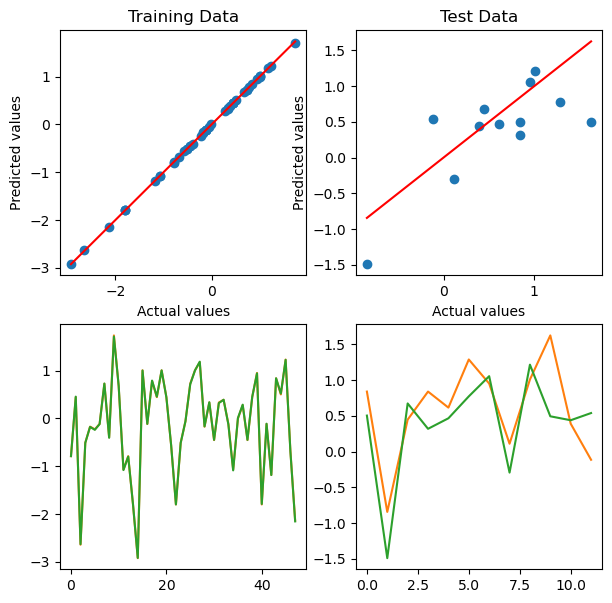

Epoch 90000/100000, Training Loss: 0.0001
Train R²:  0.99992
Test R² :  0.36492


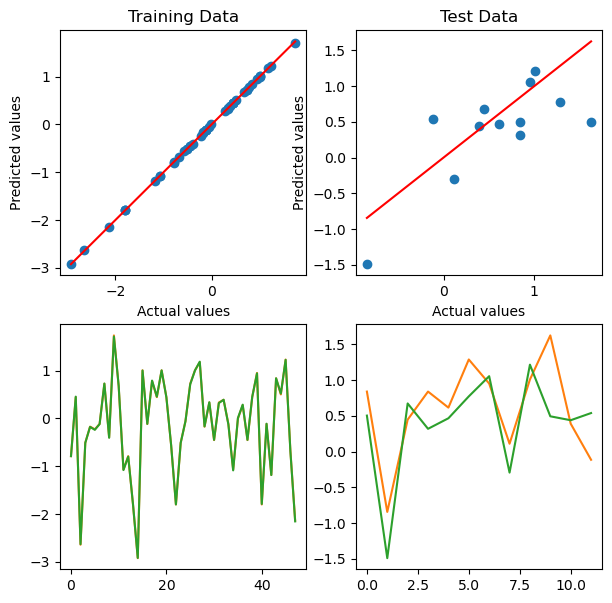

Epoch 91000/100000, Training Loss: 0.0001
Train R²:  0.99992
Test R² :  0.36498


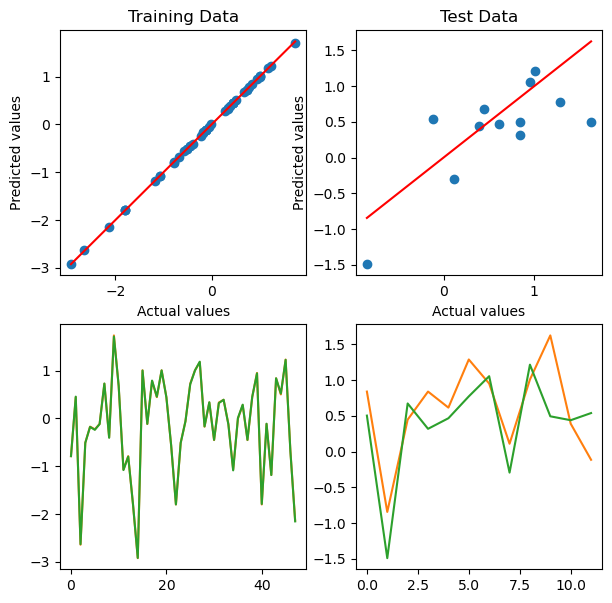

Epoch 92000/100000, Training Loss: 0.0001
Train R²:  0.99993
Test R² :  0.36503


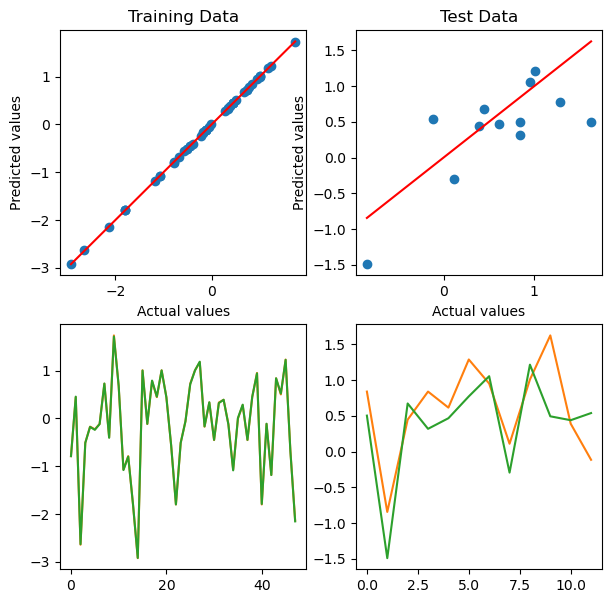

Epoch 93000/100000, Training Loss: 0.0001
Train R²:  0.99993
Test R² :  0.36509


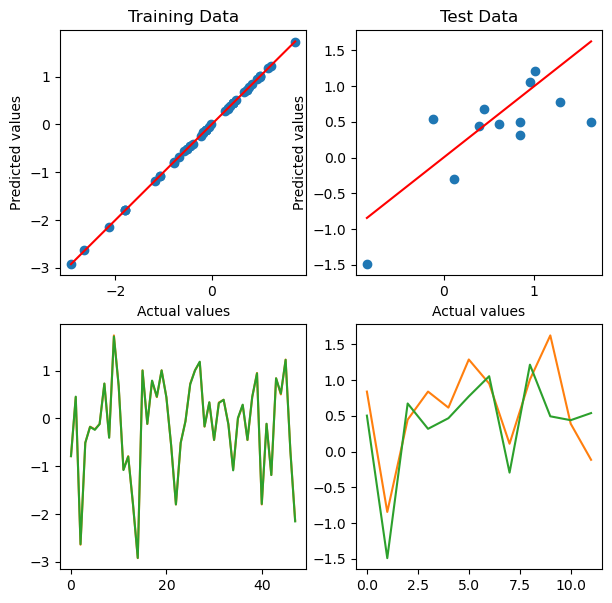

Epoch 94000/100000, Training Loss: 0.0001
Train R²:  0.99993
Test R² :  0.36514


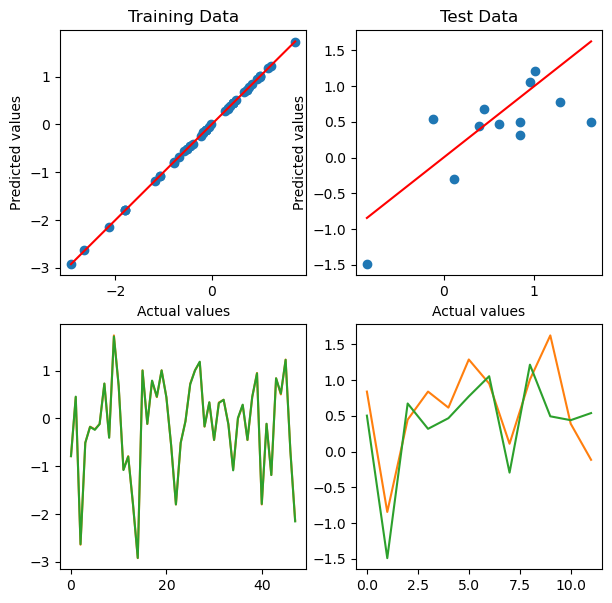

Epoch 95000/100000, Training Loss: 0.0001
Train R²:  0.99993
Test R² :  0.36520


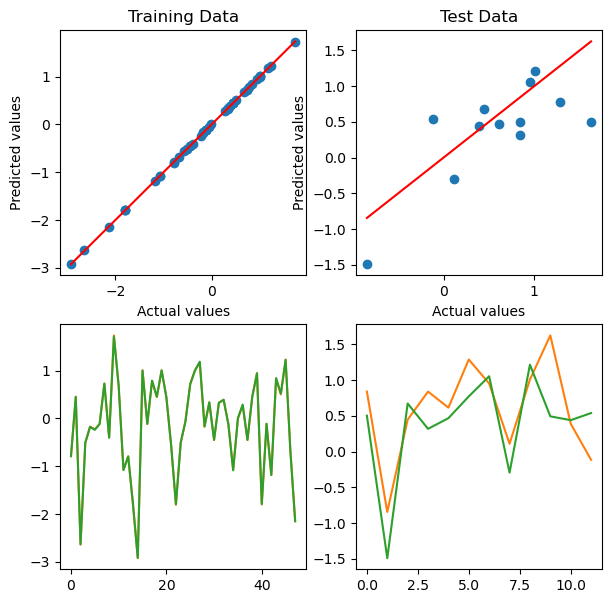

Epoch 96000/100000, Training Loss: 0.0001
Train R²:  0.99993
Test R² :  0.36526


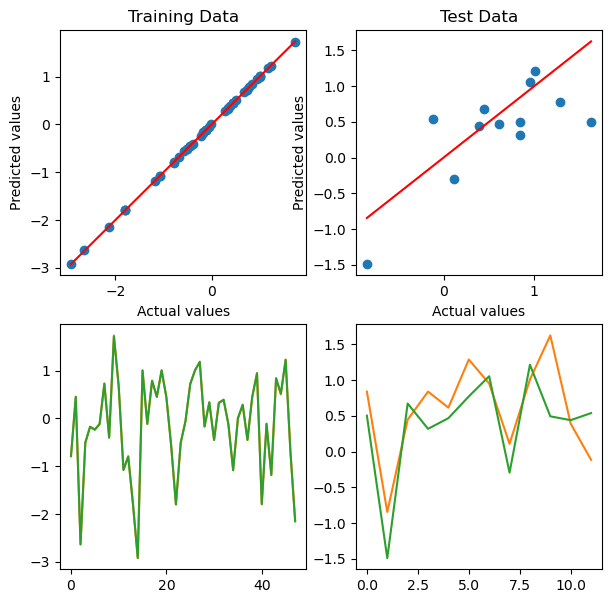

Epoch 97000/100000, Training Loss: 0.0001
Train R²:  0.99993
Test R² :  0.36531


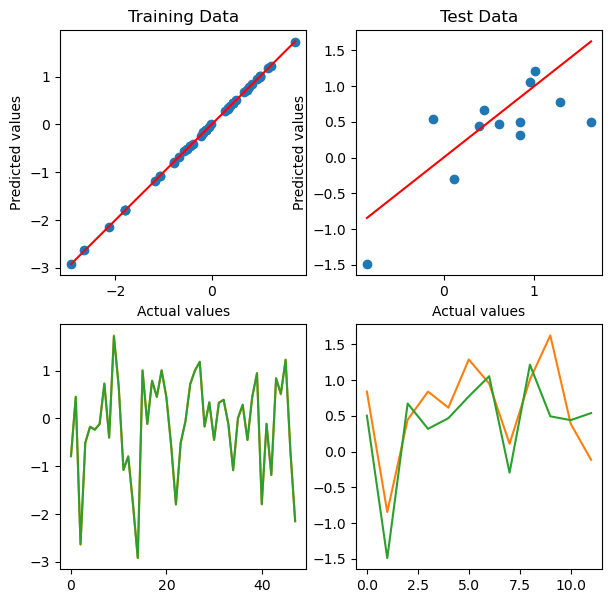

Epoch 98000/100000, Training Loss: 0.0001
Train R²:  0.99993
Test R² :  0.36537


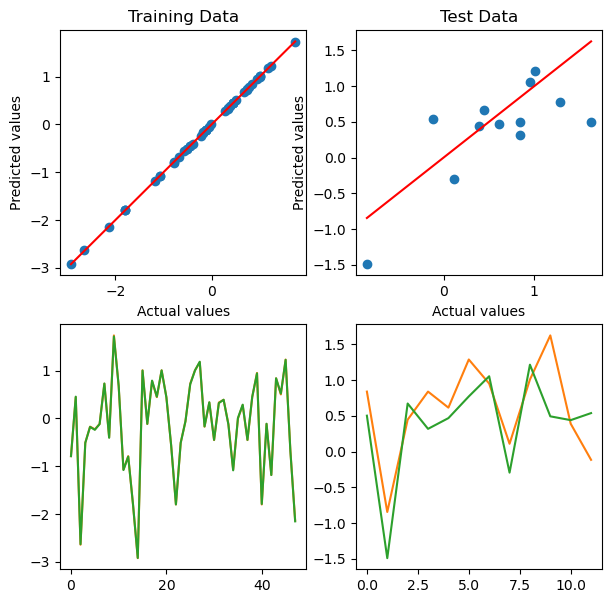

Epoch 99000/100000, Training Loss: 0.0001
Train R²:  0.99993
Test R² :  0.36542


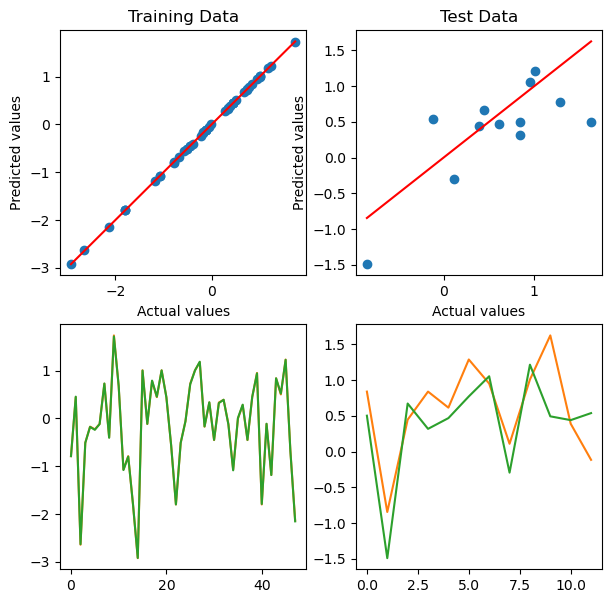

Epoch 100000/100000, Training Loss: 0.0001
Train R²:  0.99993
Test R² :  0.36548


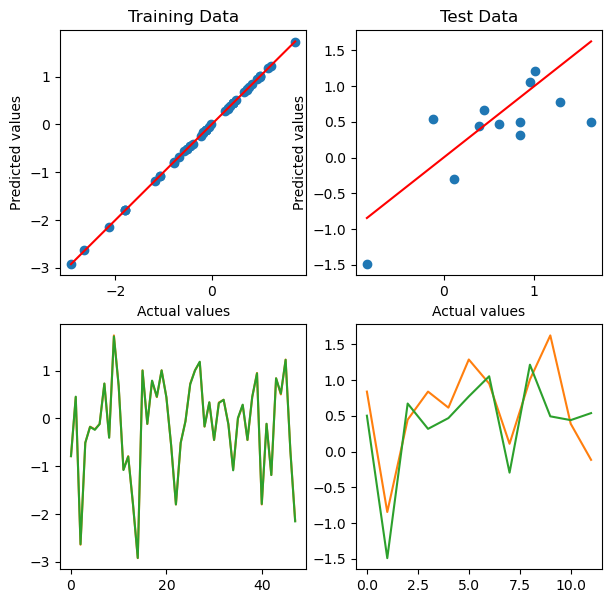

In [13]:
GBR_DNN(6)